In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
from datetime import datetime
from datetime import date
from datetime import timedelta
import glob
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import mean
from sklearn.preprocessing import MinMaxScaler
import itertools
import random
import folium
import matplotlib.colors as mc
from matplotlib.cm import ScalarMappable
from sklearn.metrics import mean_squared_error
from math import sqrt
from numpy import concatenate
from sklearn.preprocessing import LabelEncoder
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM

# **1. Tiền xử lý dữ liệu**

## Load dữ liệu

In [ ]:
def convert_date_format(df, column, old_format, new_format):
  '''Chuyển đổi định dạng datetime của cột'''
  
  for i in range(len(df[column])):
    df[column][i] = datetime.strptime(df[column][i], old_format)
    df[column][i] = df[column][i].strftime(new_format)

In [ ]:
def move_column(df, column, idx):
  '''Chuyển cột sang vị trí mới theo index của cột'''
  
  column_to_move = df.pop(column)
  df.insert(idx, column, column_to_move)

In [ ]:
def append_date_info(df, old_format, new_format):
  '''Thêm cột Weekday và Month để thuận tiện cho phân tích dữ liệu theo thứ và tháng'''
  
  date = df['Date']
  Weekday = []
  Month = []

  for i in range(len(date)):
    date[i] = datetime.strptime(date[i], old_format)
    wd = date[i].strftime("%A")
    mth = date[i].strftime("%m")
    date[i] = date[i].strftime(new_format)
    Weekday.append(wd)
    Month.append(mth)

  df['Date'] = date
  df["Weekday"] = Weekday
  df['Month'] = Month

  move_column(df, 'Weekday', 1)
  move_column(df, 'Month', 2)

In [ ]:
def get_link():
  '''Hàm trả về các link của các file dữ liệu thô'''
  
  path = "/content/drive/MyDrive/Đồ án DS105/data/"
  stations = ['TMU M50 010.0 N', 'TMU M50 015.0 S', 'TMU M50 020.0 N', 'TMU M50 015.0 N']
  link_list = []
  for station in stations:
    link_list.append(glob.glob(path + station + "/*.xlsx"))

  link_list1 = link_list[0]
  link_list2 = link_list[1]
  link_list3 = link_list[2]
  link_list4 = link_list[3]
  weather_link = '/content/drive/MyDrive/Đồ án DS105/data/weather.csv'
  station_details_link = '/content/drive/MyDrive/Đồ án DS105/data/Station Details.csv'

  return link_list1, link_list2, link_list3, link_list4, weather_link, station_details_link

In [ ]:
def load_traffic_and_events(link_list):
  '''Hàm trả về dataframe traffic và events được tách ra từ 1 file chung'''

  traffic_data = pd.DataFrame()
  events_data = pd.DataFrame()

  for link in link_list:
    data = pd.read_excel(link ,skiprows=6, index_col=None, header=None)
    i = data.loc[data[0]=='Events'].index.values
    i = int(i)
    traffic = data[:i]
    events = data[i+1:]
    traffic.dropna(axis = 0, how = 'all', inplace = True)
    traffic[0] = traffic[0].fillna(method='ffill')
    traffic[1] = traffic[1].fillna(method='ffill')
    traffic_data = pd.concat([traffic_data, traffic],axis=0,ignore_index=True)
    events_data = pd.concat([events_data, events],axis=0,ignore_index=True)

  traffic_data.columns = ['Date', 'Time', 'Lane', 'Invalid', 'MBIKE','CAR','LGV','BUS','HGV_RIG','HGV_ART','CARAVAN','Total','HGVs']
  traffic_data.drop(['HGV_RIG','HGV_ART'], axis = 1, inplace = True)
  append_date_info(traffic_data, '%A %d %B %Y', '%Y-%m-%d')

  events_data = events_data.drop_duplicates(subset = [1], keep='first')
  events_data = events_data.drop([0,5,6,7,8,9,10,11,12],axis=1)
  events_data = events_data.rename(columns=events_data.iloc[0]).drop(events_data.index[0])
  events_data = events_data.dropna()
  events_data = events_data.reset_index(drop=True)

  convert_date_format(events_data, 'Start Time', '%d %B %Y %H:%M', '%Y-%m-%d %H:%M')
  convert_date_format(events_data, 'End Time', '%d %B %Y %H:%M', '%Y-%m-%d %H:%M')

  return traffic_data, events_data

In [ ]:
def load_weather(link):
  '''Hàm trả về dataframe weather'''
  data = pd.read_csv(link, skiprows = 15)
  data['Date'], data['Time'] = data['date'].str.split(' ', 1).str
  data = data[['Date', 'Time','rain','temp', 'wetb', 'dewpt', 'vappr','rhum', 'msl']]

  df = data['Date'].str.extract('(2020)')
  idx = df[df[0] == '2020'].index
  data = data.iloc[idx, :]
  data = data.reset_index(drop = True)
  append_date_info(data, '%d/%m/%Y', '%Y-%m-%d')

  return data

In [ ]:
def merge_events(station, events):
  '''Hàm thêm cột 'Events' vào dataframe station dựa trên thông tin từ dataframe events'''
  
  event_date = []
  event_type = []

  for i in range(events.shape[0] - 1):
    start = events['Start Time'][i]
    end = events['End Time'][i]
    dates = pd.date_range(start = start, end = end, freq = 'D').format()
    event_date.append(dates)
    event_type.append([events['Type'][i]]*len(dates))

  event_date = list(itertools.chain.from_iterable(event_date))
  event_type = list(itertools.chain.from_iterable(event_type))
  dict = {'Date': event_date, 'Events': event_type}
  df = pd.DataFrame(dict)
  df = df.drop_duplicates(subset = ['Date'], keep='first')

  new_station = station.merge(df, how='left', on='Date', sort = True)
  new_station.loc[(new_station['Date'] == '2020-05-11') & ((new_station['Time'] == '06:00') | (new_station['Time'] == '07:00') |
                  (new_station['Time'] == '08:00')), 'Events'] = 'Special'
  new_station.fillna('None', inplace = True)
  return new_station

In [ ]:
def load_data():
  '''Hàm trả về các dataframe đã đượct tiền xử lý'''
  link_list1, link_list2, link_list3, link_list4, weather_link, station_details_link = get_link()
  station_details = pd.read_csv(station_details_link)
  station1, events1 = load_traffic_and_events(link_list1)
  station2, events2 = load_traffic_and_events(link_list2)
  station3, events3 = load_traffic_and_events(link_list3)
  station4, events4 = load_traffic_and_events(link_list4)
  weather = load_weather(weather_link)

  events = pd.concat([events1, events2, events3, events4], axis = 0)
  events.drop_duplicates(keep = 'first', inplace = True)
  events = events.reset_index(drop = True)

  station1 = merge_events(station1, events)
  station2 = merge_events(station2, events)
  station3 = merge_events(station3, events)
  station4 = merge_events(station4, events)

  station1.replace('-', np.nan, inplace = True)
  station2.replace('-', np.nan, inplace = True)
  station3.replace('-', np.nan, inplace = True)
  station4.replace('-', np.nan, inplace = True)

  return station_details, station1, station2, station3, station4, events, weather

In [ ]:
station_details, station1, station2, station3, station4, events, weather = load_data()

<ipython-input-176-2396310a9d07>:9: DtypeWarning:

Columns (2,4,6,7,8,9,10) have mixed types.Specify dtype option on import or set low_memory=False.

<ipython-input-174-356b4707132c>:4: FutureWarning:

Columnar iteration over characters will be deprecated in future releases.



In [ ]:
print(station1.shape)
print(station2.shape)
print(station3.shape)
print(station4.shape)

(70272, 14)
(70272, 14)
(70272, 14)
(79056, 14)


In [ ]:
station1.head(10)

,Date,Weekday,Month,Time,Lane,Invalid,MBIKE,CAR,LGV,BUS,CARAVAN,Total,HGVs,Events
0,2020-01-01,Wednesday,01,00:00,Northbound 1,0.0,0.0,91.0,2.0,0.0,0.0,93.0,0.0,Holiday
1,2020-01-01,Wednesday,01,00:00,Northbound 2,0.0,0.0,152.0,14.0,6.0,1.0,175.0,2.0,Holiday
2,2020-01-01,Wednesday,01,00:00,Northbound 3,0.0,0.0,175.0,8.0,1.0,0.0,184.0,0.0,Holiday
3,2020-01-01,Wednesday,01,00:00,Northbound 4,0.0,0.0,41.0,1.0,0.0,0.0,42.0,0.0,Holiday
4,2020-01-01,Wednesday,01,00:00,Southbound 4,0.0,0.0,33.0,8.0,0.0,0.0,41.0,0.0,Holiday
5,2020-01-01,Wednesday,01,00:00,Southbound 3,0.0,0.0,170.0,13.0,3.0,0.0,187.0,1.0,Holiday
6,2020-01-01,Wednesday,01,00:00,Southbound 2,0.0,0.0,180.0,19.0,7.0,0.0,214.0,8.0,Holiday
7,2020-01-01,Wednesday,01,00:00,Southbound 1,0.0,0.0,141.0,11.0,1.0,0.0,154.0,1.0,Holiday
8,2020-01-01,Wednesday,01,01:00,Northbound 1,0.0,0.0,137.0,5.0,0.0,0.0,142.0,0.0,Holiday
9,2020-01-01,Wednesday,01,01:00,Northbound 2,0.0,0.0,200.0,21.0,6.0,0.0,234.0,7.0,Holiday


In [ ]:
station4.head(10)

,Date,Weekday,Month,Time,Lane,Invalid,MBIKE,CAR,LGV,BUS,CARAVAN,Total,HGVs,Events
0,2020-01-01,Wednesday,01,00:00,Southbound 1,0.0,0.0,74.0,3.0,14.0,0.0,95.0,4.0,Holiday
1,2020-01-01,Wednesday,01,00:00,Southbound 2,0.0,0.0,165.0,21.0,1.0,0.0,189.0,2.0,Holiday
2,2020-01-01,Wednesday,01,00:00,Southbound 3,0.0,1.0,162.0,14.0,0.0,0.0,177.0,0.0,Holiday
3,2020-01-01,Wednesday,01,00:00,Southbound 4,0.0,0.0,32.0,1.0,0.0,0.0,33.0,0.0,Holiday
4,2020-01-01,Wednesday,01,00:00,Northbound off slip 1,0.0,0.0,151.0,4.0,1.0,0.0,157.0,1.0,Holiday
5,2020-01-01,Wednesday,01,00:00,Northbound off slip 2,0.0,8.0,47.0,7.0,0.0,0.0,66.0,4.0,Holiday
6,2020-01-01,Wednesday,01,00:00,Northbound 1,0.0,0.0,164.0,5.0,1.0,0.0,171.0,1.0,Holiday
7,2020-01-01,Wednesday,01,00:00,Northbound 2,0.0,1.0,222.0,17.0,1.0,0.0,245.0,4.0,Holiday
8,2020-01-01,Wednesday,01,00:00,Northbound 3,0.0,0.0,44.0,3.0,0.0,0.0,47.0,0.0,Holiday
9,2020-01-01,Wednesday,01,01:00,Southbound 1,0.0,0.0,88.0,4.0,3.0,0.0,98.0,3.0,Holiday


In [ ]:
weather.head()

,Date,Weekday,Month,Time,rain,temp,wetb,dewpt,vappr,rhum,msl
0,2020-01-01,Wednesday,01,0:00,0.0,6.8,5.7,4.3,8.3,83,1030.2
1,2020-01-01,Wednesday,01,1:00,0.0,6.9,5.8,4.3,8.3,83,1029.7
2,2020-01-01,Wednesday,01,2:00,0.0,6.2,4.9,3.0,7.6,80,1029.4
3,2020-01-01,Wednesday,01,3:00,0.0,4.4,3.5,2.3,7.2,85,1028.6
4,2020-01-01,Wednesday,01,4:00,0.0,2.4,1.9,1.1,6.6,90,1027.8


In [ ]:
events

,Start Time,End Time,Description,Type
0,2020-01-01 00:00,2020-01-02 00:00,New Year's Day,Holiday
1,2020-03-17 00:00,2020-03-18 00:00,St. Patrick’s Day,Holiday
2,2020-04-10 00:00,2020-04-11 00:00,Good Friday,Holiday
3,2020-04-12 00:00,2020-04-13 00:00,Easter Sunday,Holiday
4,2020-04-13 00:00,2020-04-14 00:00,Easter Monday,Holiday
5,2020-05-04 00:00,2020-05-05 00:00,May Day,Holiday
6,2020-06-01 00:00,2020-06-02 00:00,First Monday in June,Holiday
7,2020-08-03 00:00,2020-08-04 00:00,First Monday in August,Holiday
8,2020-10-26 00:00,2020-10-27 00:00,October Bank Holiday,Holiday
9,2020-12-25 00:00,2020-12-26 00:00,Christmas Day,Holiday


In [ ]:
station_details

,Name,Type,Latitude,Longitude,Label
0,TMU M50 010.0 N,Traffic,53.39524,-6.33667,station1
1,TMU M50 015.0 S,Traffic,53.37088,-6.37571,station2
2,TMU M50 020.0 N,Traffic,53.34553,-6.38715,station3
3,TMU M50 015.0 N,Traffic,53.31346,-6.36333,station4
4,PHOENIX PARK,Weather,53.36361,-6.34972,weather


## Thay đổi kiểu dữ liệu

In [ ]:
station_details.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Name       5 non-null      object 
 1   Type       5 non-null      object 
 2   Latitude   5 non-null      float64
 3   Longitude  5 non-null      float64
 4   Label      5 non-null      object 
dtypes: float64(2), object(3)
memory usage: 328.0+ bytes


In [ ]:
station1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70272 entries, 0 to 70271
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Date     70272 non-null  object 
 1   Weekday  70272 non-null  object 
 2   Month    70272 non-null  object 
 3   Time     70272 non-null  object 
 4   Lane     70272 non-null  object 
 5   Invalid  70264 non-null  float64
 6   MBIKE    70264 non-null  float64
 7   CAR      70264 non-null  float64
 8   LGV      70264 non-null  float64
 9   BUS      70264 non-null  float64
 10  CARAVAN  70264 non-null  float64
 11  Total    70264 non-null  float64
 12  HGVs     70264 non-null  float64
 13  Events   70272 non-null  object 
dtypes: float64(8), object(6)
memory usage: 8.0+ MB


In [ ]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Date     8784 non-null   object
 1   Weekday  8784 non-null   object
 2   Month    8784 non-null   object
 3   Time     8784 non-null   object
 4   rain     8784 non-null   object
 5   temp     8784 non-null   object
 6   wetb     8784 non-null   object
 7   dewpt    8784 non-null   object
 8   vappr    8784 non-null   object
 9   rhum     8784 non-null   object
 10  msl      8784 non-null   object
dtypes: object(11)
memory usage: 755.0+ KB


In [ ]:
def Convert_datatypes(df):
  '''Hàm chuyển về kiểu dữ liệu phù hợp'''

  for i in df.columns:
    if i in ['Date', 'Datetime']:
      # Conversion from object to datetime64
      df[i] = df[i].astype(np.datetime64)
    elif (i in ['rain', 'temp', 'wetb', 'dewpt', 'vappr', 'msl']):
      # Conversion from object to float64
      df[i] = df[i].astype(np.float64)
    elif i in ['rhum', 'Month']:
      # Conversion from object to int64
      df[i] = df[i].astype(np.int64)
  return df

In [ ]:
station1 = Convert_datatypes(station1)
station2 = Convert_datatypes(station2)
station3 = Convert_datatypes(station3)
station4 = Convert_datatypes(station4)
weather = Convert_datatypes(weather)

In [ ]:
station1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 70272 entries, 0 to 70271
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     70272 non-null  datetime64[ns]
 1   Weekday  70272 non-null  object        
 2   Month    70272 non-null  int64         
 3   Time     70272 non-null  object        
 4   Lane     70272 non-null  object        
 5   Invalid  70264 non-null  float64       
 6   MBIKE    70264 non-null  float64       
 7   CAR      70264 non-null  float64       
 8   LGV      70264 non-null  float64       
 9   BUS      70264 non-null  float64       
 10  CARAVAN  70264 non-null  float64       
 11  Total    70264 non-null  float64       
 12  HGVs     70264 non-null  float64       
 13  Events   70272 non-null  object        
dtypes: datetime64[ns](1), float64(8), int64(1), object(4)
memory usage: 8.0+ MB


In [ ]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8784 entries, 0 to 8783
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     8784 non-null   datetime64[ns]
 1   Weekday  8784 non-null   object        
 2   Month    8784 non-null   int64         
 3   Time     8784 non-null   object        
 4   rain     8784 non-null   float64       
 5   temp     8784 non-null   float64       
 6   wetb     8784 non-null   float64       
 7   dewpt    8784 non-null   float64       
 8   vappr    8784 non-null   float64       
 9   rhum     8784 non-null   int64         
 10  msl      8784 non-null   float64       
dtypes: datetime64[ns](1), float64(6), int64(2), object(2)
memory usage: 755.0+ KB


## Điền khuyết dữ liệu

In [ ]:
station1.isna().sum()

Date       0
Weekday    0
Month      0
Time       0
Lane       0
Invalid    8
MBIKE      8
CAR        8
LGV        8
BUS        8
CARAVAN    8
Total      8
HGVs       8
Events     0
dtype: int64

In [ ]:
station2.isna().sum()

Date       0
Weekday    0
Month      0
Time       0
Lane       0
Invalid    8
MBIKE      8
CAR        8
LGV        8
BUS        8
CARAVAN    8
Total      8
HGVs       8
Events     0
dtype: int64

In [ ]:
station3.isna().sum()

Date       0
Weekday    0
Month      0
Time       0
Lane       0
Invalid    8
MBIKE      8
CAR        8
LGV        8
BUS        8
CARAVAN    8
Total      8
HGVs       8
Events     0
dtype: int64

In [ ]:
station4.isna().sum()

Date       0
Weekday    0
Month      0
Time       0
Lane       0
Invalid    9
MBIKE      9
CAR        9
LGV        9
BUS        9
CARAVAN    9
Total      9
HGVs       9
Events     0
dtype: int64

In [ ]:
weather.isna().sum()

Date       0
Weekday    0
Month      0
Time       0
rain       0
temp       0
wetb       0
dewpt      0
vappr      0
rhum       0
msl        0
dtype: int64

In [ ]:
def impute_missing_value(df):
  '''Điền giá trị thiếu bằng giá trị trung bình của điểm liền trước đó và sau đó '''
  
  step = df['Lane'].nunique()
  for i in df[df.isna().any(axis=1)].index:
    pre = df.iloc[i - step, 5:13]
    pos = df.iloc[i + step, 5:13]
    df.iloc[i, 5:13] = (pre + pos)/2

In [ ]:
impute_missing_value(station1)
impute_missing_value(station2)
impute_missing_value(station3)
impute_missing_value(station4)

In [ ]:
print(station1.isna().sum().sum())
print(station2.isna().sum().sum())
print(station3.isna().sum().sum())
print(station4.isna().sum().sum())

0
0
0
0


## Tạo hàm chuẩn hóa DataFrame theo dạng time series

In [ ]:
def normalize_df(df, type):
  new_df = df.assign()
  new_df['Datetime'] = new_df['Date'].apply(lambda x: datetime.strftime(x, '%Y-%m-%d')) + ' ' + new_df['Time']
  new_df['Datetime'] = new_df['Datetime'].astype(np.datetime64)
  if (type == 'traffic'):
    new_df = new_df.groupby(by = 'Datetime').sum()
    new_df.drop(['Month'], axis = 1, inplace = True)
  if (type == 'weather'):
    new_df.drop(['Date', 'Weekday', 'Month', 'Time'], axis = 1, inplace = True)
    new_df = new_df.set_index('Datetime')
  return new_df

# **2. Phân tích thăm dò (EDA)**


## Tính xu hướng (trend) và mùa vụ (seasonality)


In [ ]:
df = normalize_df(station1, type = 'traffic')
df["Week"] = df.index.isocalendar().week
df["Day"] = df.index.day
df["Month"] = df.index.month
df.head()

,Invalid,MBIKE,CAR,LGV,BUS,CARAVAN,Total,HGVs,Week,Day,Month
Datetime,,,,,,,,,,,
2020-01-01 00:00:00,0.0,0.0,983.0,76.0,18.0,1.0,1090.0,12.0,1,1,1
2020-01-01 01:00:00,0.0,7.0,1353.0,99.0,11.0,1.0,1496.0,25.0,1,1,1
2020-01-01 02:00:00,0.0,4.0,919.0,89.0,6.0,1.0,1031.0,12.0,1,1,1
2020-01-01 03:00:00,0.0,1.0,726.0,83.0,16.0,1.0,844.0,17.0,1,1,1
2020-01-01 04:00:00,0.0,0.0,663.0,65.0,15.0,0.0,760.0,17.0,1,1,1


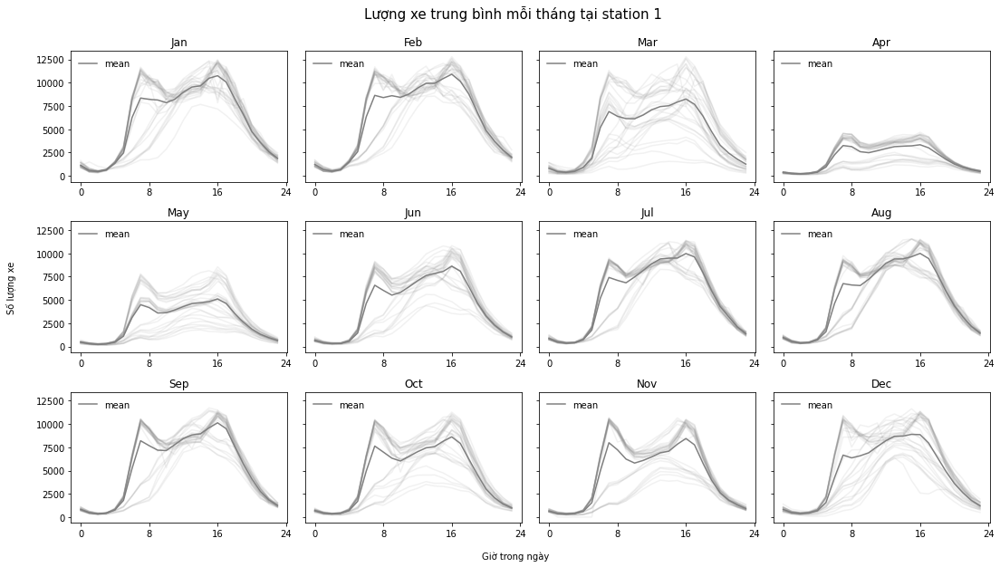

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=[15, 8], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[7]
MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["Total", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["Total"])
        ts.reset_index()["Total"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#7f7f7f", label="mean", legend=True
    )
    ax[ix].legend(loc="upper left", frameon=False)

plt.suptitle('Lượng xe trung bình mỗi tháng tại station 1 \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center")
fig.text(-0.02, 0.5, "Số lượng xe", va="center", rotation="vertical")
fig.tight_layout()

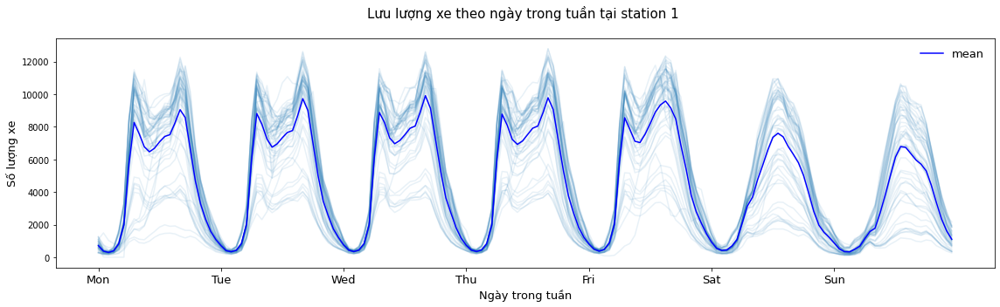

In [ ]:
fig, ax = plt.subplots(figsize=[16, 5])
weekly_ts = []
sns_blue = sns.color_palette(as_cmap=True)
DAYS = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
for week, ts in df.groupby("Week"):
    weekly_ts.append(ts.reset_index()["Total"])
    ts.reset_index()["Total"].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
    plt.xticks(ticks=np.arange(0, 167, 24), labels=DAYS, fontsize = 13)

pd.concat(weekly_ts, axis=1).mean(axis=1).plot(
    ax=ax, color="blue", label="mean", legend=True
)

ax.set_ylabel("Số lượng xe", fontsize = 13)
ax.set_title("Lưu lượng xe theo ngày trong tuần tại station 1 \n", fontsize = 15)
ax.set_xlabel("Ngày trong tuần", fontsize = 13)
ax.legend(loc="upper right", frameon=False, fontsize = 13)

plt.tight_layout()

In [ ]:
df = normalize_df(station2, type = 'traffic')
df["Week"] = df.index.isocalendar().week
df["Day"] = df.index.day
df["Month"] = df.index.month
df.head()

,Invalid,MBIKE,CAR,LGV,BUS,CARAVAN,Total,HGVs,Week,Day,Month
Datetime,,,,,,,,,,,
2020-01-01 00:00:00,0.0,2.0,949.0,73.0,18.0,1.0,1059.0,16.0,1,1,1
2020-01-01 01:00:00,0.0,2.0,1320.0,86.0,16.0,1.0,1441.0,16.0,1,1,1
2020-01-01 02:00:00,0.0,1.0,896.0,61.0,8.0,1.0,977.0,10.0,1,1,1
2020-01-01 03:00:00,0.0,1.0,672.0,76.0,18.0,0.0,780.0,13.0,1,1,1
2020-01-01 04:00:00,0.0,0.0,582.0,59.0,15.0,0.0,674.0,18.0,1,1,1


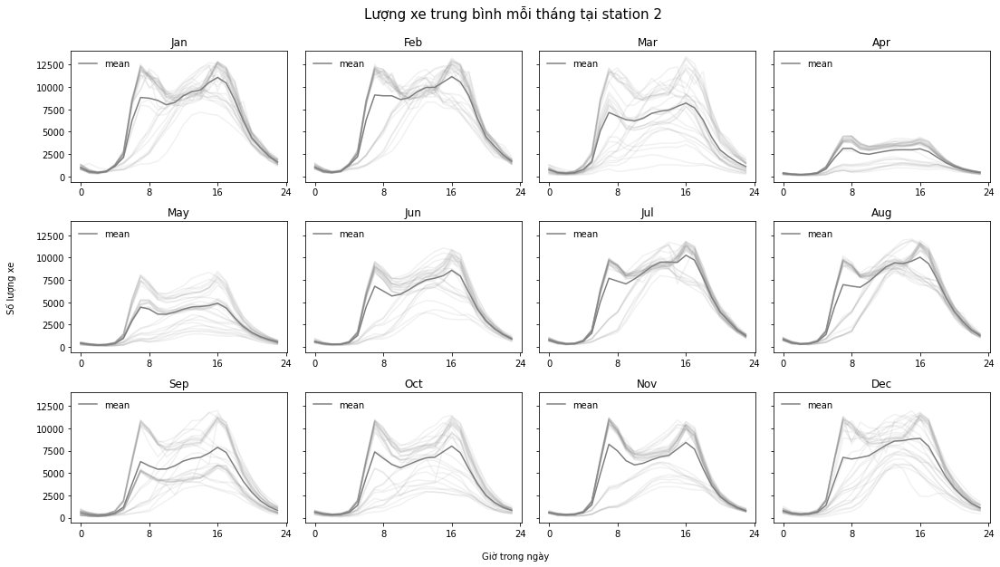

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=[15, 8], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[7]
MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["Total", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["Total"])
        ts.reset_index()["Total"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#7f7f7f", label="mean", legend=True
    )
    ax[ix].legend(loc="upper left", frameon=False)

plt.suptitle('Lượng xe trung bình mỗi tháng tại station 2 \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center")
fig.text(-0.02, 0.5, "Số lượng xe", va="center", rotation="vertical")
fig.tight_layout()

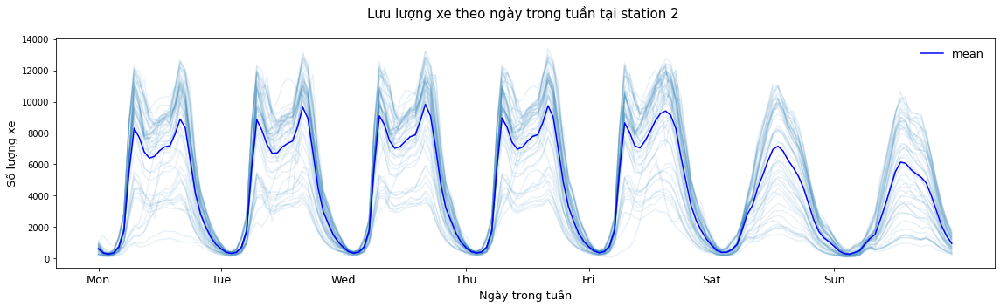

In [ ]:
fig, ax = plt.subplots(figsize=[16, 5])
weekly_ts = []
sns_blue = sns.color_palette(as_cmap=True)
DAYS = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
for week, ts in df.groupby("Week"):
    weekly_ts.append(ts.reset_index()["Total"])
    ts.reset_index()["Total"].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
    plt.xticks(ticks=np.arange(0, 167, 24), labels=DAYS, fontsize = 13)

pd.concat(weekly_ts, axis=1).mean(axis=1).plot(
    ax=ax, color="blue", label="mean", legend=True
)

ax.set_ylabel("Số lượng xe", fontsize = 13)
ax.set_title("Lưu lượng xe theo ngày trong tuần tại station 2 \n", fontsize = 15)
ax.set_xlabel("Ngày trong tuần", fontsize = 13)
ax.legend(loc="upper right", frameon=False, fontsize = 13)

plt.tight_layout()

In [ ]:
df = normalize_df(station3, type = 'traffic')
df["Week"] = df.index.isocalendar().week
df["Day"] = df.index.day
df["Month"] = df.index.month
df.head()

,Invalid,MBIKE,CAR,LGV,BUS,CARAVAN,Total,HGVs,Week,Day,Month
Datetime,,,,,,,,,,,
2020-01-01 00:00:00,0.0,2.0,1112.0,89.0,24.0,1.0,1243.0,15.0,1,1,1
2020-01-01 01:00:00,0.0,0.0,1431.0,125.0,16.0,1.0,1590.0,17.0,1,1,1
2020-01-01 02:00:00,0.0,0.0,923.0,86.0,8.0,2.0,1030.0,11.0,1,1,1
2020-01-01 03:00:00,0.0,2.0,611.0,64.0,16.0,1.0,701.0,7.0,1,1,1
2020-01-01 04:00:00,0.0,1.0,526.0,55.0,14.0,0.0,613.0,17.0,1,1,1


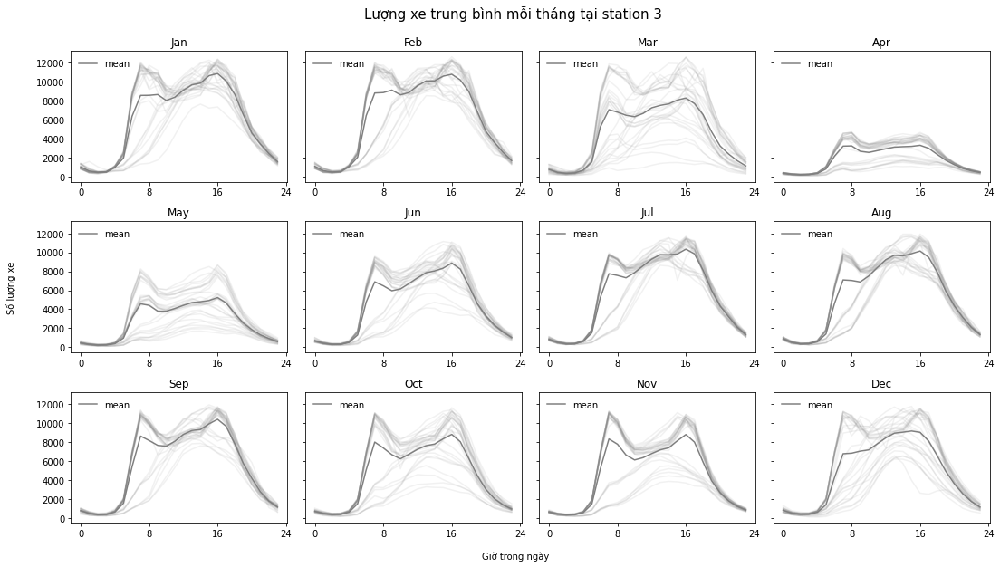

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=[15, 8], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[7]
MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["Total", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["Total"])
        ts.reset_index()["Total"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#7f7f7f", label="mean", legend=True
    )
    ax[ix].legend(loc="upper left", frameon=False)

plt.suptitle('Lượng xe trung bình mỗi tháng tại station 3 \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center")
fig.text(-0.02, 0.5, "Số lượng xe", va="center", rotation="vertical")
fig.tight_layout()

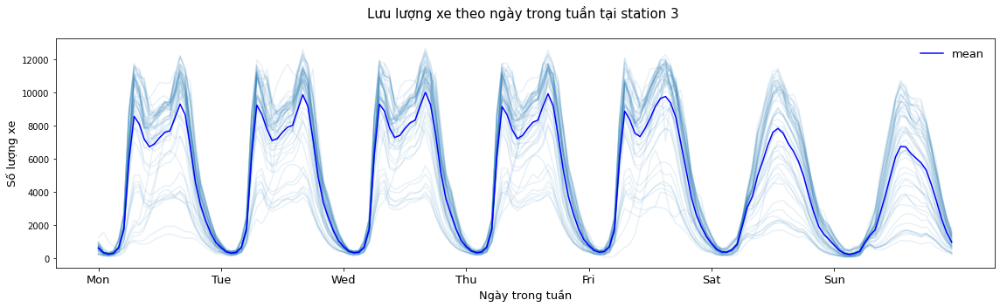

In [ ]:
fig, ax = plt.subplots(figsize=[16, 5])
weekly_ts = []
sns_blue = sns.color_palette(as_cmap=True)
DAYS = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
for week, ts in df.groupby("Week"):
    weekly_ts.append(ts.reset_index()["Total"])
    ts.reset_index()["Total"].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
    plt.xticks(ticks=np.arange(0, 167, 24), labels=DAYS, fontsize = 13)

pd.concat(weekly_ts, axis=1).mean(axis=1).plot(
    ax=ax, color="blue", label="mean", legend=True
)

ax.set_ylabel("Số lượng xe", fontsize = 13)
ax.set_title("Lưu lượng xe theo ngày trong tuần tại station 3 \n", fontsize = 15)
ax.set_xlabel("Ngày trong tuần", fontsize = 13)
ax.legend(loc="upper right", frameon=False, fontsize = 13)

plt.tight_layout()

In [ ]:
df = normalize_df(station4, type = 'traffic')
df["Week"] = df.index.isocalendar().week
df["Day"] = df.index.day
df["Month"] = df.index.month
df.head()

,Invalid,MBIKE,CAR,LGV,BUS,CARAVAN,Total,HGVs,Week,Day,Month
Datetime,,,,,,,,,,,
2020-01-01 00:00:00,0.0,10.0,1061.0,75.0,18.0,0.0,1180.0,16.0,1,1,1
2020-01-01 01:00:00,0.0,11.0,1273.0,87.0,8.0,0.0,1392.0,13.0,1,1,1
2020-01-01 02:00:00,0.0,4.0,772.0,85.0,3.0,1.0,873.0,8.0,1,1,1
2020-01-01 03:00:00,0.0,3.0,482.0,61.0,6.0,0.0,558.0,6.0,1,1,1
2020-01-01 04:00:00,0.0,2.0,411.0,57.0,9.0,0.0,486.0,7.0,1,1,1


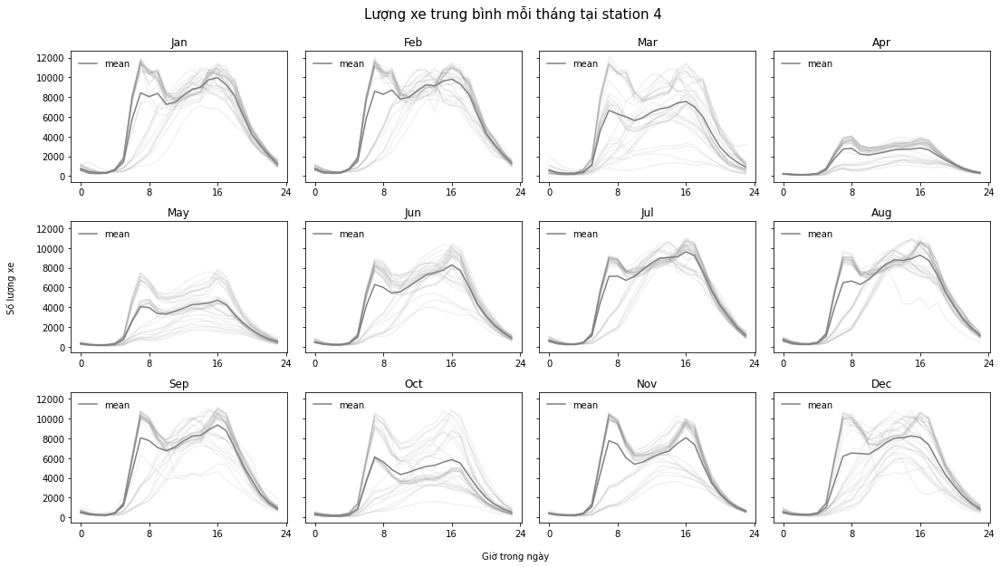

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=4, figsize=[15, 8], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[7]
MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["Total", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["Total"])
        ts.reset_index()["Total"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#7f7f7f", label="mean", legend=True
    )
    ax[ix].legend(loc="upper left", frameon=False)

plt.suptitle('Lượng xe trung bình mỗi tháng tại station 4 \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center")
fig.text(-0.02, 0.5, "Số lượng xe", va="center", rotation="vertical")
fig.tight_layout()

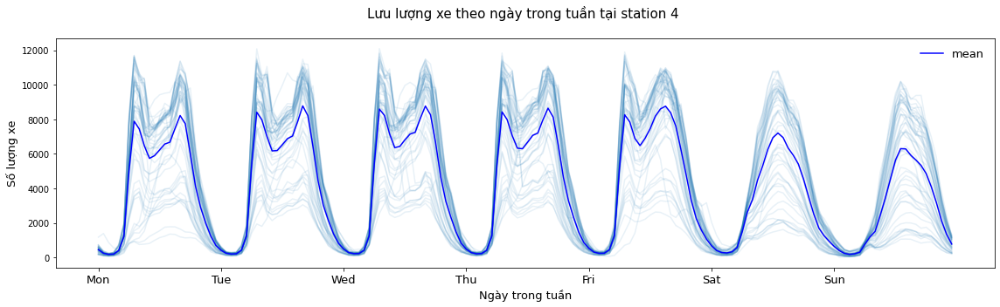

In [ ]:
fig, ax = plt.subplots(figsize=[16, 5])
weekly_ts = []
sns_blue = sns.color_palette(as_cmap=True)
DAYS = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
for week, ts in df.groupby("Week"):
    weekly_ts.append(ts.reset_index()["Total"])
    ts.reset_index()["Total"].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
    plt.xticks(ticks=np.arange(0, 167, 24), labels=DAYS, fontsize = 13)

pd.concat(weekly_ts, axis=1).mean(axis=1).plot(
    ax=ax, color="blue", label="mean", legend=True
)

ax.set_ylabel("Số lượng xe", fontsize = 13)
ax.set_title("Lưu lượng xe theo ngày trong tuần tại station 4 \n", fontsize = 15)
ax.set_xlabel("Ngày trong tuần", fontsize = 13)
ax.legend(loc="upper right", frameon=False, fontsize = 13)

plt.tight_layout()

In [ ]:
df = normalize_df(weather, type = 'weather')
df.head()

,rain,temp,wetb,dewpt,vappr,rhum,msl
Datetime,,,,,,,
2020-01-01 00:00:00,0.0,6.8,5.7,4.3,8.3,83,1030.2
2020-01-01 01:00:00,0.0,6.9,5.8,4.3,8.3,83,1029.7
2020-01-01 02:00:00,0.0,6.2,4.9,3.0,7.6,80,1029.4
2020-01-01 03:00:00,0.0,4.4,3.5,2.3,7.2,85,1028.6
2020-01-01 04:00:00,0.0,2.4,1.9,1.1,6.6,90,1027.8


In [ ]:
df["Week"] = df.index.isocalendar().week
df["Day"] = df.index.day
df["Month"] = df.index.month
df.head()

,rain,temp,wetb,dewpt,vappr,rhum,msl,Week,Day,Month
Datetime,,,,,,,,,,
2020-01-01 00:00:00,0.0,6.8,5.7,4.3,8.3,83,1030.2,1,1,1
2020-01-01 01:00:00,0.0,6.9,5.8,4.3,8.3,83,1029.7,1,1,1
2020-01-01 02:00:00,0.0,6.2,4.9,3.0,7.6,80,1029.4,1,1,1
2020-01-01 03:00:00,0.0,4.4,3.5,2.3,7.2,85,1028.6,1,1,1
2020-01-01 04:00:00,0.0,2.4,1.9,1.1,6.6,90,1027.8,1,1,1


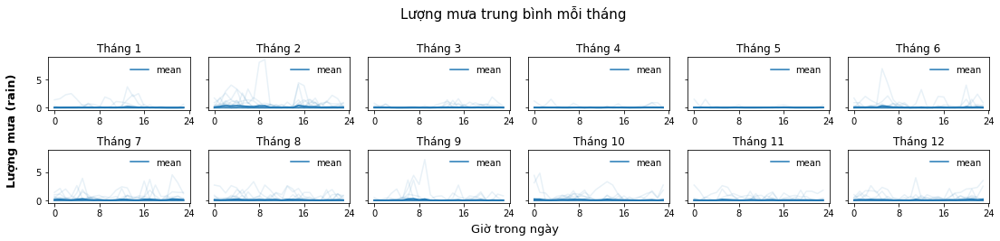

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=[15, 3], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[0]
MONTHS = ["Tháng 1", "Tháng 2", "Tháng 3", "Tháng 4", "Tháng 5", "Tháng 6", "Tháng 7", "Tháng 8", "Tháng 9", "Tháng 10", "Tháng 11", "Tháng 12"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["rain", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["rain"])
        ts.reset_index()["rain"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#1f77b4", label="mean", legend=True
    )
    ax[ix].legend(loc="best", frameon=False)

plt.suptitle('Lượng mưa trung bình mỗi tháng \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center", fontsize = 13)
fig.text(-0.02, 0.5, "Lượng mưa (rain)", va="center", rotation="vertical", fontsize = 13, fontweight = 'bold')
fig.tight_layout()

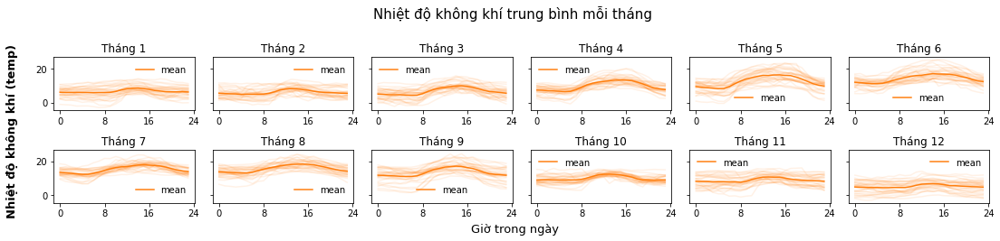

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=[15, 3], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[1]
MONTHS = ["Tháng 1", "Tháng 2", "Tháng 3", "Tháng 4", "Tháng 5", "Tháng 6", "Tháng 7", "Tháng 8", "Tháng 9", "Tháng 10", "Tháng 11", "Tháng 12"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["temp", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["temp"])
        ts.reset_index()["temp"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#ff7f0e", label="mean", legend=True
    )
    ax[ix].legend(loc="best", frameon=False)

plt.suptitle('Nhiệt độ không khí trung bình mỗi tháng \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center", fontsize = 13)
fig.text(-0.02, 0.5, "Nhiệt độ không khí (temp)", va="center", rotation="vertical", fontsize = 13, fontweight = 'bold')
fig.tight_layout()

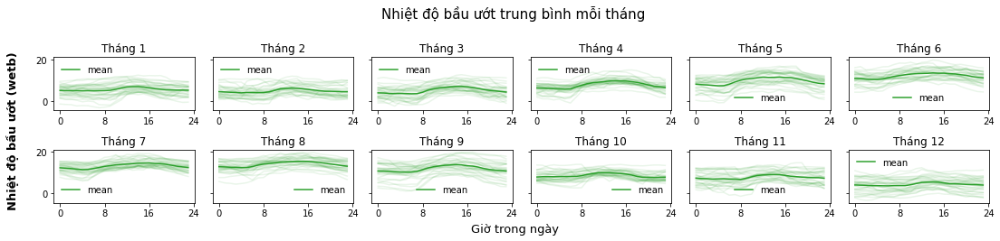

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=[15, 3], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[2]
MONTHS = ["Tháng 1", "Tháng 2", "Tháng 3", "Tháng 4", "Tháng 5", "Tháng 6", "Tháng 7", "Tháng 8", "Tháng 9", "Tháng 10", "Tháng 11", "Tháng 12"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["wetb", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["wetb"])
        ts.reset_index()["wetb"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#2ca02c", label="mean", legend=True
    )
    ax[ix].legend(loc="best", frameon=False)

plt.suptitle('Nhiệt độ bầu ướt trung bình mỗi tháng \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center", fontsize = 13)
fig.text(-0.02, 0.5, "Nhiệt độ bầu ướt (wetb)", va="center", rotation="vertical", fontsize = 13, fontweight = 'bold')
fig.tight_layout()

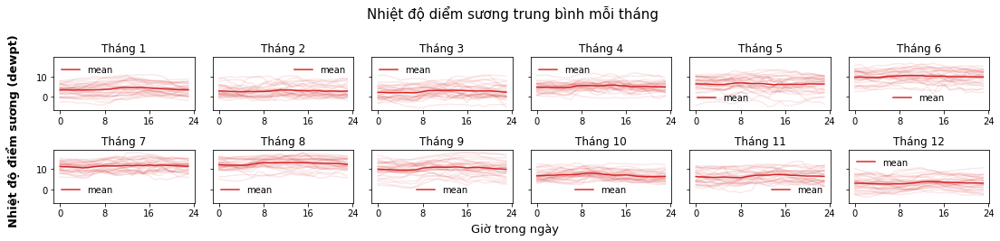

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=[15, 3], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[3]
MONTHS = ["Tháng 1", "Tháng 2", "Tháng 3", "Tháng 4", "Tháng 5", "Tháng 6", "Tháng 7", "Tháng 8", "Tháng 9", "Tháng 10", "Tháng 11", "Tháng 12"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["dewpt", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["dewpt"])
        ts.reset_index()["dewpt"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#d62728", label="mean", legend=True
    )
    ax[ix].legend(loc="best", frameon=False)

plt.suptitle('Nhiệt độ diểm sương trung bình mỗi tháng \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center", fontsize = 13)
fig.text(-0.02, 0.5, "Nhiệt độ điểm sương (dewpt)", va="center", rotation="vertical", fontsize = 13, fontweight = 'bold')
fig.tight_layout()

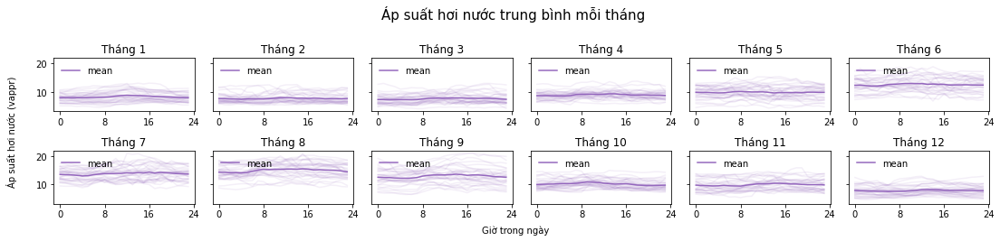

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=[15, 3], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[4]
MONTHS = ["Tháng 1", "Tháng 2", "Tháng 3", "Tháng 4", "Tháng 5", "Tháng 6", "Tháng 7", "Tháng 8", "Tháng 9", "Tháng 10", "Tháng 11", "Tháng 12"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["vappr", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["vappr"])
        ts.reset_index()["vappr"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#9467bd", label="mean", legend=True
    )
    ax[ix].legend(loc="upper left", frameon=False)

plt.suptitle('Áp suất hơi nước trung bình mỗi tháng \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center")
fig.text(-0.02, 0.5, "Áp suất hơi nước (vappr)", va="center", rotation="vertical")
fig.tight_layout()

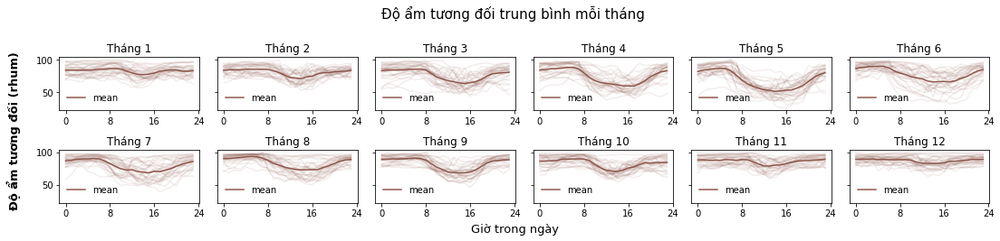

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=[15, 3], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[5]
MONTHS = ["Tháng 1", "Tháng 2", "Tháng 3", "Tháng 4", "Tháng 5", "Tháng 6", "Tháng 7", "Tháng 8", "Tháng 9", "Tháng 10", "Tháng 11", "Tháng 12"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["rhum", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["rhum"])
        ts.reset_index()["rhum"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#8c564b", label="mean", legend=True
    )
    ax[ix].legend(loc="best", frameon=False)

plt.suptitle('Độ ẩm tương đối trung bình mỗi tháng \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center", fontsize = 13)
fig.text(-0.02, 0.5, "Độ ẩm tương đối (rhum)", va="center", rotation="vertical", fontsize = 13, fontweight = 'bold')
fig.tight_layout()

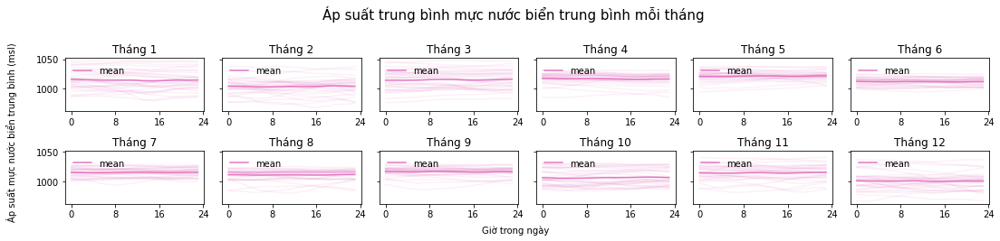

In [ ]:
fig, ax = plt.subplots(nrows=2, ncols=6, figsize=[15, 3], sharey=True)
ax = ax.flatten()
sns_blue = sns.color_palette(as_cmap=True)[6]
MONTHS = ["Tháng 1", "Tháng 2", "Tháng 3", "Tháng 4", "Tháng 5", "Tháng 6", "Tháng 7", "Tháng 8", "Tháng 9", "Tháng 10", "Tháng 11", "Tháng 12"]
for ix, month in enumerate(MONTHS):

    # Plot individual ts
    daily_ts = []
    for _, ts in (
        df[["msl", "Day", "Month"]]
        .query(f"Month == {ix+1}")
        .groupby("Day")
    ):
        daily_ts.append(ts.reset_index()["msl"])
        ts.reset_index()["msl"].plot(
            alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
        )
        ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
        ax[ix].set_title(month)

    # Plot the mean ts
    pd.concat(daily_ts, axis=1).mean(axis=1).plot(
        ax=ax[ix], color="#e377c2", label="mean", legend=True
    )
    ax[ix].legend(loc="upper left", frameon=False)

plt.suptitle('Áp suất trung bình mực nước biển trung bình mỗi tháng \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.text(0.5, -0.02, "Giờ trong ngày", ha="center")
fig.text(-0.02, 0.5, "Áp suất mực nước biển trung bình (msl)", va="center", rotation="vertical")
fig.tight_layout()

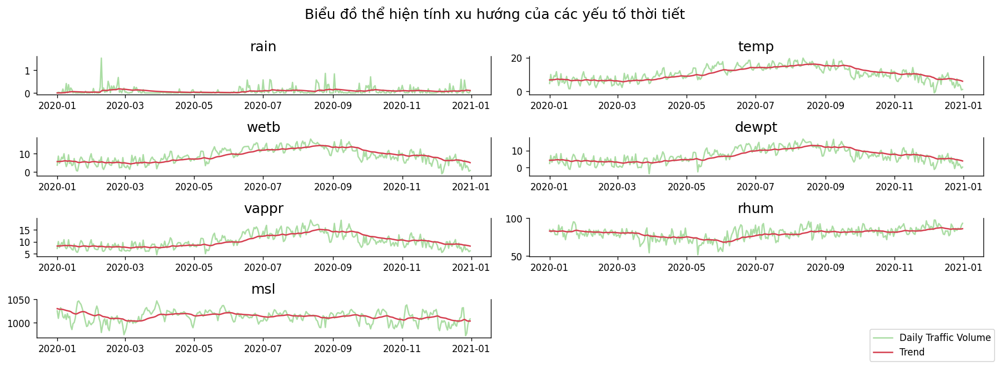

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=2, dpi=120, figsize=(15,5))
fig.delaxes(axes[3,1])

for i, ax in enumerate(axes.flatten()[:-1]):
  data1 = weather.set_index("Date").ewm(span= 1000, adjust=False).mean().groupby('Date').mean().drop('Month', axis = 1)
  data2 = weather.groupby('Date').mean().drop('Month', axis = 1)
  data1 = data1[data1.columns[i]]
  data2 = data2[data2.columns[i]]
  ax.plot(data2.index, data2, color = '#abdda4')
  ax.plot(data1.index, data1, color = '#d53e4f')
  # Decorations
  ax.set_title(weather.columns[i+4], fontsize = 15)
  ax.spines["top"].set_alpha(0)
  ax.tick_params(labelsize=10)
  
plt.suptitle('Biểu đồ thể hiện tính xu hướng của các yếu tố thời tiết \n', fontsize = 15, ha = 'center', va = 'bottom')
fig.legend(['Daily Traffic Volume', 'Trend'], loc = 'lower right')
plt.tight_layout()

## Traffic EDA Dashboard 

In [ ]:
!pip install jupyter_dash

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install dash-bootstrap-components

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import dash
import dash_core_components as dcc
import dash_html_components as html
import dash_bootstrap_components as dbc
import plotly.express as px
from jupyter_dash import JupyterDash
from dash.dependencies import Input, Output
import plotly.graph_objects as go

In [ ]:
JupyterDash.infer_jupyter_proxy_config()

In [ ]:
df = pd.DataFrame()
i = 1
for station in [station1, station2, station3, station4]:
  df['station' + str(i)] = station.groupby(['Date']).sum().drop('Month',axis = 1).mean(axis=0)
  i = i + 1

#df = df.set_index('Events')
df = df.transpose()
df = df[['Invalid',	'MBIKE',	'CAR',	'LGV',	'BUS',	'CARAVAN',	'HGVs', 'Total']]
for fea in df.columns:
  df[fea] = df[fea]/df['Total']
df_per = df.drop('Total', axis=1).transpose()
df_per

,station1,station2,station3,station4
Invalid,0.000045,0.000056,0.000061,0.000053
MBIKE,0.002931,0.003151,0.002028,0.004808
CAR,0.742694,0.732579,0.734007,0.800343
LGV,0.138981,0.137503,0.154867,0.137219
BUS,0.005136,0.005036,0.006102,0.003084
CARAVAN,0.004074,0.005586,0.004599,0.003881
HGVs,0.106138,0.116091,0.098336,0.050611


In [ ]:
df = pd.DataFrame()
df['Events'] = station1['Events'].unique()
i = 1
for station in [station1, station2, station3, station4]:
  df['station' + str(i)] = station.groupby(['Date', 'Events']).sum().drop('Month',axis = 1).reset_index().groupby('Events').mean()['Total'].tolist()
  i = i + 1

df = df.set_index('Events')
df_events = df
df_events

,station1,station2,station3,station4
Events,,,,
Holiday,70250.434783,66158.782609,69615.434783,62395.173913
None,112355.960641,107572.514577,114385.946064,100903.456268
Special,13115.000000,11730.000000,13298.000000,11347.000000


In [ ]:
#Compenents 1
countfig1 = go.FigureWidget()
df1 = station1.groupby(by = 'Time').mean().drop('Month', axis = 1)
df2 = station2.groupby(by = 'Time').mean().drop('Month', axis = 1)
df3 = station3.groupby(by = 'Time').mean().drop('Month', axis = 1)
df4 = station4.groupby(by = 'Time').mean().drop('Month', axis = 1)

countfig1.add_scatter(name = 'Station1', x = df1.index, y = df1['Total'])
countfig1.add_scatter(name = 'Station2', x = df1.index, y = df2['Total'])
countfig1.add_scatter(name = 'Station3', x = df1.index, y = df3['Total'])
countfig1.add_scatter(name = 'Station4', x = df1.index, y = df4['Total'])
countfig1.update_layout(title = "Lưu lượng giao thông theo mỗi giờ")

#Compenents 2
countfig2 = go.FigureWidget()
df1 = station1.groupby(by = 'Date').mean().drop('Month', axis = 1)
df2 = station2.groupby(by = 'Date').mean().drop('Month', axis = 1)
df3 = station3.groupby(by = 'Date').mean().drop('Month', axis = 1)
df4 = station4.groupby(by = 'Date').mean().drop('Month', axis = 1)

countfig2.add_scatter(name = 'Station1', x = df1.index, y = df1['Total'])
countfig2.add_scatter(name = 'Station2', x = df1.index, y = df2['Total'])
countfig2.add_scatter(name = 'Station3', x = df1.index, y = df3['Total'])
countfig2.add_scatter(name = 'Station4', x = df1.index, y = df4['Total'])
countfig2.update_layout(title = "Lưu lượng giao thông theo mỗi ngày")

#Compenents 3
countfig3 = go.FigureWidget()
df1 = station1.groupby(by = 'Month').mean()
df2 = station2.groupby(by = 'Month').mean()
df3 = station3.groupby(by = 'Month').mean()
df4 = station4.groupby(by = 'Month').mean()

countfig3.add_scatter(name = 'Station1', x = df1.index, y = df1['Total'])
countfig3.add_scatter(name = 'Station2', x = df1.index, y = df2['Total'])
countfig3.add_scatter(name = 'Station3', x = df1.index, y = df3['Total'])
countfig3.add_scatter(name = 'Station4', x = df1.index, y = df4['Total'])
countfig3.update_layout(title = "Lưu lượng giao thông theo mỗi tháng")


#Component 4
countfig4 = go.FigureWidget()
countfig5 = go.FigureWidget()
countfig6 = go.FigureWidget()
countfig7 = go.FigureWidget()
df1 = station1.groupby(['Date']).sum().drop(['Month', 'Total'], axis = 1)
df2 = station2.groupby(['Date']).sum().drop(['Month', 'Total'], axis = 1)
df3 = station3.groupby(['Date']).sum().drop(['Month', 'Total'], axis = 1)
df4 = station4.groupby(['Date']).sum().drop(['Month', 'Total'], axis = 1)

for col in df1.columns:
  countfig4.add_scatter(name = col, x = df1.index, y = df1[col])
for col in df2.columns:
  countfig5.add_scatter(name = col, x = df2.index, y = df2[col])
for col in df3.columns:
  countfig6.add_scatter(name = col, x = df3.index, y = df3[col])
for col in df4.columns:
  countfig7.add_scatter(name = col, x = df4.index, y = df4[col])  

In [ ]:
# Build App
app = JupyterDash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP, dbc.icons.BOOTSTRAP])
app.layout = html.Div([
    dbc.Row([
        html.H1("Traffic Dashboard EDA", style = {'color': 'darkcyan', 'text-align': 'center'})
    ]),
    dbc.Row([
        dbc.Col([
                html.H4('Tỷ lệ các loại xe theo station'),
                html.Label(['Choose station: ']),
                dcc.Dropdown(
              id='column-dropdown1', clearable=False,
              value = df_per.columns[0], options=[
                {'label': c, 'value': c}
                for c in df_per.columns
            ]),
              dbc.Row([dcc.Graph(id="fig1")])
        ], width = {'size':5}),
        dbc.Col([dcc.Graph(figure = countfig1)], width = {'size':7})
    ]),
    dbc.Row([
        dbc.Col([dcc.Graph(figure = countfig2)]),
        dbc.Col([dcc.Graph(figure = countfig3)])
    ]),
    dbc.Row([
        html.H4('Lưu lượng giao thông theo loại xe'),
                html.Label(['Choose station: ']),
                dcc.Dropdown(
              id='column-dropdown2', clearable=False,
              value = 'station1', options=[
                {'label': c, 'value': c}
                for c in df_per.columns
            ]),
        dcc.Graph(id='fig2')])
])
@app.callback(
    Output("fig1", "figure"), 
    [Input("column-dropdown1", "value")]
)

def generate_chart(column):
    return px.pie(df_per,values = column, names = df_per.index, hole=.3)

@app.callback(
    Output("fig2", "figure"), 
    [Input("column-dropdown2", "value")]
)

def generate_fig(column):
  if column == 'station1':
    return countfig4
  elif column == 'station2':
    return countfig5
  elif column == 'station3':
    return countfig6
  else: 
    return countfig7 

# Run app and display result inline in the notebook
app.run_server(mode='inline')

<IPython.core.display.Javascript object>

## Dashboard (Pywedge)

In [ ]:
pip install pywedge

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
df = station1.copy()

In [ ]:
import pywedge as pw

mc = pw.Pywedge_Charts(df, c=None, y ='Total')
charts = mc.make_charts()

/usr/local/lib/python3.8/dist-packages/pywedge/pywedge.py:27: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only



HTML(value='<h2>Pywedge Make_Charts </h2>')

## Các phân tích khác

### Plot map thể hiện vị trí của các trạm giao thông và thời tiết

In [ ]:
m = folium.Map(location=[53.35,-6.3], tiles="OpenStreetMap", zoom_start=11.5)

for i in range(0,len(station_details)):
  color = 'blue'
  if(station_details.iloc[i]['Label'] == 'weather'):
    color = 'red'
  folium.Marker(
    location = [station_details.iloc[i]['Latitude'], station_details.iloc[i]['Longitude']],
    popup = folium.Popup(station_details.iloc[i]['Label'], show = True),
    icon = folium.Icon(icon = 'circle', prefix = 'fa', color = color)
  ).add_to(m)
m

### Plot biểu đồ thể hiện lưu lượng giao thông trung bình mỗi giờ, mỗi ngày, mỗi tháng

In [ ]:
def plot_df(value = '', by = '', title = '', xlabel = '', ylabel = 'Lượng giao thông'):
  if(by != 'Month'):
    df1 = station1.groupby(by = by).mean().drop('Month', axis = 1)
    df2 = station2.groupby(by = by).mean().drop('Month', axis = 1)
    df3 = station3.groupby(by = by).mean().drop('Month', axis = 1)
    df4 = station4.groupby(by = by).mean().drop('Month', axis = 1)
  else:
    df1 = station1.groupby(by = by).mean()
    df2 = station2.groupby(by = by).mean()
    df3 = station3.groupby(by = by).mean()
    df4 = station4.groupby(by = by).mean()

  plt.figure(figsize = (15, 3))
  plt.plot(df1.index, df1[value], color = '#90181a')
  plt.plot(df2.index, df2[value], color = '#bd9418')
  plt.plot(df3.index, df3[value], color = '#006548')
  plt.plot(df4.index, df4[value], color = '#222371')

  plt.legend(['station1', 'station2', 'station3', 'station4'], loc = 'best')
  plt.gca().set(title = title, xlabel = xlabel, ylabel = ylabel)
  #plt.show()

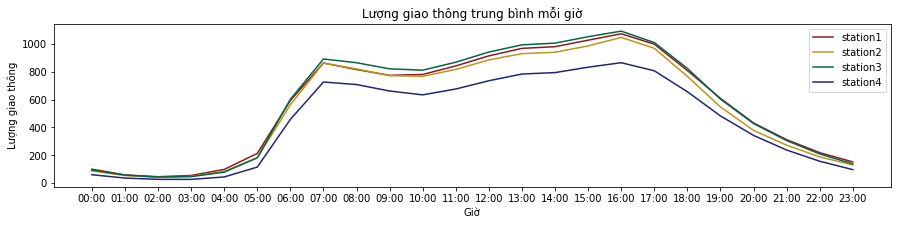

In [ ]:
plot_df(value = 'Total', by = 'Time', title = 'Lượng giao thông trung bình mỗi giờ', xlabel = 'Giờ')

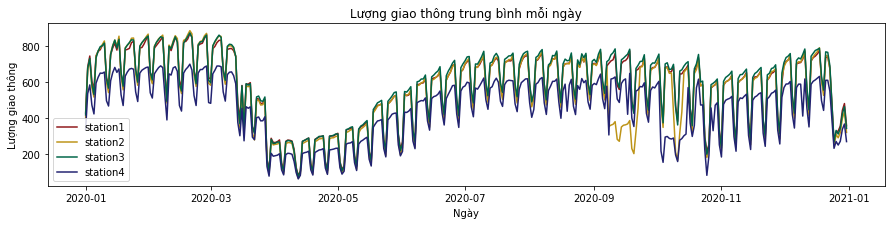

In [ ]:
plot_df(value = 'Total', by = 'Date', title = 'Lượng giao thông trung bình mỗi ngày', xlabel = 'Ngày')

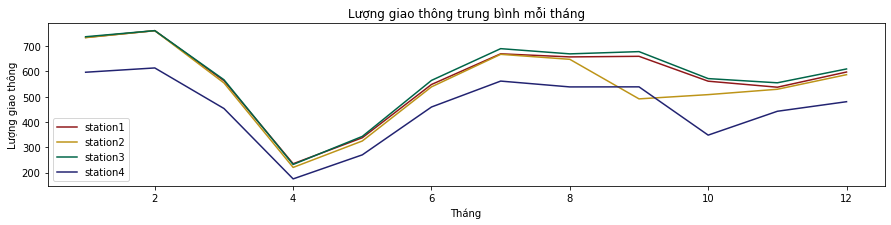

In [ ]:
plot_df(value = 'Total', by = 'Month', title = 'Lượng giao thông trung bình mỗi tháng', xlabel = 'Tháng')

In [ ]:
def plot_time_weekday_volume(station, ax, label):
  temp = station.groupby(['Date', 'Time', 'Weekday']).sum().reset_index().drop('Month', axis = 1)
  temp = temp.groupby(['Time', 'Weekday']).mean().reset_index()
  temp = temp.pivot(index = 'Time', columns = 'Weekday', values = 'Total')
  temp.columns = list(temp.columns)

  for col in temp.columns:
    ax.plot(temp.index, temp[col], linestyle="--", marker="o", label=col)
  ax.set_title('station ' + label)
  ax.tick_params(axis='x', labelrotation=45)

<ipython-input-239-cb06beb6f799>:6: MatplotlibDeprecationWarning:

Automatic legend placement (loc='best') not implemented for figure legend. Falling back on 'upper right'. This will raise an exception in 3.3.



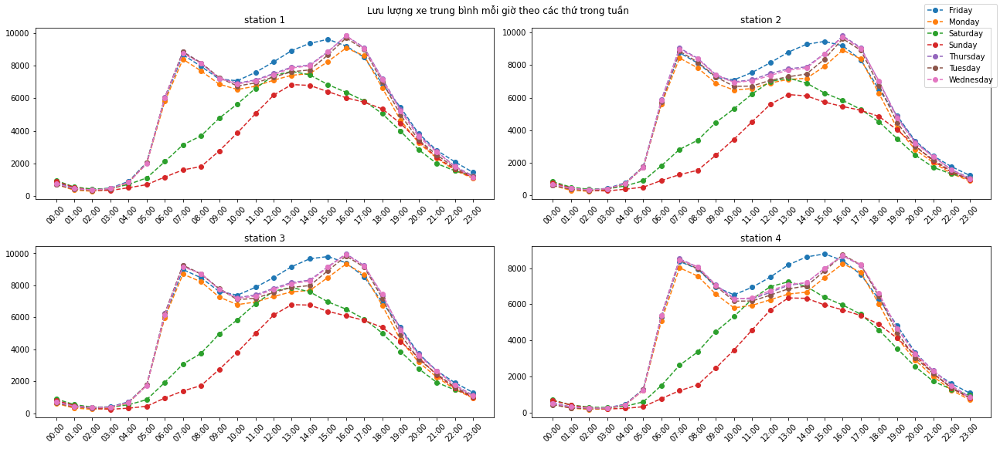

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (18, 8))
plot_time_weekday_volume(station1, axes[0, 0], '1')
plot_time_weekday_volume(station2, axes[0, 1], '2')
plot_time_weekday_volume(station3, axes[1, 0], '3')
plot_time_weekday_volume(station4, axes[1, 1], '4')
fig.legend(labels = ['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday'], loc = 'best')
plt.suptitle('Lưu lượng xe trung bình mỗi giờ theo các thứ trong tuần', verticalalignment = 'bottom')
plt.tight_layout()

### Plot biểu đồ thể hiện các đặc điểm của thời tiết

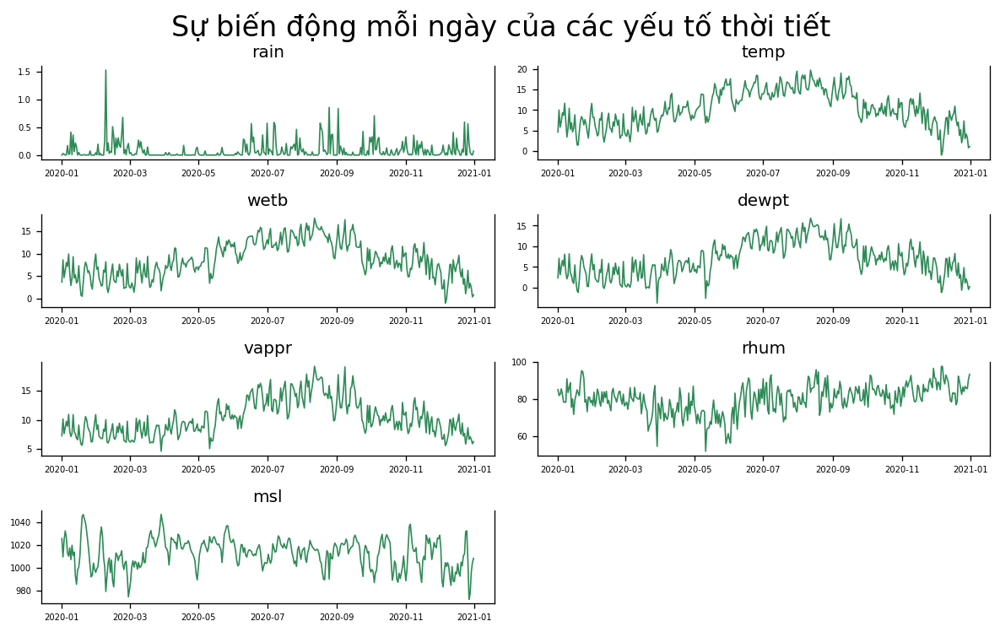

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=2, dpi=120, figsize=(10,6))
fig.delaxes(axes[3,1])

for i, ax in enumerate(axes.flatten()[:-1]):
    data = weather.groupby(['Date']).mean().drop('Month', axis = 1)
    data = data[data.columns[i]]
    ax.plot(data.index, data, color='seagreen', linewidth = 1)
    # Decorations
    ax.set_title(weather.columns[i+4])
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.suptitle('Sự biến động mỗi ngày của các yếu tố thời tiết', fontsize = 20, ha = 'center', va = 'bottom')
plt.tight_layout()

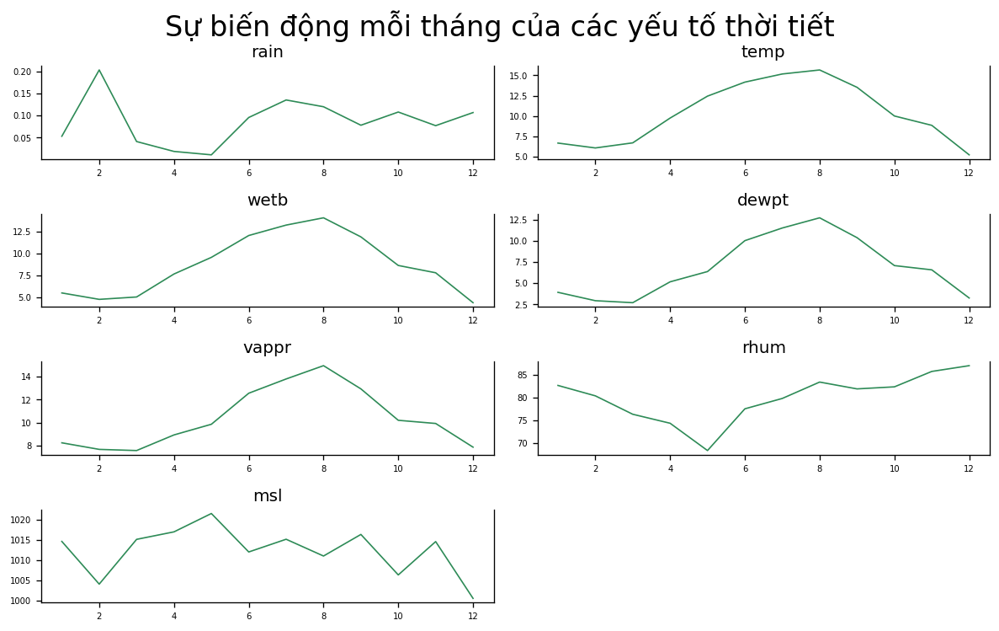

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=2, dpi=120, figsize=(10,6))
fig.delaxes(axes[3,1])

for i, ax in enumerate(axes.flatten()[:-1]):
    data = weather.groupby(['Month']).mean()
    data = data[data.columns[i]]
    ax.plot(data.index, data, color='seagreen', linewidth = 1)
    # Decorations
    ax.set_title(weather.columns[i+4])
    ax.spines["top"].set_alpha(0)
    ax.tick_params(labelsize=6)

plt.suptitle('Sự biến động mỗi tháng của các yếu tố thời tiết', fontsize = 20, ha = 'center', va = 'bottom')
plt.tight_layout()

### Plot lưu lượng giao thông trên mỗi trạm theo phương tiện giao thông

In [ ]:
def plot_volume_by_vehicles(station, ax, label):
  temp = station.groupby(['Date']).sum().drop(['Month', 'Total'], axis = 1)

  for col in temp.columns:
    ax.plot(temp.index, temp[col])
  ax.set_title('station ' + label)
  #ax.tick_params(axis='x', labelrotation=45)

<ipython-input-243-004c247cc1d0>:6: MatplotlibDeprecationWarning:

Automatic legend placement (loc='best') not implemented for figure legend. Falling back on 'upper right'. This will raise an exception in 3.3.



Text(0.5, 0.98, 'Lưu lượng xe trung bình mỗi giờ theo các thứ trong tuần')

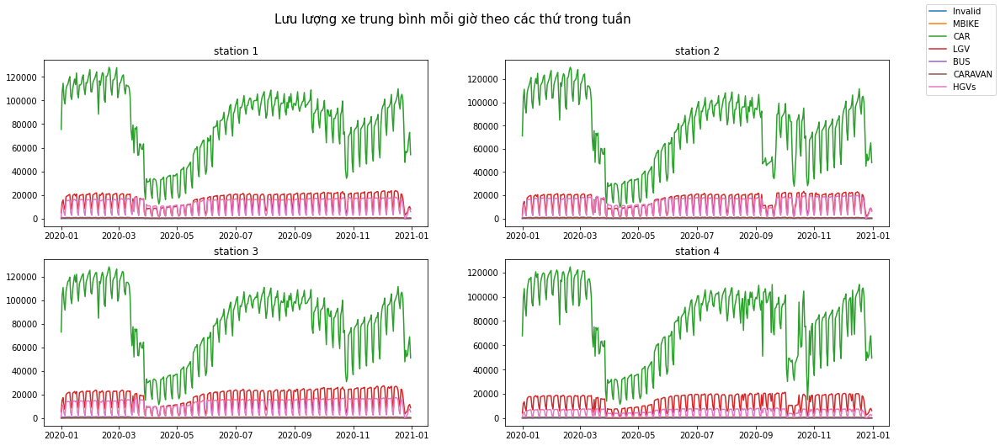

In [ ]:
fig, axes = plt.subplots(2, 2, figsize = (18, 8))
plot_volume_by_vehicles(station1, axes[0, 0], '1')
plot_volume_by_vehicles(station2, axes[0, 1], '2')
plot_volume_by_vehicles(station3, axes[1, 0], '3')
plot_volume_by_vehicles(station4, axes[1, 1], '4')
fig.legend(labels = ['Invalid', 'MBIKE', 'CAR', 'LGV', 'BUS', 'CARAVAN','HGVs'], loc = 'best')
plt.suptitle('Lưu lượng xe trung bình mỗi giờ theo các thứ trong tuần', fontsize = 15)

### Plot lưu lượng giao thông trên mỗi trạm theo làn đường và loại phương tiện

**Hình ảnh minh họa làn đường**
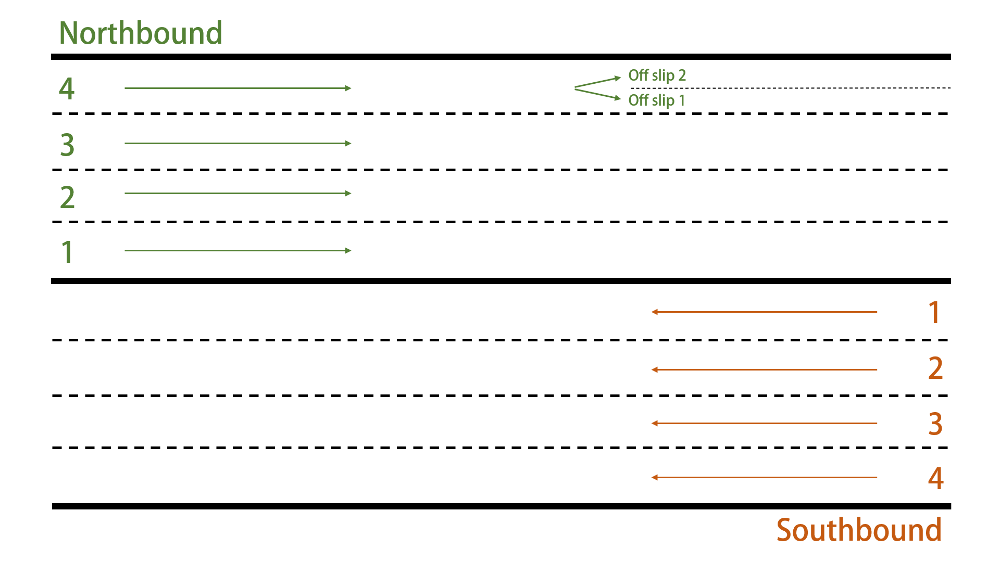

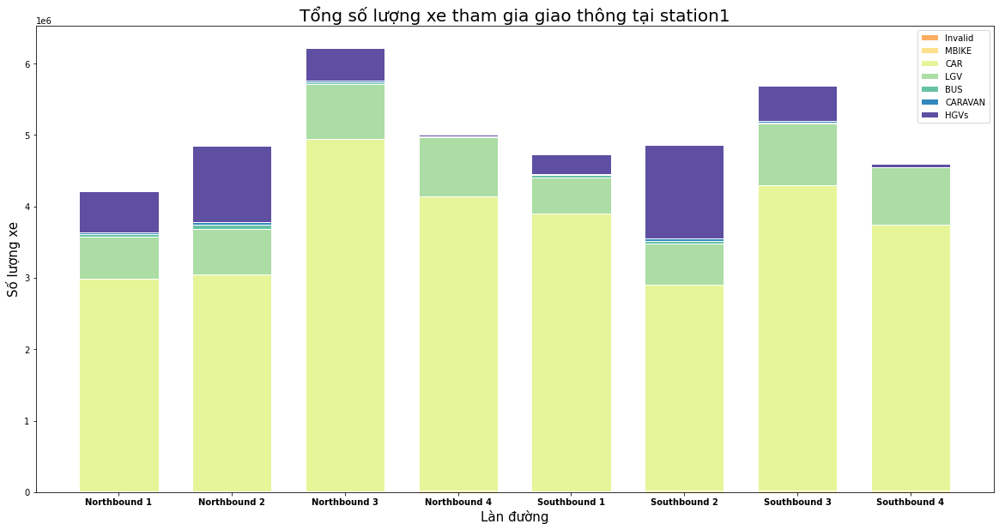

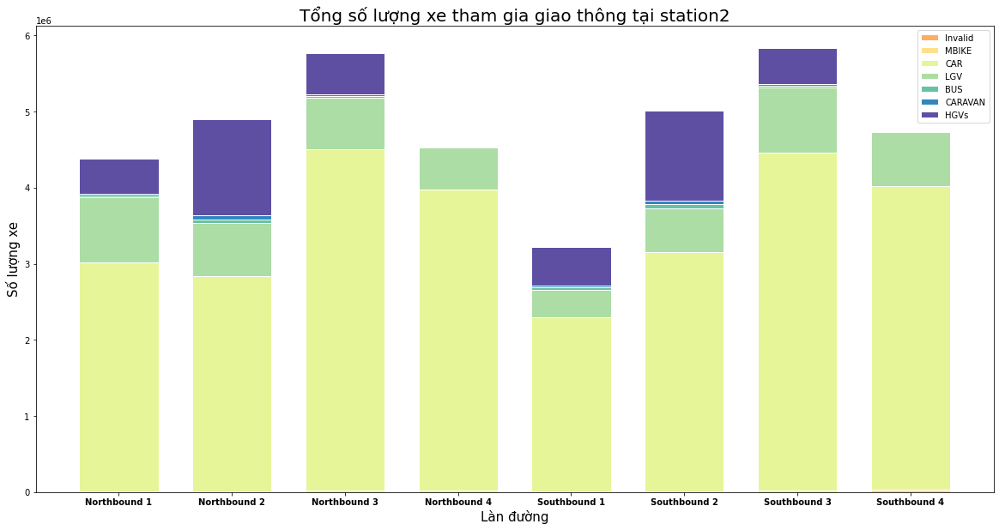

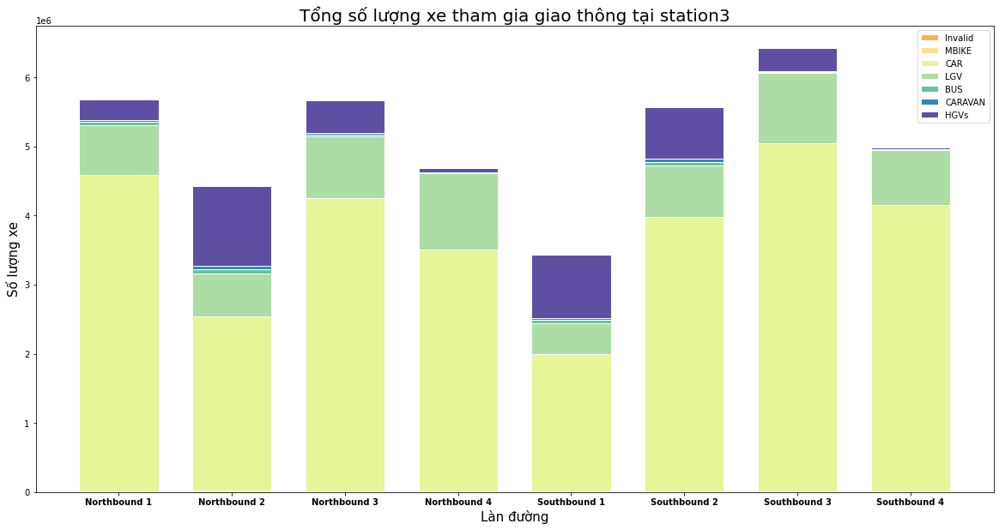

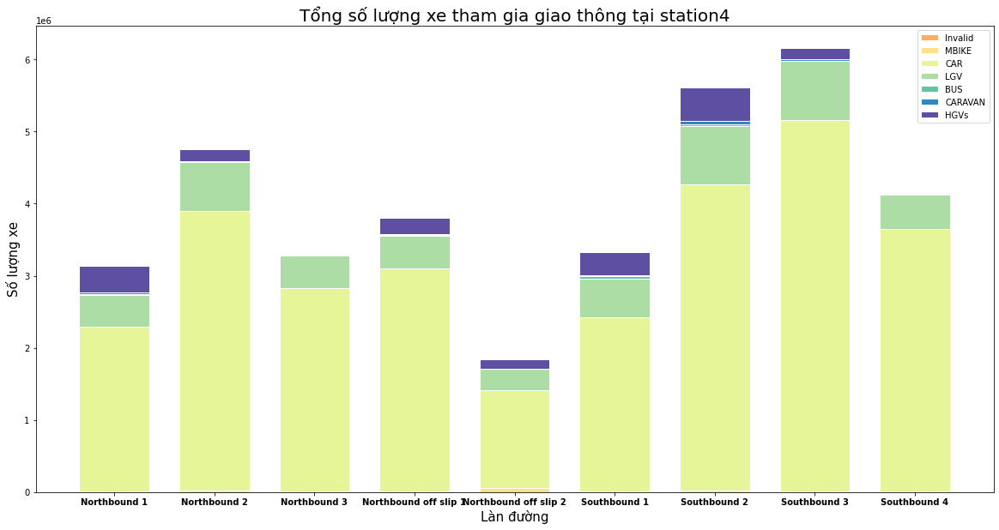

In [ ]:
i = 1
for station in [station1, station2, station3, station4]:
  x = station.groupby(['Lane']).sum().drop(['Month', 'Total'], axis = 1)

  plt.figure(figsize = (20, 10))

  r = np.arange(0, len(x)).tolist()
  names = x.index
  barWidth = 0.7
  colors = ['#fdae61', '#fee08b', '#e6f598', '#abdda4', '#66c2a5', '#3288bd', '#5e4fa2']
  bottom = 0
  
  for col, color in zip(x.columns, colors):
    plt.bar(r, x[col], bottom = bottom,  color=color, edgecolor='white', width=barWidth)
    bottom = np.add(bottom, x[col]).tolist()

  plt.xticks(r, names, fontweight='bold')
  plt.xlabel("Làn đường", fontsize = 15)
  plt.ylabel('Số lượng xe', fontsize = 15)
  plt.title('Tổng số lượng xe tham gia giao thông tại station' + str(i), fontsize = 20)
  i = i + 1
  plt.legend(labels = x.columns)
  
  plt.show()

### Lưu lượng giao thông trên mỗi trạm theo sự kiện

In [ ]:
df = pd.DataFrame()
df['Events'] = station1['Events'].unique()
i = 1
for station in [station1, station2, station3, station4]:
  df['station' + str(i)] = station.groupby(['Date', 'Events']).sum().drop('Month',axis = 1).reset_index().groupby('Events').mean()['Total'].tolist()
  i = i + 1

df = df.set_index('Events')
df.transpose()

Events,Holiday,None,Special
station1,70250.434783,112355.960641,13115.0
station2,66158.782609,107572.514577,11730.0
station3,69615.434783,114385.946064,13298.0
station4,62395.173913,100903.456268,11347.0


### Plot biểu đồ thể hiện mối quan hệ giữa thời tiết và lưu lượng giao thông

In [ ]:
weather

,Date,Weekday,Month,Time,rain,temp,wetb,dewpt,vappr,rhum,msl
0,2020-01-01,Wednesday,1,0:00,0.0,6.8,5.7,4.3,8.3,83,1030.2
1,2020-01-01,Wednesday,1,1:00,0.0,6.9,5.8,4.3,8.3,83,1029.7
2,2020-01-01,Wednesday,1,2:00,0.0,6.2,4.9,3.0,7.6,80,1029.4
3,2020-01-01,Wednesday,1,3:00,0.0,4.4,3.5,2.3,7.2,85,1028.6
4,2020-01-01,Wednesday,1,4:00,0.0,2.4,1.9,1.1,6.6,90,1027.8
...,...,...,...,...,...,...,...,...,...,...,...
8779,2020-12-31,Thursday,12,19:00,0.2,3.9,3.6,3.1,7.6,94,1009.8
8780,2020-12-31,Thursday,12,20:00,0.6,4.2,3.8,3.2,7.7,93,1010.6
8781,2020-12-31,Thursday,12,21:00,0.2,4.4,4.0,3.4,7.8,93,1011.1
8782,2020-12-31,Thursday,12,22:00,0.0,4.4,3.8,2.9,7.5,89,1011.8


In [ ]:
def normalize_daily_df(df):
  new_df = df.assign()
  #new_df['Datetime'] = new_df['Date'].apply(lambda x: datetime.strftime(x, '%Y-%m-%d')) + ' ' + new_df['Time']
  #new_df['Datetime'] = new_df['Datetime'].astype(np.datetime64)
  if (new_df.shape == station1.shape):
    new_df.drop(['Weekday', 'Month', 'Lane', 'Events'], axis = 1, inplace = True)
  if (new_df.shape == weather.shape):
    new_df.drop(['Weekday', 'Month'], axis = 1, inplace = True)
  new_df = new_df.groupby(by = ['Date', 'Time']).sum().reset_index()
  new_df = new_df.groupby(by = 'Date').mean()
  return new_df

In [ ]:
df = pd.concat([normalize_daily_df(station1)[['Total']], normalize_daily_df(station2)[['Total']], normalize_daily_df(station3)[['Total']], 
                normalize_daily_df(station4)[['Total']], normalize_daily_df(weather)], axis = 1)
df.columns = ['station1', 'station2', 'station3', 'station4', 'rain', 'temp', 'wetb', 'dewpt', 'vappr', 'rhum', 'msl']
df

,station1,station2,station3,station4,rain,temp,wetb,dewpt,vappr,rhum,msl
Date,,,,,,,,,,,
2020-01-01,3434.250000,3194.458333,3347.791667,3051.708333,0.000000,4.625000,3.670833,2.341667,7.254167,85.125000,1025.391667
2020-01-02,5483.000000,5352.416667,5424.583333,4834.291667,0.029167,9.991667,8.633333,7.100000,10.154167,81.916667,1009.454167
2020-01-03,5971.083333,5823.041667,5865.500000,5268.791667,0.016667,5.820833,4.687500,3.104167,7.645833,82.416667,1024.329167
2020-01-04,4843.541667,4549.500000,4713.333333,4257.541667,0.000000,7.200000,6.241667,4.995833,8.729167,85.541667,1032.216667
2020-01-05,4505.125000,4140.833333,4252.916667,3814.458333,0.004167,9.304167,8.037500,6.570833,9.737500,82.666667,1026.112500
...,...,...,...,...,...,...,...,...,...,...,...
2020-12-27,2627.750000,2327.416667,2494.500000,2253.416667,0.212500,3.020833,2.291667,1.120833,6.658333,86.833333,972.450000
2020-12-28,2847.541667,2554.833333,2749.333333,2443.458333,0.050000,4.183333,3.366667,2.095833,7.108333,85.958333,977.625000
2020-12-29,3550.125000,3190.583333,3396.666667,3042.000000,0.012500,3.279167,2.450000,1.129167,6.645833,85.583333,996.237500


In [ ]:
df_corr = df.corr()
df_corr

,station1,station2,station3,station4,rain,temp,wetb,dewpt,vappr,rhum,msl
station1,1.000000,0.939565,0.998319,0.953064,0.150451,-0.015560,0.053274,0.138050,0.165024,0.392501,-0.210423
station2,0.939565,1.000000,0.938325,0.920214,0.175209,-0.080741,-0.019686,0.058052,0.083310,0.354995,-0.247280
station3,0.998319,0.938325,1.000000,0.953410,0.144868,0.003884,0.072594,0.156591,0.182562,0.391664,-0.200929
station4,0.953064,0.920214,0.953410,1.000000,0.125289,0.008457,0.067068,0.140434,0.169669,0.336054,-0.184409
rain,0.150451,0.175209,0.144868,0.125289,1.000000,0.062407,0.123960,0.182314,0.184571,0.321610,-0.394060
temp,-0.015560,-0.080741,0.003884,0.008457,0.062407,1.000000,0.984933,0.929301,0.915330,-0.160940,0.131461
wetb,0.053274,-0.019686,0.072594,0.067068,0.123960,0.984933,1.000000,0.978487,0.967238,0.007596,0.088937
dewpt,0.138050,0.058052,0.156591,0.140434,0.182314,0.929301,0.978487,1.000000,0.990195,0.211568,0.035934
vappr,0.165024,0.083310,0.182562,0.169669,0.184571,0.915330,0.967238,0.990195,1.000000,0.221962,0.035491
rhum,0.392501,0.354995,0.391664,0.336054,0.321610,-0.160940,0.007596,0.211568,0.221962,1.000000,-0.223207


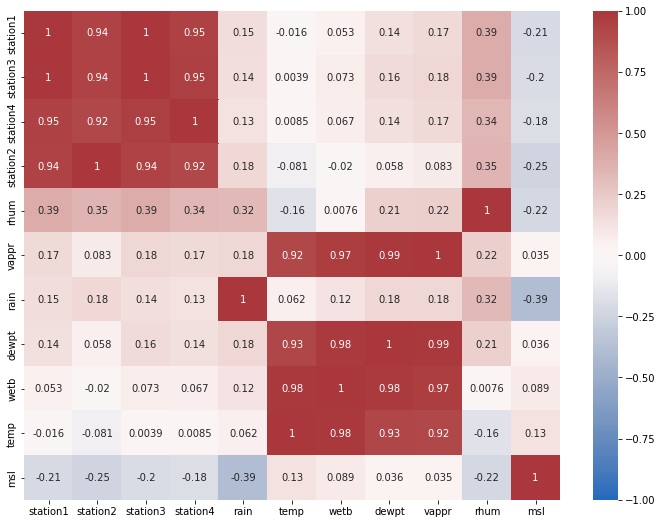

In [ ]:
corr = df_corr.sort_values(by='station1', ascending=False)
plt.figure(figsize=(12, 9))
sns.heatmap(corr, annot=True, vmax=1, vmin=-1, center=0, cmap='vlag')

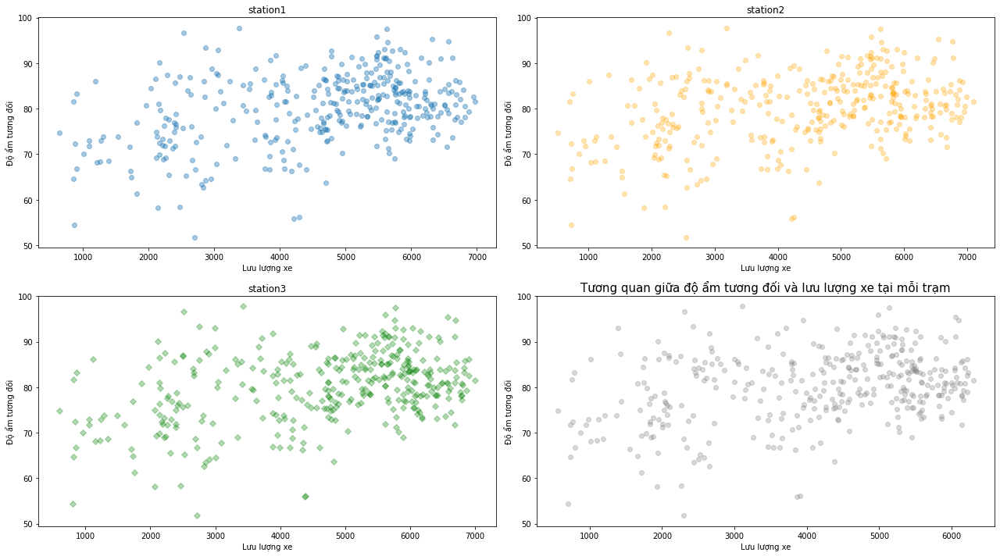

In [ ]:
plt.figure(figsize= (18, 10))
# Cut the window with 2 rows and 2 columns:
plt.subplot(221)
plt.plot( 'station1', 'rhum', data=df, linestyle='none', marker='o', alpha=0.4)
plt.title('station1')
plt.xlabel('Lưu lượng xe')
plt.ylabel('Độ ẩm tương đối')
plt.subplot(222)
plt.plot( 'station2', 'rhum', data=df, linestyle='none', marker='o', color="orange", alpha=0.3)
plt.title('station2')
plt.xlabel('Lưu lượng xe')
plt.ylabel('Độ ẩm tương đối')
plt.subplot(223)
plt.plot( 'station3', 'rhum', data=df, linestyle='none', marker='D', color="green", alpha=0.3)
plt.title('station3')
plt.xlabel('Lưu lượng xe')
plt.ylabel('Độ ẩm tương đối')
plt.subplot(224)
plt.plot( 'station4', 'rhum', data=df, linestyle='none', marker='o', color="grey", alpha=0.3)
plt.title('station4')
plt.xlabel('Lưu lượng xe')
plt.ylabel('Độ ẩm tương đối')

# Show the graph
plt.title('Tương quan giữa độ ẩm tương đối và lưu lượng xe tại mỗi trạm', fontsize = 15)
plt.tight_layout()
plt.show()

# **3. Điền khuyết dữ liệu**

## **Làm khuyết dữ liệu**

Xóa các phân đoạn ngẫu nhiên (gồm các giá trị liên tiếp) khỏi mỗi station với kích thước 1 tuần, 1 tháng và 2 tháng.

In [ ]:
station1 = normalize_df(station1, type = 'traffic')
station2 = normalize_df(station2, type = 'traffic')
station3 = normalize_df(station3, type = 'traffic')
station4 = normalize_df(station4, type = 'traffic')
weather = normalize_df(weather, type = 'weaather')

In [ ]:
def create_missing(df, number_of_missing, seed):
  '''Tạo các đoạn khuyết có kích thước cố định với index ngẫu nhiên'''
  random.seed(a=seed, version=2)
  init_idx = random.randint(0, df.shape[0])
  new_df = df.assign()
  new_df.iloc[init_idx:init_idx + number_of_missing, :] = np.nan
  return new_df

In [ ]:
station1_a_week = create_missing(station1, 168, 10)
station2_a_week = create_missing(station2, 168, 20)
station3_a_week = create_missing(station3, 168, 30)
station4_a_week = create_missing(station4, 168, 40)
weather_a_week = create_missing(weather, 168, 50)

In [ ]:
station1_a_week.isna().sum()

Invalid    168
MBIKE      168
CAR        168
LGV        168
BUS        168
CARAVAN    168
Total      168
HGVs       168
dtype: int64

Text(0.5, 1.0, 'Khoảng thiếu 1 tuần tại station 1')

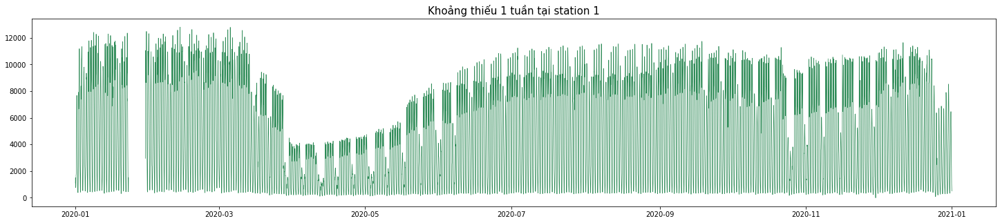

In [ ]:
x = station1_a_week.index.values
y1 = station1_a_week['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tuần tại station 1', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 1 tuần tại station 2')

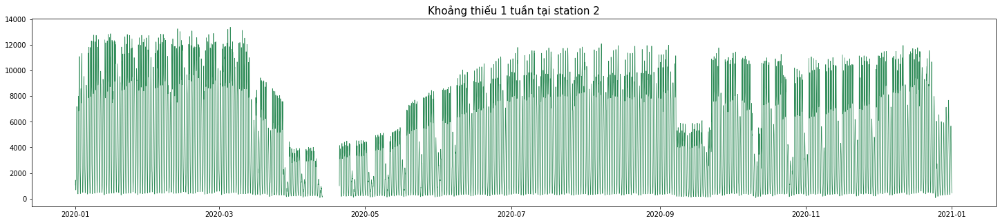

In [ ]:
x = station2_a_week.index.values
y1 = station2_a_week['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tuần tại station 2', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 1 tuần tại station 3')

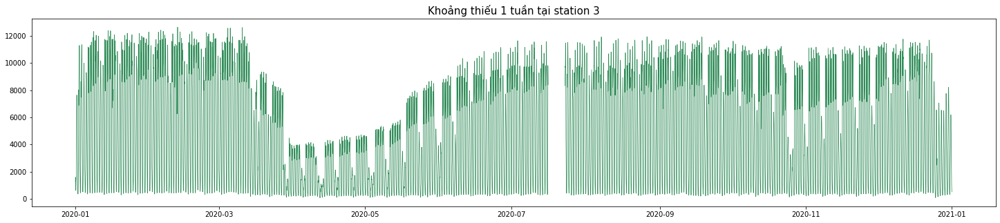

In [ ]:
x = station3_a_week.index.values
y1 = station3_a_week['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tuần tại station 3', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 1 tuần tại station 4')

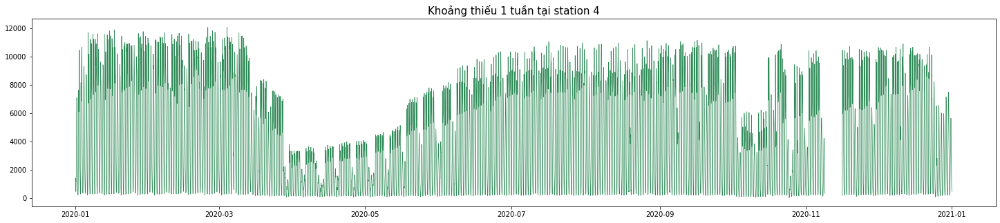

In [ ]:
x = station4_a_week.index.values
y1 = station4_a_week['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tuần tại station 4', fontsize = 15)

In [ ]:
station1_a_month = create_missing(station1, 720, 5)
station2_a_month = create_missing(station2, 720, 15)
station3_a_month = create_missing(station3, 720, 25)
station4_a_month = create_missing(station4, 720, 35)
weather_a_month = create_missing(weather, 720, 45)

In [ ]:
station2_a_month.isna().sum()

Invalid    720
MBIKE      720
CAR        720
LGV        720
BUS        720
CARAVAN    720
Total      720
HGVs       720
dtype: int64

Text(0.5, 1.0, 'Khoảng thiếu 1 tháng tại station 1')

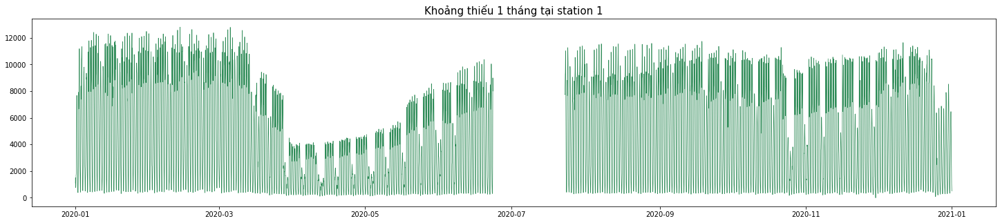

In [ ]:
x = station1_a_month.index.values
y1 = station1_a_month['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tháng tại station 1', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 1 tháng tại station 2')

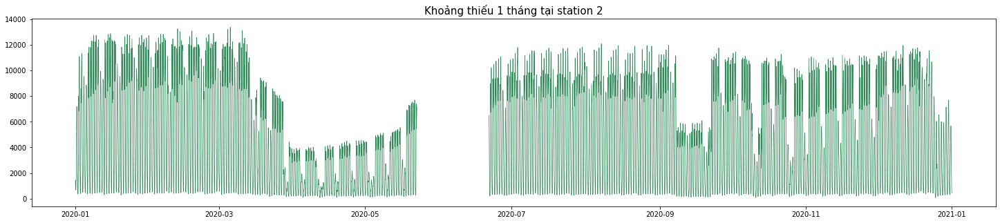

In [ ]:
x = station2_a_month.index.values
y1 = station2_a_month['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tháng tại station 2', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 1 tháng tại station 3')

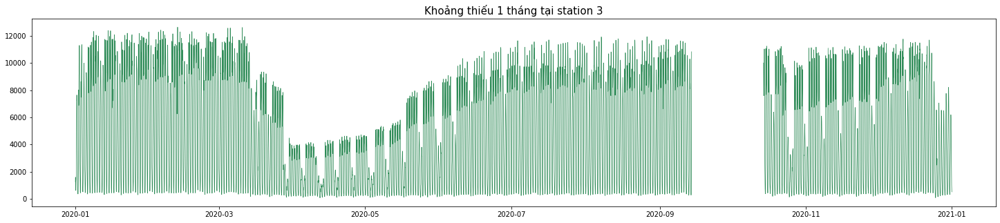

In [ ]:
x = station3_a_month.index.values
y1 = station3_a_month['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tháng tại station 3', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 1 tháng tại station 4')

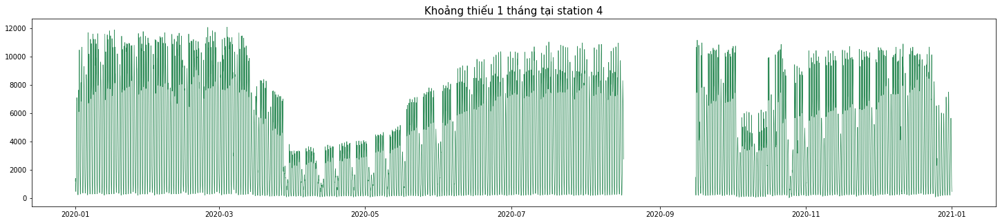

In [ ]:
x = station4_a_month.index.values
y1 = station4_a_month['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 1 tháng tại station 4', fontsize = 15)

In [ ]:
station1_2_months = create_missing(station1, 1440, 42)
station2_2_months = create_missing(station2, 1440, 56)
station3_2_months = create_missing(station3, 1440, 4)
station4_2_months = create_missing(station4, 1440, 77)
weather_2_months = create_missing(weather, 1440, 93)

In [ ]:
station3_2_months.isna().sum()

Invalid    1440
MBIKE      1440
CAR        1440
LGV        1440
BUS        1440
CARAVAN    1440
Total      1440
HGVs       1440
dtype: int64

Text(0.5, 1.0, 'Khoảng thiếu 2 tháng tại station 1')

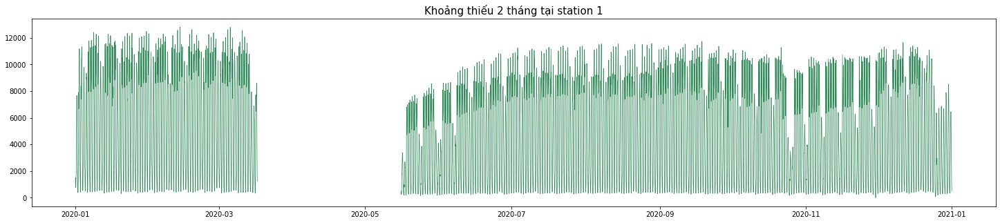

In [ ]:
x = station1_2_months.index.values
y1 = station1_2_months['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 2 tháng tại station 1', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 2 tháng tại station 2')

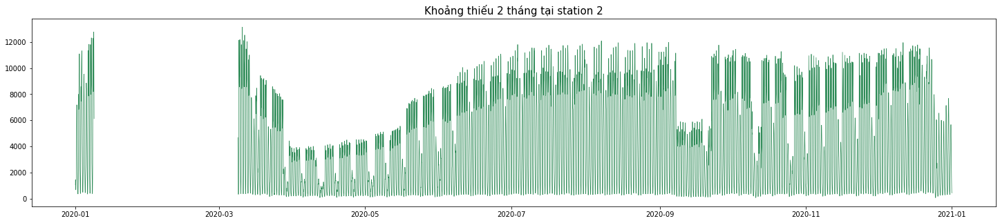

In [ ]:
x = station2_2_months.index.values
y1 = station2_2_months['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 2 tháng tại station 2', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 2 tháng tại station 3')

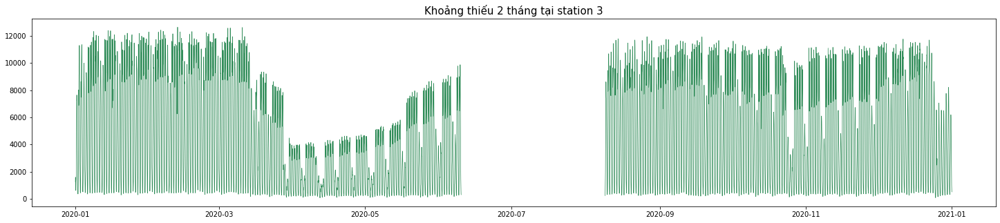

In [ ]:
x = station3_2_months.index.values
y1 = station3_2_months['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 2 tháng tại station 3', fontsize = 15)

Text(0.5, 1.0, 'Khoảng thiếu 2 tháng tại station 4')

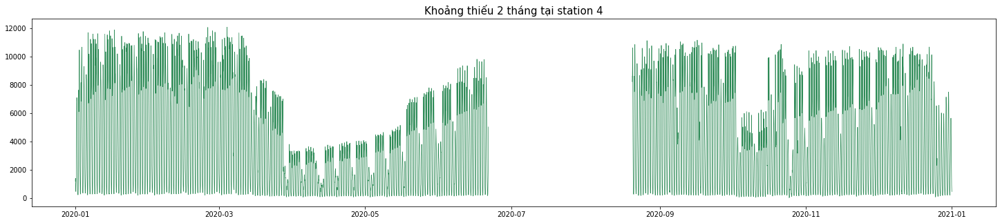

In [ ]:
x = station4_2_months.index.values
y1 = station4_2_months['Total'].values

plt.figure(figsize = (25, 5))
plt.plot(x, y1 ,color = 'seagreen', linewidth = 0.7)
plt.title('Khoảng thiếu 2 tháng tại station 4', fontsize = 15)

In [ ]:
def findna(data):
  temp = data.reset_index(drop = True)
  l = temp[temp.isna().any(axis = 1)].index
  return l

In [ ]:
# In khoảng thời gian missing
print('Khoảng thời gian missing 1 tuần tại station 1 ', station1_a_week.index[findna(station1_a_week)][0], '-', station1_a_week.index[findna(station1_a_week)][-1])
print('Khoảng thời gian missing 1 tuần tại station 2 ', station2_a_week.index[findna(station2_a_week)][0], '-', station2_a_week.index[findna(station2_a_week)][-1])
print('Khoảng thời gian missing 1 tuần tại station 3 ', station3_a_week.index[findna(station3_a_week)][0], '-', station3_a_week.index[findna(station3_a_week)][-1])
print('Khoảng thời gian missing 1 tuần tại station 4 ', station4_a_week.index[findna(station4_a_week)][0], '-', station4_a_week.index[findna(station4_a_week)][-1])

print('Khoảng thời gian missing 1 tháng tại station 1 ', station1_a_month.index[findna(station1_a_month)][0], '-', station1_a_month.index[findna(station1_a_month)][-1])
print('Khoảng thời gian missing 1 tháng tại station 2 ', station2_a_month.index[findna(station2_a_month)][0], '-', station2_a_month.index[findna(station2_a_month)][-1])
print('Khoảng thời gian missing 1 tháng tại station 3 ', station3_a_month.index[findna(station3_a_month)][0], '-', station3_a_month.index[findna(station3_a_month)][-1])
print('Khoảng thời gian missing 1 tháng tại station 4 ', station4_a_month.index[findna(station4_a_month)][0], '-', station4_a_month.index[findna(station4_a_month)][-1])

print('Khoảng thời gian missing 2 tháng tại station 1 ', station1_2_months.index[findna(station1_2_months)][0], '-', station1_2_months.index[findna(station1_2_months)][-1])
print('Khoảng thời gian missing 2 tháng tại station 2 ', station2_2_months.index[findna(station2_2_months)][0], '-', station2_2_months.index[findna(station2_2_months)][-1])
print('Khoảng thời gian missing 2 tháng tại station 3 ', station3_2_months.index[findna(station3_2_months)][0], '-', station3_2_months.index[findna(station3_2_months)][-1])
print('Khoảng thời gian missing 2 tháng tại station 4 ', station4_2_months.index[findna(station4_2_months)][0], '-', station4_2_months.index[findna(station4_2_months)][-1])

Khoảng thời gian missing 1 tuần tại station 1  2020-01-23 05:00:00 - 2020-01-30 04:00:00
Khoảng thời gian missing 1 tuần tại station 2  2020-04-13 05:00:00 - 2020-04-20 04:00:00
Khoảng thời gian missing 1 tuần tại station 3  2020-07-16 10:00:00 - 2020-07-23 09:00:00
Khoảng thời gian missing 1 tuần tại station 4  2020-11-09 01:00:00 - 2020-11-16 00:00:00
Khoảng thời gian missing 1 tháng tại station 1  2020-06-23 09:00:00 - 2020-07-23 08:00:00
Khoảng thời gian missing 1 tháng tại station 2  2020-05-22 15:00:00 - 2020-06-21 14:00:00
Khoảng thời gian missing 1 tháng tại station 3  2020-09-14 08:00:00 - 2020-10-14 07:00:00
Khoảng thời gian missing 1 tháng tại station 4  2020-08-16 22:00:00 - 2020-09-15 21:00:00
Khoảng thời gian missing 2 tháng tại station 1  2020-03-17 00:00:00 - 2020-05-15 23:00:00
Khoảng thời gian missing 2 tháng tại station 2  2020-01-08 20:00:00 - 2020-03-08 19:00:00
Khoảng thời gian missing 2 tháng tại station 3  2020-06-10 03:00:00 - 2020-08-09 02:00:00
Khoảng thời gi

## **Điền khuyết**

### Độ đo

In [ ]:
def Sim(A,B, data):
  A = np.array(A)
  B = np.array(B)
  sim=0
  for i in findna(data):
    s = 1 / (1 + (abs(B[i]-A[i]) / (max(A)-min(A) )))
    sim += s
  sim = sim / len(findna(data))
  return sim

In [ ]:
import math
def variance(data, ddof=0):
  n = len(data)
  mean = sum(data) / n
  return sum((x - mean) ** 2 for x in data) / (n - ddof)


def SD(data):
  var = variance(data)
  std_dev = math.sqrt(var)
  return std_dev

In [ ]:
def FSD(x, y, data):
  x = x.iloc[findna(data)]
  y = y.iloc[findna(data)]
  return 2 * ( abs(SD(y) - SD(x)) / (SD(y) + SD(x)) )

### Linear Interpolation ( Nội suy tuyến tính)

In [ ]:
def LinearInterpolation(data):
  df = data.drop(['Total', 'Invalid'],axis=1).copy()
  df = df.interpolate(method ='linear', limit_direction ='forward')
  df['Total'] = df.sum(axis=1)
  df['Invalid'] = 0
  return df

#### A Week

In [ ]:
station1_a_week_interpolation = LinearInterpolation(station1_a_week)
station2_a_week_interpolation = LinearInterpolation(station2_a_week)
station3_a_week_interpolation = LinearInterpolation(station3_a_week)
station4_a_week_interpolation = LinearInterpolation(station4_a_week)

In [ ]:
print('Sim của station1_a_week: ', Sim(station1['Total'],station1_a_week_interpolation['Total'], station1_a_week))
print('Sim của station2_a_week: ', Sim(station2['Total'],station2_a_week_interpolation['Total'], station2_a_week))
print('Sim của station3_a_week: ', Sim(station3['Total'],station3_a_week_interpolation['Total'], station3_a_week))
print('Sim của station4_a_week: ', Sim(station4['Total'],station4_a_week_interpolation['Total'], station4_a_week))

Sim của station1_a_week:  0.7636681551539555
Sim của station2_a_week:  0.9222258234940061
Sim của station3_a_week:  0.7935166486781464
Sim của station4_a_week:  0.795615691575723


In [ ]:
print('FSD của station1_a_week: ',FSD(station1['Total'],station1_a_week_interpolation['Total'], station1_a_week))
print('FSD của station2_a_week: ',FSD(station2['Total'],station2_a_week_interpolation['Total'], station2_a_week))
print('FSD của station3_a_week: ',FSD(station3['Total'],station3_a_week_interpolation['Total'], station3_a_week))
print('FSD của station4_a_week: ',FSD(station4['Total'],station4_a_week_interpolation['Total'], station4_a_week))

FSD của station1_a_week:  1.6175249502218292
FSD của station2_a_week:  1.4006918785661895
FSD của station3_a_week:  1.979844020360914
FSD của station4_a_week:  1.9516710612358579


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_a_week: ', mean_squared_error(station1['Total'], station1_a_week_interpolation['Total'], squared=False))
print('RMSE của station2_a_week: ', mean_squared_error(station2['Total'], station2_a_week_interpolation['Total'], squared=False))
print('RMSE của station3_a_week: ', mean_squared_error(station3['Total'], station3_a_week_interpolation['Total'], squared=False))
print('RMSE của station4_a_week: ', mean_squared_error(station4['Total'], station4_a_week_interpolation['Total'], squared=False))

RMSE của station1_a_week:  764.4140000448073
RMSE của station2_a_week:  234.1938763960015
RMSE của station3_a_week:  660.1590562309133
RMSE của station4_a_week:  685.7994654293466


#### A Month

In [ ]:
station1_a_month_interpolation = LinearInterpolation(station1_a_month)
station2_a_month_interpolation = LinearInterpolation(station2_a_month)
station3_a_month_interpolation = LinearInterpolation(station3_a_month)
station4_a_month_interpolation = LinearInterpolation(station4_a_month)

In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_interpolation['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_interpolation['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_interpolation['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_interpolation['Total'], station4_a_month))

Sim của station1_a_month:  0.8043544264718766
Sim của station2_a_month:  0.7997075719391806
Sim của station3_a_month:  0.7312914096430041
Sim của station4_a_month:  0.7806569966315853


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_interpolation['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_interpolation['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_interpolation['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_interpolation['Total'], station4_a_month))

FSD của station1_a_month:  1.926028506983237
FSD của station2_a_month:  1.7695886488124672
FSD của station3_a_month:  1.7635419144496947
FSD của station4_a_month:  1.6320050087644637


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_interpolation['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_interpolation['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_interpolation['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_interpolation['Total'], squared=False))

RMSE của station1_a_month:  1285.0611456495349
RMSE của station2_a_month:  1240.7050761127907
RMSE của station3_a_month:  1857.4589537580507
RMSE của station4_a_month:  1331.1385058758642


#### 2 Month

In [ ]:
station1_2_month_interpolation = LinearInterpolation(station1_2_months)
station2_2_month_interpolation = LinearInterpolation(station2_2_months)
station3_2_month_interpolation = LinearInterpolation(station3_2_months)
station4_2_month_interpolation = LinearInterpolation(station4_2_months)

In [ ]:
print('Sim của station1_2_month: ', Sim(station1['Total'],station1_2_month_interpolation['Total'], station1_2_months))
print('Sim của station2_2_month: ', Sim(station2['Total'],station2_2_month_interpolation['Total'], station2_2_months))
print('Sim của station3_2_month: ', Sim(station3['Total'],station3_2_month_interpolation['Total'], station3_2_months))
print('Sim của station4_2_month: ', Sim(station4['Total'],station4_2_month_interpolation['Total'], station4_2_months))

Sim của station1_2_month:  0.8909909769545833
Sim của station2_2_month:  0.7806064171738678
Sim của station3_2_month:  0.7515285238628504
Sim của station4_2_month:  0.7958714058981485


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_2_month_interpolation['Total'], station1_2_months))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_2_month_interpolation['Total'], station2_2_months))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_2_month_interpolation['Total'], station3_2_months))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_2_month_interpolation['Total'], station4_2_months))

FSD của station1_a_month:  1.617964239733016
FSD của station2_a_month:  1.6364474913247102
FSD của station3_a_month:  1.978814184883643
FSD của station4_a_month:  1.1726738323114292


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_2_month: ', mean_squared_error(station1['Total'], station1_2_month_interpolation['Total'], squared=False))
print('RMSE của station2_2_month: ', mean_squared_error(station2['Total'], station2_2_month_interpolation['Total'], squared=False))
print('RMSE của station3_2_month: ', mean_squared_error(station3['Total'], station3_2_month_interpolation['Total'], squared=False))
print('RMSE của station4_2_month: ', mean_squared_error(station4['Total'], station4_2_month_interpolation['Total'], squared=False))

RMSE của station1_2_month:  982.4902926618053
RMSE của station2_2_month:  1723.4004745944942
RMSE của station3_2_month:  2516.8071257780675
RMSE của station4_2_month:  1636.035724389455


### Rolling Statistics

#### Simple Moving Average

In [ ]:
def SMA(data):
  df = data.drop(['Total', 'Invalid'], axis=1)
  for i in df.columns:
    window = df[i].isna().sum()+1
    df['roll'] = df[i].rolling(window=window, center=True, min_periods=1).mean()
    df[i].update(df['roll'])
  df=df.fillna(value=df)
  df['Total'] = df.sum(axis=1)
  df['Invalid'] = 0
  return df

In [ ]:
station1_a_week_SMA = SMA(station1_a_week)
station2_a_week_SMA = SMA(station2_a_week)
station3_a_week_SMA = SMA(station3_a_week)
station4_a_week_SMA = SMA(station4_a_week)

station1_a_month_SMA = SMA(station1_a_month)
station2_a_month_SMA = SMA(station2_a_month)
station3_a_month_SMA = SMA(station3_a_month)
station4_a_month_SMA = SMA(station4_a_month)

station1_2_month_SMA = SMA(station1_2_months)
station2_2_month_SMA = SMA(station2_2_months)
station3_2_month_SMA = SMA(station3_2_months)
station4_2_month_SMA = SMA(station4_2_months)

In [ ]:
print('Sim của station1_a_week: ', Sim(station1['Total'],station1_a_week_SMA['Total'], station1_a_week))
print('Sim của station2_a_week: ', Sim(station2['Total'],station2_a_week_SMA['Total'], station2_a_week))
print('Sim của station3_a_week: ', Sim(station3['Total'],station3_a_week_SMA['Total'], station3_a_week))
print('Sim của station4_a_week: ', Sim(station4['Total'],station4_a_week_SMA['Total'], station4_a_week))

print('\nFSD của station1_a_week: ',FSD(station1['Total'],station1_a_week_SMA['Total'], station1_a_week))
print('FSD của station2_a_week: ',FSD(station2['Total'],station2_a_week_SMA['Total'], station2_a_week))
print('FSD của station3_a_week: ',FSD(station3['Total'],station3_a_week_SMA['Total'], station3_a_week))
print('FSD của station4_a_week: ',FSD(station4['Total'],station4_a_week_SMA['Total'], station4_a_week))

print('\nRMSE của station1_a_week: ', mean_squared_error(station1['Total'], station1_a_week_SMA['Total'], squared=False))
print('RMSE của station2_a_week: ', mean_squared_error(station2['Total'], station2_a_week_SMA['Total'], squared=False))
print('RMSE của station3_a_week: ', mean_squared_error(station3['Total'], station3_a_week_SMA['Total'], squared=False))
print('RMSE của station4_a_week: ', mean_squared_error(station4['Total'], station4_a_week_SMA['Total'], squared=False))

Sim của station1_a_week:  0.7853466763976578
Sim của station2_a_week:  0.8919873396316594
Sim của station3_a_week:  0.7861820695517129
Sim của station4_a_week:  0.7907387754608424

FSD của station1_a_week:  0.7294431287321834
FSD của station2_a_week:  0.10184303333867113
FSD của station3_a_week:  0.9687241208958338
FSD của station4_a_week:  0.7896404213348924

RMSE của station1_a_week:  3374.77471592236
RMSE của station2_a_week:  3422.105638932521
RMSE của station3_a_week:  3538.1787317177577
RMSE của station4_a_week:  3244.31333162267


In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_SMA['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_SMA['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_SMA['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_SMA['Total'], station4_a_month))

print('\nFSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_SMA['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_SMA['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_SMA['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_SMA['Total'], station4_a_month))

print('\nRMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_SMA['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_SMA['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_SMA['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_SMA['Total'], squared=False))

Sim của station1_a_month:  0.8041052597770325
Sim của station2_a_month:  0.8341633822078456
Sim của station3_a_month:  0.7962823802979122
Sim của station4_a_month:  0.7947668187184127

FSD của station1_a_month:  1.200318874047938
FSD của station2_a_month:  0.9882803153767888
FSD của station3_a_month:  1.2420579125103242
FSD của station4_a_month:  1.4495563440921677

RMSE của station1_a_month:  3346.9477488114635
RMSE của station2_a_month:  3430.128605491061
RMSE của station3_a_month:  3513.5639506098446
RMSE của station4_a_month:  3227.5821509754132


In [ ]:
print('Sim của station1_2_month: ', Sim(station1['Total'],station1_2_month_SMA['Total'], station1_2_months))
print('Sim của station2_2_month: ', Sim(station2['Total'],station2_2_month_SMA['Total'], station2_2_months))
print('Sim của station3_2_month: ', Sim(station3['Total'],station3_2_month_SMA['Total'], station3_2_months))
print('Sim của station4_2_month: ', Sim(station4['Total'],station4_2_month_SMA['Total'], station4_2_months))

print('\nFSD của station1_2_month: ',FSD(station1['Total'],station1_2_month_SMA['Total'], station1_2_months))
print('FSD của station2_2_month: ',FSD(station2['Total'],station2_2_month_SMA['Total'], station2_2_months))
print('FSD của station3_2_month: ',FSD(station3['Total'],station3_2_month_SMA['Total'], station3_2_months))
print('FSD của station4_2_month: ',FSD(station4['Total'],station4_2_month_SMA['Total'], station4_2_months))

print('\nRMSE của station1_2_month: ', mean_squared_error(station1['Total'], station1_2_month_SMA['Total'], squared=False))
print('RMSE của station2_2_month: ', mean_squared_error(station2['Total'], station2_2_month_SMA['Total'], squared=False))
print('RMSE của station3_2_month: ', mean_squared_error(station3['Total'], station3_2_month_SMA['Total'], squared=False))
print('RMSE của station4_2_month: ', mean_squared_error(station4['Total'], station4_2_month_SMA['Total'], squared=False))

Sim của station1_2_month:  0.8367445974704799
Sim của station2_2_month:  0.7842777816640027
Sim của station3_2_month:  0.7919058979212391
Sim của station4_2_month:  0.7941035966942555

FSD của station1_2_month:  0.2993023763805613
FSD của station2_2_month:  1.245114173457047
FSD của station3_2_month:  1.142185189881603
FSD của station4_2_month:  1.2975304251266484

RMSE của station1_2_month:  3532.5596541300815
RMSE của station2_2_month:  3467.1618236028453
RMSE của station3_2_month:  3553.384119218645
RMSE của station4_2_month:  3263.673453352059


#### Exponential (Weighted) Moving Average

In [ ]:
def EWM(data):
  df = data.drop(['Total', 'Invalid'], axis=1)
  df_ewm = data.drop(['Total'], axis=1)

  df_ewm = df_ewm.ewm(halflife=4).mean()

  df=df.fillna(value=df_ewm)
  df['Total'] = df.sum(axis=1)
  df['Invalid'] = 0
  return df

In [ ]:
station1_a_week_EWM = EWM(station1_a_week)
station2_a_week_EWM = EWM(station2_a_week)
station3_a_week_EWM = EWM(station3_a_week)
station4_a_week_EWM = EWM(station4_a_week)

station1_a_month_EWM = EWM(station1_a_month)
station2_a_month_EWM = EWM(station2_a_month)
station3_a_month_EWM = EWM(station3_a_month)
station4_a_month_EWM = EWM(station4_a_month)

station1_2_month_EWM = EWM(station1_2_months)
station2_2_month_EWM = EWM(station2_2_months)
station3_2_month_EWM = EWM(station3_2_months)
station4_2_month_EWM = EWM(station4_2_months)

In [ ]:
print('Sim của station1_a_week: ', Sim(station1['Total'],station1_a_week_EWM['Total'], station1_a_week))
print('Sim của station2_a_week: ', Sim(station2['Total'],station2_a_week_EWM['Total'], station2_a_week))
print('Sim của station3_a_week: ', Sim(station3['Total'],station3_a_week_EWM['Total'], station3_a_week))
print('Sim của station4_a_week: ', Sim(station4['Total'],station4_a_week_EWM['Total'], station4_a_week))

print('\nFSD của station1_a_week: ',FSD(station1['Total'],station1_a_week_EWM['Total'], station1_a_week))
print('FSD của station2_a_week: ',FSD(station2['Total'],station2_a_week_EWM['Total'], station2_a_week))
print('FSD của station3_a_week: ',FSD(station3['Total'],station3_a_week_EWM['Total'], station3_a_week))
print('FSD của station4_a_week: ',FSD(station4['Total'],station4_a_week_EWM['Total'], station4_a_week))

print('\nRMSE của station1_a_week: ', mean_squared_error(station1['Total'], station1_a_week_EWM['Total'], squared=False))
print('RMSE của station2_a_week: ', mean_squared_error(station2['Total'], station2_a_week_EWM['Total'], squared=False))
print('RMSE của station3_a_week: ', mean_squared_error(station3['Total'], station3_a_week_EWM['Total'], squared=False))
print('RMSE của station4_a_week: ', mean_squared_error(station4['Total'], station4_a_week_EWM['Total'], squared=False))

Sim của station1_a_week:  0.7737808320587469
Sim của station2_a_week:  0.9183245746545804
Sim của station3_a_week:  0.786204446542118
Sim của station4_a_week:  0.814687035405384

FSD của station1_a_week:  1.9999999999999898
FSD của station2_a_week:  1.9999999999999987
FSD của station3_a_week:  1.9999999999999896
FSD của station4_a_week:  1.9999999999999978

RMSE của station1_a_week:  689.9048001406641
RMSE của station2_a_week:  251.60723469577522
RMSE của station3_a_week:  532.8655167233287
RMSE của station4_a_week:  542.5628081624578


In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_EWM['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_EWM['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_EWM['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_EWM['Total'], station4_a_month))

print('\nFSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_EWM['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_EWM['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_EWM['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_EWM['Total'], station4_a_month))

print('\nRMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_EWM['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_EWM['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_EWM['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_EWM['Total'], squared=False))

Sim của station1_a_month:  0.7971663148411378
Sim của station2_a_month:  0.8220885664512843
Sim của station3_a_month:  0.788629058676045
Sim của station4_a_month:  0.7906587700715516

FSD của station1_a_month:  1.9999999999999383
FSD của station2_a_month:  1.99999999999991
FSD của station3_a_month:  1.999999999999931
FSD của station4_a_month:  1.999999999999948

RMSE của station1_a_month:  1054.5551040447035
RMSE của station2_a_month:  977.9137441093761
RMSE của station3_a_month:  1113.1074460394009
RMSE của station4_a_month:  1044.222004667906


In [ ]:
print('Sim của station1_2_month: ', Sim(station1['Total'],station1_2_month_EWM['Total'], station1_2_months))
print('Sim của station2_2_month: ', Sim(station2['Total'],station2_2_month_EWM['Total'], station2_2_months))
print('Sim của station3_2_month: ', Sim(station3['Total'],station3_2_month_EWM['Total'], station3_2_months))
print('Sim của station4_2_month: ', Sim(station4['Total'],station4_2_month_EWM['Total'], station4_2_months))

print('\nFSD của station1_2_month: ',FSD(station1['Total'],station1_2_month_EWM['Total'], station1_2_months))
print('FSD của station2_2_month: ',FSD(station2['Total'],station2_2_month_EWM['Total'], station2_2_months))
print('FSD của station3_2_month: ',FSD(station3['Total'],station3_2_month_EWM['Total'], station3_2_months))
print('FSD của station4_2_month: ',FSD(station4['Total'],station4_2_month_EWM['Total'], station4_2_months))

print('\nRMSE của station1_2_month: ', mean_squared_error(station1['Total'], station1_2_month_EWM['Total'], squared=False))
print('RMSE của station2_2_month: ', mean_squared_error(station2['Total'], station2_2_month_EWM['Total'], squared=False))
print('RMSE của station3_2_month: ', mean_squared_error(station3['Total'], station3_2_month_EWM['Total'], squared=False))
print('RMSE của station4_2_month: ', mean_squared_error(station4['Total'], station4_2_month_EWM['Total'], squared=False))

Sim của station1_2_month:  0.8523326142072384
Sim của station2_2_month:  0.7898850745278144
Sim của station3_2_month:  0.7850075353398547
Sim của station4_2_month:  0.7835261530688189

FSD của station1_2_month:  1.999999999999924
FSD của station2_2_month:  1.9999999999999756
FSD của station3_2_month:  1.9999999999998983
FSD của station4_2_month:  1.9999999999999774

RMSE của station1_2_month:  1091.8381678248309
RMSE của station2_2_month:  2020.1097118073142
RMSE của station3_2_month:  1818.3077986402927
RMSE của station4_2_month:  1769.629035702917


### K-Nearest Neighbour (KNN) Imputation

In [ ]:
from sklearn.impute import KNNImputer

def KNN(data):
  df = data.copy()
  df = df.drop(['Total','Invalid'], axis=1)
  knn_imputer = KNNImputer(n_neighbors=5, weights='distance', metric='nan_euclidean')
  df_knn_imputed = pd.DataFrame(knn_imputer.fit_transform(df), columns=df.columns)
  df_knn_imputed['Total'] = df_knn_imputed.sum(axis=1)
  df_knn_imputed['Invalid'] = 0
  return df_knn_imputed

#### A Week

In [ ]:
station1_a_week_knn = KNN(station1_a_week)
station2_a_week_knn = KNN(station2_a_week)
station3_a_week_knn = KNN(station3_a_week)
station4_a_week_knn = KNN(station4_a_week)

In [ ]:
print('Sim của station1_a_week: ', Sim(station1['Total'],station1_a_week_knn['Total'], station1_a_week))
print('Sim của station2_a_week: ', Sim(station2['Total'],station2_a_week_knn['Total'], station2_a_week))
print('Sim của station3_a_week: ', Sim(station3['Total'],station3_a_week_knn['Total'], station3_a_week))
print('Sim của station4_a_week: ', Sim(station4['Total'],station4_a_week_knn['Total'], station4_a_week))

Sim của station1_a_week:  0.780082535803729
Sim của station2_a_week:  0.8294427678011961
Sim của station3_a_week:  0.7823503256890124
Sim của station4_a_week:  0.8113284972231056


In [ ]:
print('FSD của station1_a_week: ',FSD(station1['Total'],station1_a_week_knn['Total'], station1_a_week))
print('FSD của station2_a_week: ',FSD(station2['Total'],station2_a_week_knn['Total'], station2_a_week))
print('FSD của station3_a_week: ',FSD(station3['Total'],station3_a_week_knn['Total'], station3_a_week))
print('FSD của station4_a_week: ',FSD(station4['Total'],station4_a_week_knn['Total'], station4_a_week))

FSD của station1_a_week:  1.9999999999999822
FSD của station2_a_week:  1.9999999999999587
FSD của station3_a_week:  1.9999999999999916
FSD của station4_a_week:  1.9999999999999956


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_a_week: ', mean_squared_error(station1['Total'], station1_a_week_knn['Total'], squared=False))
print('RMSE của station2_a_week: ', mean_squared_error(station2['Total'], station2_a_week_knn['Total'], squared=False))
print('RMSE của station3_a_week: ', mean_squared_error(station3['Total'], station3_a_week_knn['Total'], squared=False))
print('RMSE của station4_a_week: ', mean_squared_error(station4['Total'], station4_a_week_knn['Total'], squared=False))

RMSE của station1_a_week:  581.5834008348505
RMSE của station2_a_week:  434.6602621835129
RMSE của station3_a_week:  547.4955787920023
RMSE của station4_a_week:  454.6011211589325


#### A Month

In [ ]:
station1_a_month_knn = KNN(station1_a_month)
station2_a_month_knn = KNN(station2_a_month)
station3_a_month_knn = KNN(station3_a_month)
station4_a_month_knn = KNN(station4_a_month)

In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_knn['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_knn['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_knn['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_knn['Total'], station4_a_month))

Sim của station1_a_month:  0.7974748537903109
Sim của station2_a_month:  0.8299390405385525
Sim của station3_a_month:  0.7890867573463042
Sim của station4_a_month:  0.7880406312343974


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_knn['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_knn['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_knn['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_knn['Total'], station4_a_month))

FSD của station1_a_month:  1.9999999999999616
FSD của station2_a_month:  1.9999999999999796
FSD của station3_a_month:  1.9999999999999933
FSD của station4_a_month:  1.9999999999999645


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_knn['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_knn['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_knn['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_knn['Total'], squared=False))

RMSE của station1_a_month:  1048.0715880393338
RMSE của station2_a_month:  888.8353895590545
RMSE của station3_a_month:  1097.2606860871306
RMSE của station4_a_month:  1076.9763629040328


#### 2 Month

In [ ]:
station1_2_month_knn = KNN(station1_2_months)
station2_2_month_knn = KNN(station2_2_months)
station3_2_month_knn = KNN(station3_2_months)
station4_2_month_knn = KNN(station4_2_months)

In [ ]:
print('Sim của station1_2_month: ', Sim(station1['Total'],station1_2_month_knn['Total'], station1_2_months))
print('Sim của station2_2_month: ', Sim(station2['Total'],station2_2_month_knn['Total'], station2_2_months))
print('Sim của station3_2_month: ', Sim(station3['Total'],station3_2_month_knn['Total'], station3_2_months))
print('Sim của station4_2_month: ', Sim(station4['Total'],station4_2_month_knn['Total'], station4_2_months))

Sim của station1_2_month:  0.8195097005897095
Sim của station2_2_month:  0.7791600468985944
Sim của station3_2_month:  0.7897284159530594
Sim của station4_2_month:  0.7906430250234586


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_2_month_knn['Total'], station1_2_months))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_2_month_knn['Total'], station2_2_months))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_2_month_knn['Total'], station3_2_months))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_2_month_knn['Total'], station4_2_months))

FSD của station1_a_month:  1.9999999999999258
FSD của station2_a_month:  1.9999999999999276
FSD của station3_a_month:  1.9999999999998794
FSD của station4_a_month:  1.9999999999999434


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_2_month: ', mean_squared_error(station1['Total'], station1_2_month_knn['Total'], squared=False))
print('RMSE của station2_2_month: ', mean_squared_error(station2['Total'], station2_2_month_knn['Total'], squared=False))
print('RMSE của station3_2_month: ', mean_squared_error(station3['Total'], station3_2_month_knn['Total'], squared=False))
print('RMSE của station4_2_month: ', mean_squared_error(station4['Total'], station4_2_month_knn['Total'], squared=False))

RMSE của station1_2_month:  1350.097720092093
RMSE của station2_2_month:  1880.9021746332608
RMSE của station3_2_month:  1539.993987902151
RMSE của station4_2_month:  1484.709055474003


### MICE

In [ ]:
pip install miceforest

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 57 kB 3.0 MB/s 
     |████████████████████████████████| 2.6 MB 10.0 MB/s 
     |████████████████████████████████| 2.0 MB 61.8 MB/s 
  Attempting uninstall: lightgbm
    Found existing installation: lightgbm 2.2.3
    Uninstalling lightgbm-2.2.3:
      Successfully uninstalled lightgbm-2.2.3


In [ ]:
import miceforest as mf

def MICE(data):
  df1 = data.copy()
  df1 = df1.drop(['Total','Invalid'], axis=1)
  # Create kernel. 
  kernel = mf.ImputationKernel(
    df1,
    #datasets=8,
    save_all_iterations=True,
    random_state=1989
  )
  # Run the MICE algorithm for 3 iterations on each of the datasets
  kernel.mice(15)
  #View Last Dataset Imputed
  df = kernel.complete_data(0)
  df['Total'] = df.sum(axis=1)
  df['Invalid'] = 0
  return df

#### A Week

In [ ]:
station1_a_week_mice = MICE(station1_a_week)
station2_a_week_mice = MICE(station2_a_week)
station3_a_week_mice = MICE(station3_a_week)
station4_a_week_mice = MICE(station4_a_week)

In [ ]:
print('Sim của station1_a_week: ',Sim(station1['Total'],station1_a_week_mice['Total'], station1_a_week))
print('Sim của station2_a_week: ',Sim(station2['Total'],station2_a_week_mice['Total'], station2_a_week))
print('Sim của station3_a_week: ',Sim(station3['Total'],station3_a_week_mice['Total'], station3_a_week))
print('Sim của station4_a_week: ',Sim(station4['Total'],station4_a_week_mice['Total'], station4_a_week))

Sim của station1_a_week:  0.7631966169815896
Sim của station2_a_week:  0.8007094744279567
Sim của station3_a_week:  0.7644800716064512
Sim của station4_a_week:  0.7728896742485912


In [ ]:
print('FSD của station1_a_week: ',FSD(station1['Total'],station1_a_week_mice['Total'], station1_a_week))
print('FSD của station2_a_week: ',FSD(station2['Total'],station2_a_week_mice['Total'], station2_a_week))
print('FSD của station3_a_week: ',FSD(station3['Total'],station3_a_week_mice['Total'], station3_a_week))
print('FSD của station4_a_week: ',FSD(station4['Total'],station4_a_week_mice['Total'], station4_a_week))

FSD của station1_a_week:  0.14545525223812927
FSD của station2_a_week:  0.8777677909489568
FSD của station3_a_week:  0.09893252520525014
FSD của station4_a_week:  0.0038825143806370753


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_a_week: ', mean_squared_error(station1['Total'], station1_a_week_mice['Total'], squared=False))
print('RMSE của station2_a_week: ', mean_squared_error(station2['Total'], station2_a_week_mice['Total'], squared=False))
print('RMSE của station3_a_week: ', mean_squared_error(station3['Total'], station3_a_week_mice['Total'], squared=False))
print('RMSE của station4_a_week: ', mean_squared_error(station4['Total'], station4_a_week_mice['Total'], squared=False))

RMSE của station1_a_week:  720.5437322954612
RMSE của station2_a_week:  692.8816428293835
RMSE của station3_a_week:  751.8798617483595
RMSE của station4_a_week:  661.0706626320018


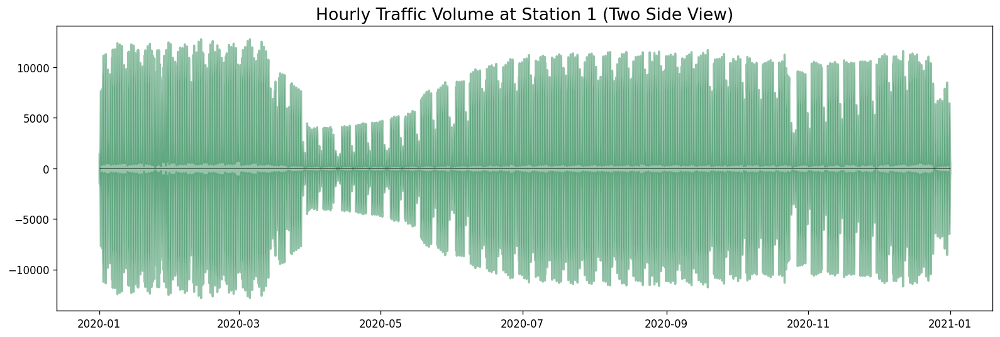

In [ ]:
x = station1_a_week.index.values
y1 = station1_a_week_mice['Total'].values

# Plot
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 120)
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.title('Hourly Traffic Volume at Station 1 (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(station1_a_week.index), xmax=np.max(station1_a_week.index), linewidth=.5)
plt.show()

#### A month

In [ ]:
station1_a_month_mice = MICE(station1_a_month)
station2_a_month_mice = MICE(station2_a_month)
station3_a_month_mice = MICE(station3_a_month)
station4_a_month_mice = MICE(station4_a_month)

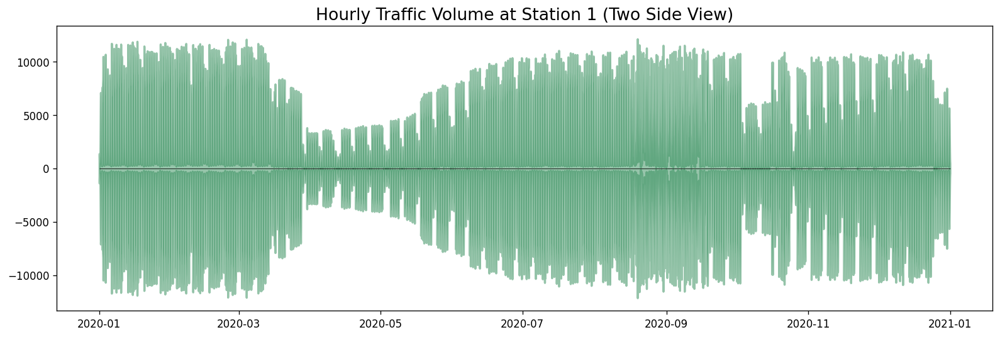

In [ ]:
x = station4_a_month.index.values
y1 = station4_a_month_mice['Total'].values

# Plot
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 120)
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.title('Hourly Traffic Volume at Station 1 (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(station1_a_week.index), xmax=np.max(station1_a_week.index), linewidth=.5)
plt.show()

In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_mice['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_mice['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_mice['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_mice['Total'], station4_a_month))

Sim của station1_a_month:  0.7874241469493299
Sim của station2_a_month:  0.7979914380194024
Sim của station3_a_month:  0.7736091026622928
Sim của station4_a_month:  0.7671558017676493


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_mice['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_mice['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_mice['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_mice['Total'], station4_a_month))

FSD của station1_a_month:  0.0703427909515184
FSD của station2_a_month:  0.1376793809805102
FSD của station3_a_month:  0.04906865678836376
FSD của station4_a_month:  0.12274199087689314


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_mice['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_mice['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_mice['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_mice['Total'], squared=False))

RMSE của station1_a_month:  1363.9002201227258
RMSE của station2_a_month:  1332.602437735384
RMSE của station3_a_month:  1470.6632630509937
RMSE của station4_a_month:  1431.705595553995


#### 2 Month

In [ ]:
station1_2_month_mice = MICE(station1_2_months)
station2_2_month_mice = MICE(station2_2_months)
station3_2_month_mice = MICE(station3_2_months)
station4_2_month_mice = MICE(station4_2_months)

In [ ]:
print('Sim của station1_2_month: ', Sim(station1['Total'],station1_2_month_mice['Total'], station1_2_months))
print('Sim của station2_2_month: ', Sim(station2['Total'],station2_2_month_mice['Total'], station2_2_months))
print('Sim của station3_2_month: ', Sim(station3['Total'],station3_2_month_mice['Total'], station3_2_months))
print('Sim của station4_2_month: ', Sim(station4['Total'],station4_2_month_mice['Total'], station4_2_months))

Sim của station1_2_month:  0.7664034601009645
Sim của station2_2_month:  0.7711308097341361
Sim của station3_2_month:  0.7691047978935989
Sim của station4_2_month:  0.7785799725180068


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_2_month_mice['Total'], station1_2_months))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_2_month_mice['Total'], station2_2_months))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_2_month_mice['Total'], station3_2_months))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_2_month_mice['Total'], station4_2_months))

FSD của station1_a_month:  0.5300437811270012
FSD của station2_a_month:  0.2795193990816093
FSD của station3_a_month:  0.05344466305860678
FSD của station4_a_month:  0.1079786466026738


In [ ]:
from sklearn.metrics import mean_squared_error

print('RMSE của station1_2_month: ', mean_squared_error(station1['Total'], station1_2_month_mice['Total'], squared=False))
print('RMSE của station2_2_month: ', mean_squared_error(station2['Total'], station2_2_month_mice['Total'], squared=False))
print('RMSE của station3_2_month: ', mean_squared_error(station3['Total'], station3_2_month_mice['Total'], squared=False))
print('RMSE của station4_2_month: ', mean_squared_error(station4['Total'], station4_2_month_mice['Total'], squared=False))

RMSE của station1_2_month:  2140.6968307121806
RMSE của station2_2_month:  2236.210061340215
RMSE của station3_2_month:  2109.426965297976
RMSE của station4_2_month:  1905.2734719016692


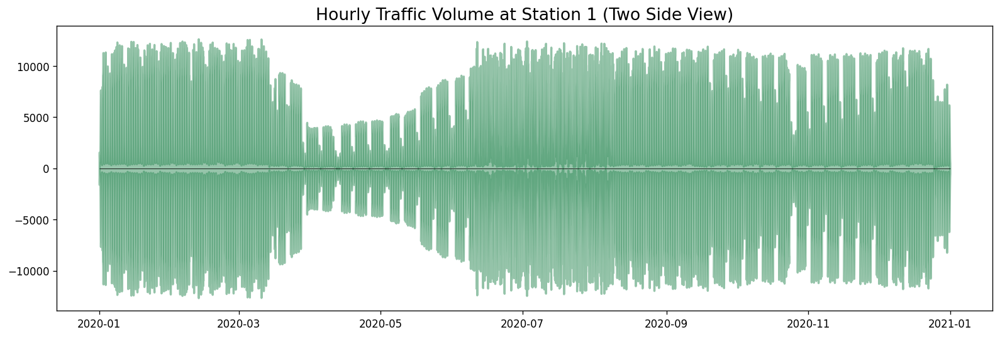

In [ ]:
x = station3_2_months.index.values
y1 = station3_2_month_mice['Total'].values

# Plot
fig, ax = plt.subplots(1, 1, figsize=(16,5), dpi= 120)
plt.fill_between(x, y1=y1, y2=-y1, alpha=0.5, linewidth=2, color='seagreen')
plt.title('Hourly Traffic Volume at Station 1 (Two Side View)', fontsize=16)
plt.hlines(y=0, xmin=np.min(station1_2_months.index), xmax=np.max(station1_2_months.index), linewidth=.5)
plt.show()

### SMWA

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
def combine_seasonal_cols(input_df, seasonal_model_results):
    '''Add results to original df'''
    
    input_df['observed'] = seasonal_model_results.observed
    input_df['residual'] = seasonal_model_results.resid
    input_df['seasonal'] = seasonal_model_results.seasonal
    input_df['trend'] = seasonal_model_results.trend
    return input_df

def SMWA(data):
  df = data.drop(['Total', 'Invalid'],axis=1).copy()
  df_SMWA = pd.DataFrame()
  for i in df.columns:
    # Linear Interpolation
    df_interp = df[i].interpolate(method ='linear', limit_direction ='forward')
    # Time series decomposition
    df_stl = seasonal_decompose(df_interp, model='additive', extrapolate_trend='freq' )
    # 
    input_df = pd.DataFrame()
    combine_seasonal_cols(input_df, df_stl)
    # Moving window for seasonal, resid
    input_df['seasonal'] = input_df['seasonal'].rolling(window= 5, center=True, min_periods=1).mean()
    input_df['residual'] = input_df['residual'].rolling(window= 5, center=True, min_periods=1).mean()

    df_SMWA[i] = input_df.trend + input_df.seasonal + input_df.residual
  
  df=df.fillna(value=df_SMWA)
  df['Total'] = df.sum(axis=1)
  df['Invalid'] = 0
  return df

In [ ]:
station1_a_week_SMWA = SMWA(station1_a_week)
station2_a_week_SMWA = SMWA(station2_a_week)
station3_a_week_SMWA = SMWA(station3_a_week)
station4_a_week_SMWA = SMWA(station4_a_week)

station1_a_month_SMWA = SMWA(station1_a_month)
station2_a_month_SMWA = SMWA(station2_a_month)
station3_a_month_SMWA = SMWA(station3_a_month)
station4_a_month_SMWA = SMWA(station4_a_month)

station1_2_month_SMWA = SMWA(station1_2_months)
station2_2_month_SMWA = SMWA(station2_2_months)
station3_2_month_SMWA = SMWA(station3_2_months)
station4_2_month_SMWA = SMWA(station4_2_months)

In [ ]:
print('Sim của station1_a_week: ', Sim(station1['Total'],station1_a_week_SMWA['Total'], station1_a_week))
print('Sim của station2_a_week: ', Sim(station2['Total'],station2_a_week_SMWA['Total'], station2_a_week))
print('Sim của station3_a_week: ', Sim(station3['Total'],station3_a_week_SMWA['Total'], station3_a_week))
print('Sim của station4_a_week: ', Sim(station4['Total'],station4_a_week_SMWA['Total'], station4_a_week))

print('\nFSD của station1_a_week: ',FSD(station1['Total'],station1_a_week_SMWA['Total'], station1_a_week))
print('FSD của station2_a_week: ',FSD(station2['Total'],station2_a_week_SMWA['Total'], station2_a_week))
print('FSD của station3_a_week: ',FSD(station3['Total'],station3_a_week_SMWA['Total'], station3_a_week))
print('FSD của station4_a_week: ',FSD(station4['Total'],station4_a_week_SMWA['Total'], station4_a_week))

print('\nRMSE của station1_a_week: ', mean_squared_error(station1['Total'], station1_a_week_SMWA['Total'], squared=False))
print('RMSE của station2_a_week: ', mean_squared_error(station2['Total'], station2_a_week_SMWA['Total'], squared=False))
print('RMSE của station3_a_week: ', mean_squared_error(station3['Total'], station3_a_week_SMWA['Total'], squared=False))
print('RMSE của station4_a_week: ', mean_squared_error(station4['Total'], station4_a_week_SMWA['Total'], squared=False))

Sim của station1_a_week:  0.7631066266505858
Sim của station2_a_week:  0.9220163018351892
Sim của station3_a_week:  0.7936638990772638
Sim của station4_a_week:  0.7954924083697666

FSD của station1_a_week:  1.5983158970078497
FSD của station2_a_week:  1.391136532888486
FSD của station3_a_week:  1.967476586584477
FSD của station4_a_week:  1.9457244884644658

RMSE của station1_a_week:  765.4465716736032
RMSE của station2_a_week:  234.3408561465646
RMSE của station3_a_week:  659.997898871162
RMSE của station4_a_week:  686.14924110291


In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_SMWA['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_SMWA['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_SMWA['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_SMWA['Total'], station4_a_month))

print('\nFSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_SMWA['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_SMWA['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_SMWA['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_SMWA['Total'], station4_a_month))

print('\nRMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_SMWA['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_SMWA['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_SMWA['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_SMWA['Total'], squared=False))

Sim của station1_a_month:  0.8043523024112248
Sim của station2_a_month:  0.79966533117339
Sim của station3_a_month:  0.7313055332675981
Sim của station4_a_month:  0.7805886900683485

FSD của station1_a_month:  1.9245366126516017
FSD của station2_a_month:  1.7693391041873647
FSD của station3_a_month:  1.7624903105033563
FSD của station4_a_month:  1.6303330845528123

RMSE của station1_a_month:  1285.0156141996447
RMSE của station2_a_month:  1240.8867319176657
RMSE của station3_a_month:  1857.5251416553244
RMSE của station4_a_month:  1331.4647607232414


In [ ]:
print('Sim của station1_2_month: ', Sim(station1['Total'],station1_2_month_SMWA['Total'], station1_2_months))
print('Sim của station2_2_month: ', Sim(station2['Total'],station2_2_month_SMWA['Total'], station2_2_months))
print('Sim của station3_2_month: ', Sim(station3['Total'],station3_2_month_SMWA['Total'], station3_2_months))
print('Sim của station4_2_month: ', Sim(station4['Total'],station4_2_month_SMWA['Total'], station4_2_months))

print('\nFSD của station1_2_month: ',FSD(station1['Total'],station1_2_month_SMWA['Total'], station1_2_months))
print('FSD của station2_2_month: ',FSD(station2['Total'],station2_2_month_SMWA['Total'], station2_2_months))
print('FSD của station3_2_month: ',FSD(station3['Total'],station3_2_month_SMWA['Total'], station3_2_months))
print('FSD của station4_2_month: ',FSD(station4['Total'],station4_2_month_SMWA['Total'], station4_2_months))

print('\nRMSE của station1_2_month: ', mean_squared_error(station1['Total'], station1_2_month_SMWA['Total'], squared=False))
print('RMSE của station2_2_month: ', mean_squared_error(station2['Total'], station2_2_month_SMWA['Total'], squared=False))
print('RMSE của station3_2_month: ', mean_squared_error(station3['Total'], station3_2_month_SMWA['Total'], squared=False))
print('RMSE của station4_2_month: ', mean_squared_error(station4['Total'], station4_2_month_SMWA['Total'], squared=False))

Sim của station1_2_month:  0.8909667914010959
Sim của station2_2_month:  0.7805608652687273
Sim của station3_2_month:  0.7515063922031612
Sim của station4_2_month:  0.7958448020442751

FSD của station1_2_month:  1.6179931884647454
FSD của station2_2_month:  1.6352937004152623
FSD của station3_2_month:  1.9781076387294303
FSD của station4_2_month:  1.1721809074414624

RMSE của station1_2_month:  982.5628492942845
RMSE của station2_2_month:  1723.6466643738884
RMSE của station3_2_month:  2516.9588974057533
RMSE của station4_2_month:  1636.1074402579886


### DTWBI
Thao tác điền khuyết bằng phương pháp DTWBI được thực hiện bằng ngôn ngữ R trong RStudio

#### A week

In [ ]:
# Import dữ liệu đã điền khuyết bằng R
station1_a_week_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station1_a_week_dtwbi.csv', index_col = 'Datetime')
station2_a_week_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station2_a_week_dtwbi.csv', index_col = 'Datetime')
station3_a_week_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station3_a_week_dtwbi.csv', index_col = 'Datetime')
station4_a_week_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station4_a_week_dtwbi.csv', index_col = 'Datetime')

In [ ]:
print(station1_a_week_dtwbi.isna().sum().sum())
print(station2_a_week_dtwbi.isna().sum().sum())
print(station3_a_week_dtwbi.isna().sum().sum())
print(station4_a_week_dtwbi.isna().sum().sum())

0
0
0
0


In [ ]:
print('Sim của station1_a_week: ', Sim(station1['Total'],station1_a_week_dtwbi['Total'], station1_a_week))
print('Sim của station2_a_week: ', Sim(station2['Total'],station2_a_week_dtwbi['Total'], station2_a_week))
print('Sim của station3_a_week: ', Sim(station3['Total'],station3_a_week_dtwbi['Total'], station3_a_week))
print('Sim của station4_a_week: ', Sim(station4['Total'],station4_a_week_dtwbi['Total'], station4_a_week))

Sim của station1_a_week:  0.815714311009065
Sim của station2_a_week:  0.9797827538056063
Sim của station3_a_week:  0.881575889845612
Sim của station4_a_week:  0.8378477248164502


In [ ]:
print('FSD của station1_a_week: ',FSD(station1['Total'],station1_a_week_dtwbi['Total'], station1_a_week))
print('FSD của station2_a_week: ',FSD(station2['Total'],station2_a_week_dtwbi['Total'], station2_a_week))
print('FSD của station3_a_week: ',FSD(station3['Total'],station3_a_week_dtwbi['Total'], station3_a_week))
print('FSD của station4_a_week: ',FSD(station4['Total'],station4_a_week_dtwbi['Total'], station4_a_week))

FSD của station1_a_week:  0.09490217758828642
FSD của station2_a_week:  0.09834391504398857
FSD của station3_a_week:  0.00810479398253534
FSD của station4_a_week:  0.8268769102818069


In [ ]:
print('RMSE của station1_a_week: ', mean_squared_error(station1['Total'], station1_a_week_dtwbi['Total'], squared=False))
print('RMSE của station2_a_week: ', mean_squared_error(station2['Total'], station2_a_week_dtwbi['Total'], squared=False))
print('RMSE của station3_a_week: ', mean_squared_error(station3['Total'], station3_a_week_dtwbi['Total'], squared=False))
print('RMSE của station4_a_week: ', mean_squared_error(station4['Total'], station4_a_week_dtwbi['Total'], squared=False))

RMSE của station1_a_week:  534.23068442418
RMSE của station2_a_week:  97.87126781518812
RMSE của station3_a_week:  343.8017669250719
RMSE của station4_a_week:  459.6169018798425


#### A Month

In [ ]:
# Import dữ liệu đã điền khuyết bằng R
station1_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station1_a_month_dtwbi.csv')
station2_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station2_a_month_dtwbi.csv')
station3_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station3_a_month_dtwbi.csv')
station4_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station4_a_month_dtwbi.csv')

In [ ]:
station1_a_month_dtwbi = Convert_datatypes(station1_a_month_dtwbi)
station2_a_month_dtwbi = Convert_datatypes(station2_a_month_dtwbi)
station3_a_month_dtwbi = Convert_datatypes(station3_a_month_dtwbi)
station4_a_month_dtwbi = Convert_datatypes(station4_a_month_dtwbi)

station1_a_month_dtwbi = station1_a_month_dtwbi.set_index('Datetime')
station2_a_month_dtwbi = station2_a_month_dtwbi.set_index('Datetime')
station3_a_month_dtwbi = station3_a_month_dtwbi.set_index('Datetime')
station4_a_month_dtwbi = station4_a_month_dtwbi.set_index('Datetime')

In [ ]:
print(station1_a_month_dtwbi.isna().sum().sum())
print(station2_a_month_dtwbi.isna().sum().sum())
print(station3_a_month_dtwbi.isna().sum().sum())
print(station4_a_month_dtwbi.isna().sum().sum())

0
0
0
0


In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_dtwbi['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_dtwbi['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_dtwbi['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_dtwbi['Total'], station4_a_month))

Sim của station1_a_month:  0.964378164624515
Sim của station2_a_month:  0.8849839883281353
Sim của station3_a_month:  0.951353792076027
Sim của station4_a_month:  0.7715404856042517


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_dtwbi['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_dtwbi['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_dtwbi['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_dtwbi['Total'], station4_a_month))

FSD của station1_a_month:  0.060865484237004414
FSD của station2_a_month:  0.03044183312675004
FSD của station3_a_month:  0.0666512589987157
FSD của station4_a_month:  0.030811914458961517


In [ ]:
print('RMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_dtwbi['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_dtwbi['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_dtwbi['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_dtwbi['Total'], squared=False))

RMSE của station1_a_month:  199.3909045309086
RMSE của station2_a_month:  682.4954888693097
RMSE của station3_a_month:  263.2333409363449
RMSE của station4_a_month:  1341.8501082464131


In [ ]:
# Import dữ liệu đã điền khuyết bằng R
station1_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station1_a_month_dtwbi.csv', index_col = 'Datetime')
station2_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station2_a_month_dtwbi.csv', index_col = 'Datetime')
station3_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station3_a_month_dtwbi.csv', index_col = 'Datetime')
station4_a_month_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station4_a_month_dtwbi.csv', index_col = 'Datetime')

In [ ]:
print(station1_a_month_dtwbi.isna().sum().sum())
print(station2_a_month_dtwbi.isna().sum().sum())
print(station3_a_month_dtwbi.isna().sum().sum())
print(station4_a_month_dtwbi.isna().sum().sum())

0
0
0
0


In [ ]:
print('Sim của station1_a_month: ', Sim(station1['Total'],station1_a_month_dtwbi['Total'], station1_a_month))
print('Sim của station2_a_month: ', Sim(station2['Total'],station2_a_month_dtwbi['Total'], station2_a_month))
print('Sim của station3_a_month: ', Sim(station3['Total'],station3_a_month_dtwbi['Total'], station3_a_month))
print('Sim của station4_a_month: ', Sim(station4['Total'],station4_a_month_dtwbi['Total'], station4_a_month))

Sim của station1_a_month:  0.964378164624515
Sim của station2_a_month:  0.8849839883281353
Sim của station3_a_month:  0.951353792076027
Sim của station4_a_month:  0.7715404856042517


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_a_month_dtwbi['Total'], station1_a_month))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_a_month_dtwbi['Total'], station2_a_month))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_a_month_dtwbi['Total'], station3_a_month))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_a_month_dtwbi['Total'], station4_a_month))

FSD của station1_a_month:  0.060865484237004414
FSD của station2_a_month:  0.03044183312675004
FSD của station3_a_month:  0.0666512589987157
FSD của station4_a_month:  0.030811914458961517


In [ ]:
print('RMSE của station1_a_month: ', mean_squared_error(station1['Total'], station1_a_month_dtwbi['Total'], squared=False))
print('RMSE của station2_a_month: ', mean_squared_error(station2['Total'], station2_a_month_dtwbi['Total'], squared=False))
print('RMSE của station3_a_month: ', mean_squared_error(station3['Total'], station3_a_month_dtwbi['Total'], squared=False))
print('RMSE của station4_a_month: ', mean_squared_error(station4['Total'], station4_a_month_dtwbi['Total'], squared=False))

RMSE của station1_a_month:  199.3909045309086
RMSE của station2_a_month:  682.4954888693097
RMSE của station3_a_month:  263.2333409363449
RMSE của station4_a_month:  1341.8501082464131


#### 2 Months

In [ ]:
# Import dữ liệu đã điền khuyết bằng R
station1_2_months_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station1_2_months_dtwbi.csv', index_col = 'Datetime')
station2_2_months_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station2_2_months_dtwbi.csv', index_col = 'Datetime')
station3_2_months_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station3_2_months_dtwbi.csv', index_col = 'Datetime')
station4_2_months_dtwbi = pd.read_csv('/content/drive/MyDrive/Đồ án DS105/RStudio/imputed/station4_2_months_dtwbi.csv', index_col = 'Datetime')

In [ ]:
print(station1_2_months_dtwbi.isna().sum().sum())
print(station2_2_months_dtwbi.isna().sum().sum())
print(station3_2_months_dtwbi.isna().sum().sum())
print(station4_2_months_dtwbi.isna().sum().sum())

0
0
0
0


In [ ]:
print('Sim của station1_2_month: ', Sim(station1['Total'],station1_2_months_dtwbi['Total'], station1_2_months))
print('Sim của station2_2_month: ', Sim(station2['Total'],station2_2_months_dtwbi['Total'], station2_2_months))
print('Sim của station3_2_month: ', Sim(station3['Total'],station3_2_months_dtwbi['Total'], station3_2_months))
print('Sim của station4_2_month: ', Sim(station4['Total'],station4_2_months_dtwbi['Total'], station4_2_months))

Sim của station1_2_month:  0.8258762019205417
Sim của station2_2_month:  0.7956931749709502
Sim của station3_2_month:  0.842493114562906
Sim của station4_2_month:  0.7565571555959445


In [ ]:
print('FSD của station1_a_month: ',FSD(station1['Total'],station1_2_months_dtwbi['Total'], station1_2_months))
print('FSD của station2_a_month: ',FSD(station2['Total'],station2_2_months_dtwbi['Total'], station2_2_months))
print('FSD của station3_a_month: ',FSD(station3['Total'],station3_2_months_dtwbi['Total'], station3_2_months))
print('FSD của station4_a_month: ',FSD(station4['Total'],station4_2_months_dtwbi['Total'], station4_2_months))

FSD của station1_a_month:  0.387917855519238
FSD của station2_a_month:  0.8186155896849928
FSD của station3_a_month:  0.14375659672828447
FSD của station4_a_month:  0.24923295518846436


In [ ]:
print('RMSE của station1_2_month: ', mean_squared_error(station1['Total'], station1_2_months_dtwbi['Total'], squared=False))
print('RMSE của station2_2_month: ', mean_squared_error(station2['Total'], station2_2_months_dtwbi['Total'], squared=False))
print('RMSE của station3_2_month: ', mean_squared_error(station3['Total'], station3_2_months_dtwbi['Total'], squared=False))
print('RMSE của station4_2_month: ', mean_squared_error(station4['Total'], station4_2_months_dtwbi['Total'], squared=False))

RMSE của station1_2_month:  1586.0068060825333
RMSE của station2_2_month:  2014.0416368992808
RMSE của station3_2_month:  1297.3572649624389
RMSE của station4_2_month:  1951.6496330506413


# **4. Mô hình LSTM**

In [ ]:
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

## Station 1

In [ ]:
data = pd.concat([station1_a_month_dtwbi[['Total']], station2_a_month_dtwbi[['Total']], 
                  station3_a_month_dtwbi[['Total']], station4_a_month_dtwbi[['Total']]], axis = 1)
data.columns = ['station1', 'station2', 'station3', 'station4']

In [ ]:
data.head()

,station1,station2,station3,station4
Datetime,,,,
2020-01-01 00:00:00,1090.0,1059.0,1243.0,1180.0
2020-01-01 01:00:00,1496.0,1441.0,1590.0,1392.0
2020-01-01 02:00:00,1031.0,977.0,1030.0,873.0
2020-01-01 03:00:00,844.0,780.0,701.0,558.0
2020-01-01 04:00:00,760.0,674.0,613.0,486.0


### LAG = 3

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 3
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8781, 16)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-3),var2(t-3),var3(t-3),var4(t-3),var1(t-2),var2(t-2),var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.157195,0.131796,0.152321,0.139911,0.105526,0.085912,0.094594,0.081594,0.067068,0.053770,0.059161,0.050613,0.049089,0.039727,0.042997,0.029324
8041,0.105526,0.085912,0.094594,0.081594,0.067068,0.053770,0.059161,0.050613,0.049089,0.039727,0.042997,0.029324,0.032830,0.028762,0.028107,0.021703
8042,0.067068,0.053770,0.059161,0.050613,0.049089,0.039727,0.042997,0.029324,0.032830,0.028762,0.028107,0.021703,0.025014,0.021102,0.021021,0.016236
8043,0.049089,0.039727,0.042997,0.029324,0.032830,0.028762,0.028107,0.021703,0.025014,0.021102,0.021021,0.016236,0.035644,0.028913,0.027152,0.022283
8044,0.032830,0.028762,0.028107,0.021703,0.025014,0.021102,0.021021,0.016236,0.035644,0.028913,0.027152,0.022283,0.057297,0.043031,0.047376,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.415462,0.354085,0.410064,0.393887,0.338154,0.282968,0.329246,0.333416,0.261940,0.214704,0.251135,0.246604,0.183929,0.150871,0.175890,0.176690
8780,0.338154,0.282968,0.329246,0.333416,0.261940,0.214704,0.251135,0.246604,0.183929,0.150871,0.175890,0.176690,0.129758,0.108441,0.125965,0.120858
8781,0.261940,0.214704,0.251135,0.246604,0.183929,0.150871,0.175890,0.176690,0.129758,0.108441,0.125965,0.120858,0.082311,0.062857,0.073573,0.073724
8782,0.183929,0.150871,0.175890,0.176690,0.129758,0.108441,0.125965,0.120858,0.082311,0.062857,0.073573,0.073724,0.058157,0.039201,0.048730,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 12) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 3, 4) (8037,) (744, 3, 4) (744,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 7s - loss: 0.1409 - val_loss: 0.1099 - 7s/epoch - 62ms/step
Epoch 2/50
112/112 - 0s - loss: 0.0963 - val_loss: 0.0856 - 376ms/epoch - 3ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0722 - val_loss: 0.0623 - 353ms/epoch - 3ms/step
Epoch 4/50
112/112 - 0s - loss: 0.0622 - val_loss: 0.0545 - 407ms/epoch - 4ms/step
Epoch 5/50
112/112 - 0s - loss: 0.0548 - val_loss: 0.0485 - 368ms/epoch - 3ms/step
Epoch 6/50
112/112 - 0s - loss: 0.0515 - val_loss: 0.0462 - 364ms/epoch - 3ms/step
Epoch 7/50
112/112 - 0s - loss: 0.0497 - val_loss: 0.0444 - 374ms/epoch - 3ms/step
Epoch 8/50
112/112 - 0s - loss: 0.0479 - val_loss: 0.0428 - 348ms/epoch - 3ms/step
Epoch 9/50
112/112 - 0s - loss: 0.0463 - val_loss: 0.0413 - 355ms/epoch - 3ms/step
Epoch 10/50
112/112 - 0s - loss: 0.0448 - val_loss: 0.0400 - 345ms/epoch - 3ms/step
Epoch 11/50
112/112 - 0s - loss: 0.0436 - val_loss: 0.0388 - 348ms/epoch - 3ms/step
Epoch 12/50
112/112 - 0s - loss: 0.0428 - val_loss: 0.0379 - 357ms/epoch - 3ms/step
Epo

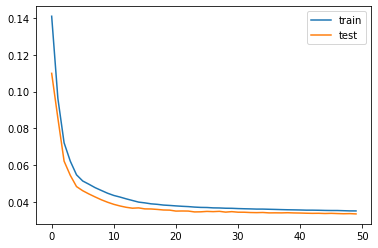

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

24/24 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_3_1 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_3_1 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_3_1, yhat_3_1))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 682.376


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station1')

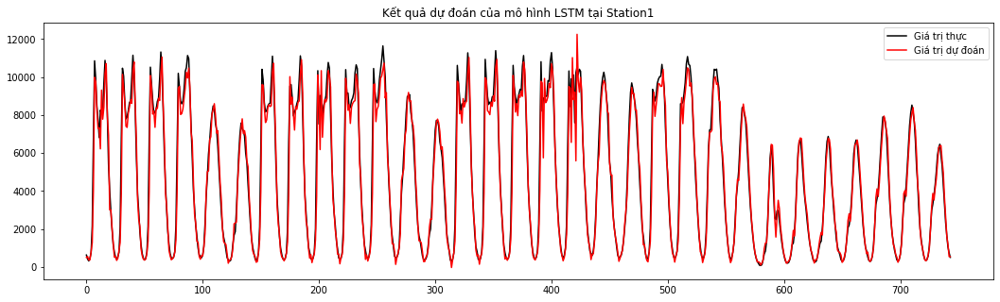

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_3_1, color = 'black')
plt.plot(yhat_3_1, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station1')

### LAG = 24

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 24
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8760, 100)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-24),var2(t-24),var3(t-24),var4(t-24),var1(t-23),var2(t-23),var3(t-23),var4(t-23),var1(t-22),var2(t-22),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.045494,0.040853,0.040131,0.027419,0.001407,0.011039,0.012899,0.015076,0.000078,0.009688,...,0.094594,0.081594,0.067068,0.053770,0.059161,0.050613,0.049089,0.039727,0.042997,0.029324
8041,0.001407,0.011039,0.012899,0.015076,0.000078,0.009688,0.012103,0.012508,0.000000,0.016597,...,0.059161,0.050613,0.049089,0.039727,0.042997,0.029324,0.032830,0.028762,0.028107,0.021703
8042,0.000078,0.009688,0.012103,0.012508,0.000000,0.016597,0.017915,0.012674,0.000000,0.037474,...,0.042997,0.029324,0.032830,0.028762,0.028107,0.021703,0.025014,0.021102,0.021021,0.016236
8043,0.000000,0.016597,0.017915,0.012674,0.000000,0.037474,0.040131,0.027502,0.000235,0.110018,...,0.028107,0.021703,0.025014,0.021102,0.021021,0.016236,0.035644,0.028913,0.027152,0.022283
8044,0.000000,0.037474,0.040131,0.027502,0.000235,0.110018,0.126762,0.102634,0.387947,0.476419,...,0.021021,0.016236,0.035644,0.028913,0.027152,0.022283,0.057297,0.043031,0.047376,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.339092,0.274106,0.308544,0.298128,0.229422,0.196681,0.223903,0.212972,0.158915,0.130670,...,0.329246,0.333416,0.261940,0.214704,0.251135,0.246604,0.183929,0.150871,0.175890,0.176690
8780,0.229422,0.196681,0.223903,0.212972,0.158915,0.130670,0.153038,0.146786,0.111858,0.091995,...,0.251135,0.246604,0.183929,0.150871,0.175890,0.176690,0.129758,0.108441,0.125965,0.120858
8781,0.158915,0.130670,0.153038,0.146786,0.111858,0.091995,0.105582,0.093191,0.078246,0.061730,...,0.175890,0.176690,0.129758,0.108441,0.125965,0.120858,0.082311,0.062857,0.073573,0.073724
8782,0.111858,0.091995,0.105582,0.093191,0.078246,0.061730,0.069034,0.063287,0.048699,0.038901,...,0.125965,0.120858,0.082311,0.062857,0.073573,0.073724,0.058157,0.039201,0.048730,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 96) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 24, 4) (8037,) (723, 24, 4) (723,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 2s - loss: 0.1384 - val_loss: 0.0794 - 2s/epoch - 19ms/step
Epoch 2/50
112/112 - 0s - loss: 0.0737 - val_loss: 0.0698 - 450ms/epoch - 4ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0659 - val_loss: 0.0609 - 460ms/epoch - 4ms/step
Epoch 4/50
112/112 - 0s - loss: 0.0578 - val_loss: 0.0494 - 445ms/epoch - 4ms/step
Epoch 5/50
112/112 - 0s - loss: 0.0467 - val_loss: 0.0410 - 439ms/epoch - 4ms/step
Epoch 6/50
112/112 - 0s - loss: 0.0410 - val_loss: 0.0412 - 425ms/epoch - 4ms/step
Epoch 7/50
112/112 - 0s - loss: 0.0393 - val_loss: 0.0372 - 473ms/epoch - 4ms/step
Epoch 8/50
112/112 - 0s - loss: 0.0383 - val_loss: 0.0381 - 452ms/epoch - 4ms/step
Epoch 9/50
112/112 - 0s - loss: 0.0371 - val_loss: 0.0369 - 452ms/epoch - 4ms/step
Epoch 10/50
112/112 - 0s - loss: 0.0360 - val_loss: 0.0351 - 423ms/epoch - 4ms/step
Epoch 11/50
112/112 - 0s - loss: 0.0350 - val_loss: 0.0341 - 444ms/epoch - 4ms/step
Epoch 12/50
112/112 - 0s - loss: 0.0344 - val_loss: 0.0335 - 423ms/epoch - 4ms/step
Epo

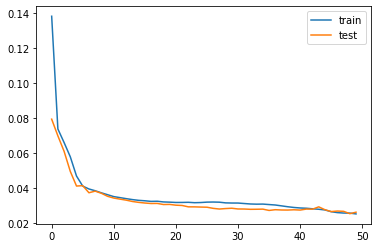

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

23/23 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_24_1 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_24_1 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_24_1, yhat_24_1))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 493.196


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station1')

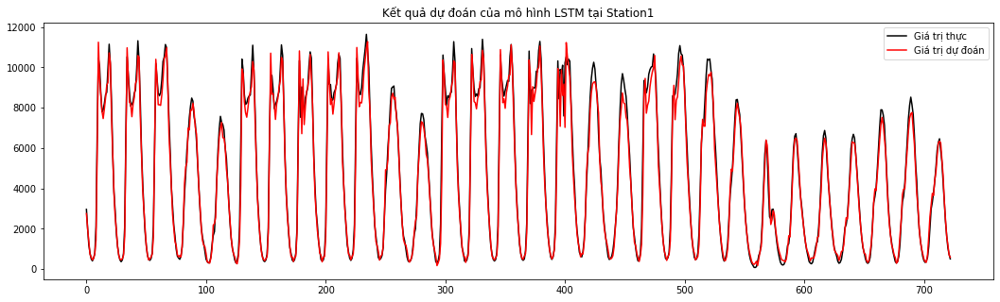

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_24_1, color = 'black')
plt.plot(yhat_24_1, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station1')

### LAG = 168

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 168
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8616, 676)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-168),var2(t-168),var3(t-168),var4(t-168),var1(t-167),var2(t-167),var3(t-167),var4(t-167),var1(t-166),var2(t-166),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.049402,0.037324,0.040847,0.026176,0.029626,0.024332,0.025480,0.018721,0.029157,0.024632,...,0.094594,0.081594,0.067068,0.053770,0.059161,0.050613,0.049089,0.039727,0.042997,0.029324
8041,0.029626,0.024332,0.025480,0.018721,0.029157,0.024632,0.021339,0.016236,0.030954,0.023956,...,0.059161,0.050613,0.049089,0.039727,0.042997,0.029324,0.032830,0.028762,0.028107,0.021703
8042,0.029157,0.024632,0.021339,0.016236,0.030954,0.023956,0.025002,0.019467,0.061127,0.047537,...,0.042997,0.029324,0.032830,0.028762,0.028107,0.021703,0.025014,0.021102,0.021021,0.016236
8043,0.030954,0.023956,0.025002,0.019467,0.061127,0.047537,0.046501,0.034211,0.155007,0.126464,...,0.028107,0.021703,0.025014,0.021102,0.021021,0.016236,0.035644,0.028913,0.027152,0.022283
8044,0.061127,0.047537,0.046501,0.034211,0.155007,0.126464,0.140696,0.107356,0.510670,0.486708,...,0.021021,0.016236,0.035644,0.028913,0.027152,0.022283,0.057297,0.043031,0.047376,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.253264,0.221087,0.252727,0.245693,0.189088,0.167918,0.185922,0.183731,0.135152,0.110018,...,0.329246,0.333416,0.261940,0.214704,0.251135,0.246604,0.183929,0.150871,0.175890,0.176690
8780,0.189088,0.167918,0.185922,0.183731,0.135152,0.110018,0.129071,0.129307,0.090909,0.072995,...,0.251135,0.246604,0.183929,0.150871,0.175890,0.176690,0.129758,0.108441,0.125965,0.120858
8781,0.135152,0.110018,0.129071,0.129307,0.090909,0.072995,0.086074,0.086481,0.057062,0.048513,...,0.175890,0.176690,0.129758,0.108441,0.125965,0.120858,0.082311,0.062857,0.073573,0.073724
8782,0.090909,0.072995,0.086074,0.086481,0.057062,0.048513,0.058683,0.056329,0.036270,0.026359,...,0.125965,0.120858,0.082311,0.062857,0.073573,0.073724,0.058157,0.039201,0.048730,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 672) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 168, 4) (8037,) (579, 168, 4) (579,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 3s - loss: 0.1241 - val_loss: 0.0740 - 3s/epoch - 24ms/step
Epoch 2/50
112/112 - 1s - loss: 0.0764 - val_loss: 0.0660 - 789ms/epoch - 7ms/step
Epoch 3/50
112/112 - 1s - loss: 0.0693 - val_loss: 0.0578 - 834ms/epoch - 7ms/step
Epoch 4/50
112/112 - 1s - loss: 0.0606 - val_loss: 0.0491 - 818ms/epoch - 7ms/step
Epoch 5/50
112/112 - 1s - loss: 0.0527 - val_loss: 0.0450 - 796ms/epoch - 7ms/step
Epoch 6/50
112/112 - 1s - loss: 0.0459 - val_loss: 0.0407 - 829ms/epoch - 7ms/step
Epoch 7/50
112/112 - 1s - loss: 0.0410 - val_loss: 0.0361 - 844ms/epoch - 8ms/step
Epoch 8/50
112/112 - 1s - loss: 0.0387 - val_loss: 0.0359 - 849ms/epoch - 8ms/step
Epoch 9/50
112/112 - 1s - loss: 0.0373 - val_loss: 0.0356 - 829ms/epoch - 7ms/step
Epoch 10/50
112/112 - 1s - loss: 0.0364 - val_loss: 0.0346 - 789ms/epoch - 7ms/step
Epoch 11/50
112/112 - 1s - loss: 0.0358 - val_loss: 0.0332 - 801ms/epoch - 7ms/step
Epoch 12/50
112/112 - 1s - loss: 0.0353 - val_loss: 0.0319 - 808ms/epoch - 7ms/step
Epo

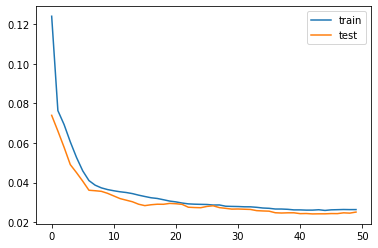

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

19/19 [==============================] - 0s 4ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_168_1 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_168_1 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_168_1, yhat_168_1))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 484.806


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station1')

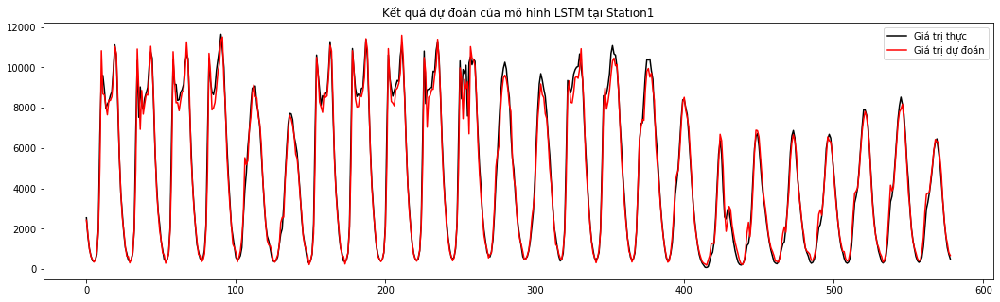

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_168_1, color = 'black')
plt.plot(yhat_168_1, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station1')

## Station 2

In [ ]:
data = pd.concat([station2_a_month_dtwbi[['Total']], station1_a_month_dtwbi[['Total']], 
                  station3_a_month_dtwbi[['Total']], station4_a_month_dtwbi[['Total']]], axis = 1)
data.columns = ['station2', 'station1', 'station3', 'station4']

In [ ]:
data.head()

,station2,station1,station3,station4
Datetime,,,,
2020-01-01 00:00:00,1059.0,1090.0,1243.0,1180.0
2020-01-01 01:00:00,1441.0,1496.0,1590.0,1392.0
2020-01-01 02:00:00,977.0,1031.0,1030.0,873.0
2020-01-01 03:00:00,780.0,844.0,701.0,558.0
2020-01-01 04:00:00,674.0,760.0,613.0,486.0


### LAG = 3

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 3
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8781, 16)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-3),var2(t-3),var3(t-3),var4(t-3),var1(t-2),var2(t-2),var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.131796,0.157195,0.152321,0.139911,0.085912,0.105526,0.094594,0.081594,0.053770,0.067068,0.059161,0.050613,0.039727,0.049089,0.042997,0.029324
8041,0.085912,0.105526,0.094594,0.081594,0.053770,0.067068,0.059161,0.050613,0.039727,0.049089,0.042997,0.029324,0.028762,0.032830,0.028107,0.021703
8042,0.053770,0.067068,0.059161,0.050613,0.039727,0.049089,0.042997,0.029324,0.028762,0.032830,0.028107,0.021703,0.021102,0.025014,0.021021,0.016236
8043,0.039727,0.049089,0.042997,0.029324,0.028762,0.032830,0.028107,0.021703,0.021102,0.025014,0.021021,0.016236,0.028913,0.035644,0.027152,0.022283
8044,0.028762,0.032830,0.028107,0.021703,0.021102,0.025014,0.021021,0.016236,0.028913,0.035644,0.027152,0.022283,0.043031,0.057297,0.047376,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.354085,0.415462,0.410064,0.393887,0.282968,0.338154,0.329246,0.333416,0.214704,0.261940,0.251135,0.246604,0.150871,0.183929,0.175890,0.176690
8780,0.282968,0.338154,0.329246,0.333416,0.214704,0.261940,0.251135,0.246604,0.150871,0.183929,0.175890,0.176690,0.108441,0.129758,0.125965,0.120858
8781,0.214704,0.261940,0.251135,0.246604,0.150871,0.183929,0.175890,0.176690,0.108441,0.129758,0.125965,0.120858,0.062857,0.082311,0.073573,0.073724
8782,0.150871,0.183929,0.175890,0.176690,0.108441,0.129758,0.125965,0.120858,0.062857,0.082311,0.073573,0.073724,0.039201,0.058157,0.048730,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 12) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 3, 4) (8037,) (744, 3, 4) (744,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 3s - loss: 0.1742 - val_loss: 0.1184 - 3s/epoch - 23ms/step
Epoch 2/50
112/112 - 0s - loss: 0.1085 - val_loss: 0.0962 - 410ms/epoch - 4ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0829 - val_loss: 0.0684 - 353ms/epoch - 3ms/step
Epoch 4/50
112/112 - 0s - loss: 0.0694 - val_loss: 0.0592 - 374ms/epoch - 3ms/step
Epoch 5/50
112/112 - 0s - loss: 0.0621 - val_loss: 0.0518 - 359ms/epoch - 3ms/step
Epoch 6/50
112/112 - 0s - loss: 0.0563 - val_loss: 0.0476 - 367ms/epoch - 3ms/step
Epoch 7/50
112/112 - 0s - loss: 0.0528 - val_loss: 0.0457 - 355ms/epoch - 3ms/step
Epoch 8/50
112/112 - 0s - loss: 0.0509 - val_loss: 0.0449 - 353ms/epoch - 3ms/step
Epoch 9/50
112/112 - 0s - loss: 0.0495 - val_loss: 0.0440 - 369ms/epoch - 3ms/step
Epoch 10/50
112/112 - 0s - loss: 0.0483 - val_loss: 0.0430 - 354ms/epoch - 3ms/step
Epoch 11/50
112/112 - 0s - loss: 0.0470 - val_loss: 0.0421 - 364ms/epoch - 3ms/step
Epoch 12/50
112/112 - 0s - loss: 0.0459 - val_loss: 0.0413 - 355ms/epoch - 3ms/step
Epo

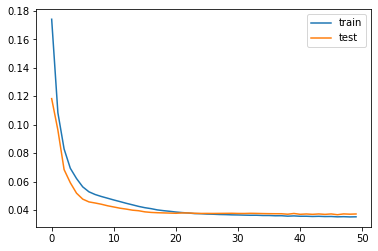

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

24/24 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_3_2 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_3_2 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_3_2, yhat_3_2))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 799.849


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station2')

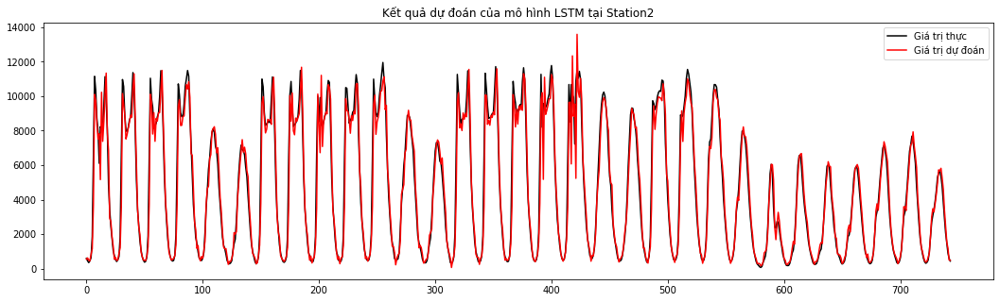

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_3_2, color = 'black')
plt.plot(yhat_3_2, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station2')

### LAG = 24

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 24
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8760, 100)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-24),var2(t-24),var3(t-24),var4(t-24),var1(t-23),var2(t-23),var3(t-23),var4(t-23),var1(t-22),var2(t-22),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.040853,0.045494,0.040131,0.027419,0.011039,0.001407,0.012899,0.015076,0.009688,0.000078,...,0.094594,0.081594,0.053770,0.067068,0.059161,0.050613,0.039727,0.049089,0.042997,0.029324
8041,0.011039,0.001407,0.012899,0.015076,0.009688,0.000078,0.012103,0.012508,0.016597,0.000000,...,0.059161,0.050613,0.039727,0.049089,0.042997,0.029324,0.028762,0.032830,0.028107,0.021703
8042,0.009688,0.000078,0.012103,0.012508,0.016597,0.000000,0.017915,0.012674,0.037474,0.000000,...,0.042997,0.029324,0.028762,0.032830,0.028107,0.021703,0.021102,0.025014,0.021021,0.016236
8043,0.016597,0.000000,0.017915,0.012674,0.037474,0.000000,0.040131,0.027502,0.110018,0.000235,...,0.028107,0.021703,0.021102,0.025014,0.021021,0.016236,0.028913,0.035644,0.027152,0.022283
8044,0.037474,0.000000,0.040131,0.027502,0.110018,0.000235,0.126762,0.102634,0.476419,0.387947,...,0.021021,0.016236,0.028913,0.035644,0.027152,0.022283,0.043031,0.057297,0.047376,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.274106,0.339092,0.308544,0.298128,0.196681,0.229422,0.223903,0.212972,0.130670,0.158915,...,0.329246,0.333416,0.214704,0.261940,0.251135,0.246604,0.150871,0.183929,0.175890,0.176690
8780,0.196681,0.229422,0.223903,0.212972,0.130670,0.158915,0.153038,0.146786,0.091995,0.111858,...,0.251135,0.246604,0.150871,0.183929,0.175890,0.176690,0.108441,0.129758,0.125965,0.120858
8781,0.130670,0.158915,0.153038,0.146786,0.091995,0.111858,0.105582,0.093191,0.061730,0.078246,...,0.175890,0.176690,0.108441,0.129758,0.125965,0.120858,0.062857,0.082311,0.073573,0.073724
8782,0.091995,0.111858,0.105582,0.093191,0.061730,0.078246,0.069034,0.063287,0.038901,0.048699,...,0.125965,0.120858,0.062857,0.082311,0.073573,0.073724,0.039201,0.058157,0.048730,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 96) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 24, 4) (8037,) (723, 24, 4) (723,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 2s - loss: 0.1246 - val_loss: 0.0805 - 2s/epoch - 20ms/step
Epoch 2/50
112/112 - 0s - loss: 0.0884 - val_loss: 0.0709 - 473ms/epoch - 4ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0821 - val_loss: 0.0636 - 423ms/epoch - 4ms/step
Epoch 4/50
112/112 - 1s - loss: 0.0734 - val_loss: 0.0583 - 765ms/epoch - 7ms/step
Epoch 5/50
112/112 - 1s - loss: 0.0655 - val_loss: 0.0541 - 827ms/epoch - 7ms/step
Epoch 6/50
112/112 - 0s - loss: 0.0577 - val_loss: 0.0455 - 461ms/epoch - 4ms/step
Epoch 7/50
112/112 - 0s - loss: 0.0499 - val_loss: 0.0415 - 467ms/epoch - 4ms/step
Epoch 8/50
112/112 - 0s - loss: 0.0459 - val_loss: 0.0378 - 422ms/epoch - 4ms/step
Epoch 9/50
112/112 - 0s - loss: 0.0422 - val_loss: 0.0362 - 414ms/epoch - 4ms/step
Epoch 10/50
112/112 - 0s - loss: 0.0402 - val_loss: 0.0352 - 429ms/epoch - 4ms/step
Epoch 11/50
112/112 - 0s - loss: 0.0385 - val_loss: 0.0334 - 447ms/epoch - 4ms/step
Epoch 12/50
112/112 - 0s - loss: 0.0371 - val_loss: 0.0328 - 425ms/epoch - 4ms/step
Epo

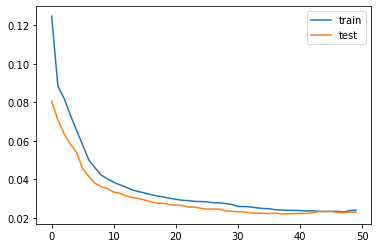

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

23/23 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_24_2 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_24_2 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_24_2, yhat_24_2))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 507.307


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station2')

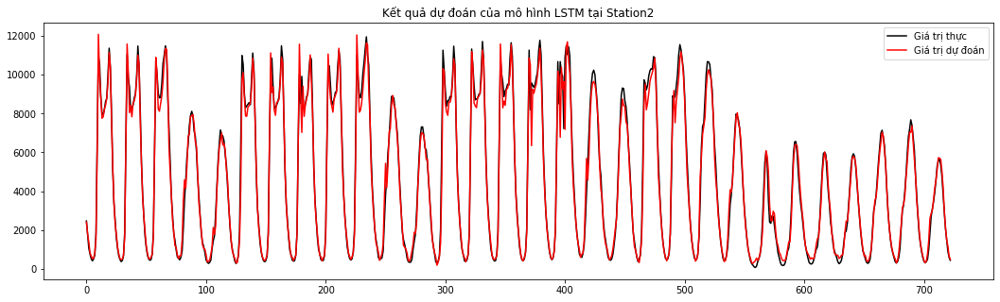

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_24_2, color = 'black')
plt.plot(yhat_24_2, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station2')

### LAG = 168

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 168
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8616, 676)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-168),var2(t-168),var3(t-168),var4(t-168),var1(t-167),var2(t-167),var3(t-167),var4(t-167),var1(t-166),var2(t-166),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.037324,0.049402,0.040847,0.026176,0.024332,0.029626,0.025480,0.018721,0.024632,0.029157,...,0.094594,0.081594,0.053770,0.067068,0.059161,0.050613,0.039727,0.049089,0.042997,0.029324
8041,0.024332,0.029626,0.025480,0.018721,0.024632,0.029157,0.021339,0.016236,0.023956,0.030954,...,0.059161,0.050613,0.039727,0.049089,0.042997,0.029324,0.028762,0.032830,0.028107,0.021703
8042,0.024632,0.029157,0.021339,0.016236,0.023956,0.030954,0.025002,0.019467,0.047537,0.061127,...,0.042997,0.029324,0.028762,0.032830,0.028107,0.021703,0.021102,0.025014,0.021021,0.016236
8043,0.023956,0.030954,0.025002,0.019467,0.047537,0.061127,0.046501,0.034211,0.126464,0.155007,...,0.028107,0.021703,0.021102,0.025014,0.021021,0.016236,0.028913,0.035644,0.027152,0.022283
8044,0.047537,0.061127,0.046501,0.034211,0.126464,0.155007,0.140696,0.107356,0.486708,0.510670,...,0.021021,0.016236,0.028913,0.035644,0.027152,0.022283,0.043031,0.057297,0.047376,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.221087,0.253264,0.252727,0.245693,0.167918,0.189088,0.185922,0.183731,0.110018,0.135152,...,0.329246,0.333416,0.214704,0.261940,0.251135,0.246604,0.150871,0.183929,0.175890,0.176690
8780,0.167918,0.189088,0.185922,0.183731,0.110018,0.135152,0.129071,0.129307,0.072995,0.090909,...,0.251135,0.246604,0.150871,0.183929,0.175890,0.176690,0.108441,0.129758,0.125965,0.120858
8781,0.110018,0.135152,0.129071,0.129307,0.072995,0.090909,0.086074,0.086481,0.048513,0.057062,...,0.175890,0.176690,0.108441,0.129758,0.125965,0.120858,0.062857,0.082311,0.073573,0.073724
8782,0.072995,0.090909,0.086074,0.086481,0.048513,0.057062,0.058683,0.056329,0.026359,0.036270,...,0.125965,0.120858,0.062857,0.082311,0.073573,0.073724,0.039201,0.058157,0.048730,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 672) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 168, 4) (8037,) (579, 168, 4) (579,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 3s - loss: 0.1453 - val_loss: 0.0803 - 3s/epoch - 24ms/step
Epoch 2/50
112/112 - 1s - loss: 0.0899 - val_loss: 0.0653 - 802ms/epoch - 7ms/step
Epoch 3/50
112/112 - 1s - loss: 0.0800 - val_loss: 0.0589 - 796ms/epoch - 7ms/step
Epoch 4/50
112/112 - 1s - loss: 0.0717 - val_loss: 0.0546 - 853ms/epoch - 8ms/step
Epoch 5/50
112/112 - 1s - loss: 0.0650 - val_loss: 0.0510 - 802ms/epoch - 7ms/step
Epoch 6/50
112/112 - 1s - loss: 0.0582 - val_loss: 0.0458 - 829ms/epoch - 7ms/step
Epoch 7/50
112/112 - 1s - loss: 0.0519 - val_loss: 0.0410 - 835ms/epoch - 7ms/step
Epoch 8/50
112/112 - 1s - loss: 0.0472 - val_loss: 0.0380 - 802ms/epoch - 7ms/step
Epoch 9/50
112/112 - 1s - loss: 0.0430 - val_loss: 0.0364 - 801ms/epoch - 7ms/step
Epoch 10/50
112/112 - 1s - loss: 0.0406 - val_loss: 0.0359 - 807ms/epoch - 7ms/step
Epoch 11/50
112/112 - 1s - loss: 0.0389 - val_loss: 0.0352 - 797ms/epoch - 7ms/step
Epoch 12/50
112/112 - 1s - loss: 0.0377 - val_loss: 0.0343 - 817ms/epoch - 7ms/step
Epo

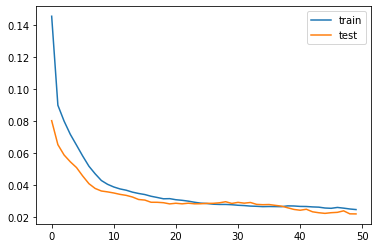

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

19/19 [==============================] - 0s 4ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_168_2 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_168_2 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_168_2, yhat_168_2))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 486.505


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station2')

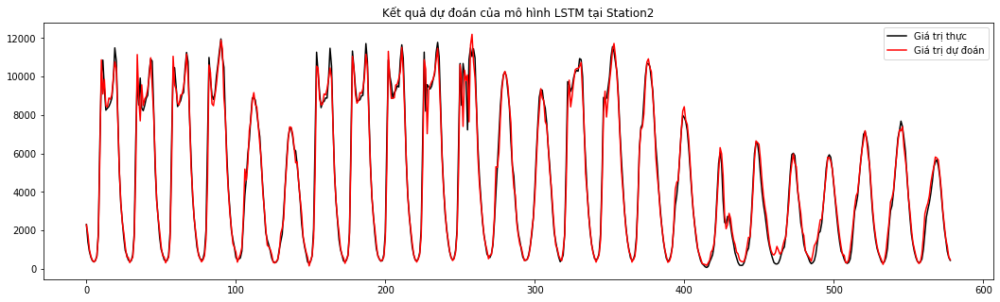

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_168_2, color = 'black')
plt.plot(yhat_168_2, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station2')

## Station 3

In [ ]:
data = pd.concat([station3_a_month_dtwbi[['Total']], station1_a_month_dtwbi[['Total']], 
                  station2_a_month_dtwbi[['Total']], station4_a_month_dtwbi[['Total']]], axis = 1)
data.columns = ['station3', 'station1', 'station2', 'station4']

In [ ]:
data.head()

,station3,station1,station2,station4
Datetime,,,,
2020-01-01 00:00:00,1243.0,1090.0,1059.0,1180.0
2020-01-01 01:00:00,1590.0,1496.0,1441.0,1392.0
2020-01-01 02:00:00,1030.0,1031.0,977.0,873.0
2020-01-01 03:00:00,701.0,844.0,780.0,558.0
2020-01-01 04:00:00,613.0,760.0,674.0,486.0


### LAG = 3

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 3
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8781, 16)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-3),var2(t-3),var3(t-3),var4(t-3),var1(t-2),var2(t-2),var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.152321,0.157195,0.131796,0.139911,0.094594,0.105526,0.085912,0.081594,0.059161,0.067068,0.053770,0.050613,0.042997,0.049089,0.039727,0.029324
8041,0.094594,0.105526,0.085912,0.081594,0.059161,0.067068,0.053770,0.050613,0.042997,0.049089,0.039727,0.029324,0.028107,0.032830,0.028762,0.021703
8042,0.059161,0.067068,0.053770,0.050613,0.042997,0.049089,0.039727,0.029324,0.028107,0.032830,0.028762,0.021703,0.021021,0.025014,0.021102,0.016236
8043,0.042997,0.049089,0.039727,0.029324,0.028107,0.032830,0.028762,0.021703,0.021021,0.025014,0.021102,0.016236,0.027152,0.035644,0.028913,0.022283
8044,0.028107,0.032830,0.028762,0.021703,0.021021,0.025014,0.021102,0.016236,0.027152,0.035644,0.028913,0.022283,0.047376,0.057297,0.043031,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.410064,0.415462,0.354085,0.393887,0.329246,0.338154,0.282968,0.333416,0.251135,0.261940,0.214704,0.246604,0.175890,0.183929,0.150871,0.176690
8780,0.329246,0.338154,0.282968,0.333416,0.251135,0.261940,0.214704,0.246604,0.175890,0.183929,0.150871,0.176690,0.125965,0.129758,0.108441,0.120858
8781,0.251135,0.261940,0.214704,0.246604,0.175890,0.183929,0.150871,0.176690,0.125965,0.129758,0.108441,0.120858,0.073573,0.082311,0.062857,0.073724
8782,0.175890,0.183929,0.150871,0.176690,0.125965,0.129758,0.108441,0.120858,0.073573,0.082311,0.062857,0.073724,0.048730,0.058157,0.039201,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 12) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 3, 4) (8037,) (744, 3, 4) (744,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 2s - loss: 0.1669 - val_loss: 0.1215 - 2s/epoch - 19ms/step
Epoch 2/50
112/112 - 0s - loss: 0.1029 - val_loss: 0.0895 - 360ms/epoch - 3ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0741 - val_loss: 0.0642 - 381ms/epoch - 3ms/step
Epoch 4/50
112/112 - 0s - loss: 0.0647 - val_loss: 0.0585 - 349ms/epoch - 3ms/step
Epoch 5/50
112/112 - 0s - loss: 0.0581 - val_loss: 0.0534 - 394ms/epoch - 4ms/step
Epoch 6/50
112/112 - 0s - loss: 0.0524 - val_loss: 0.0520 - 374ms/epoch - 3ms/step
Epoch 7/50
112/112 - 0s - loss: 0.0507 - val_loss: 0.0502 - 346ms/epoch - 3ms/step
Epoch 8/50
112/112 - 0s - loss: 0.0491 - val_loss: 0.0504 - 374ms/epoch - 3ms/step
Epoch 9/50
112/112 - 0s - loss: 0.0477 - val_loss: 0.0490 - 350ms/epoch - 3ms/step
Epoch 10/50
112/112 - 0s - loss: 0.0462 - val_loss: 0.0474 - 390ms/epoch - 3ms/step
Epoch 11/50
112/112 - 0s - loss: 0.0450 - val_loss: 0.0466 - 358ms/epoch - 3ms/step
Epoch 12/50
112/112 - 0s - loss: 0.0439 - val_loss: 0.0465 - 346ms/epoch - 3ms/step
Epo

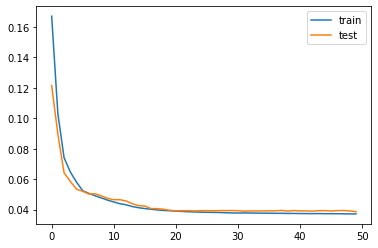

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

24/24 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_3_3 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_3_3 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_3_3, yhat_3_3))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 780.319


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station3')

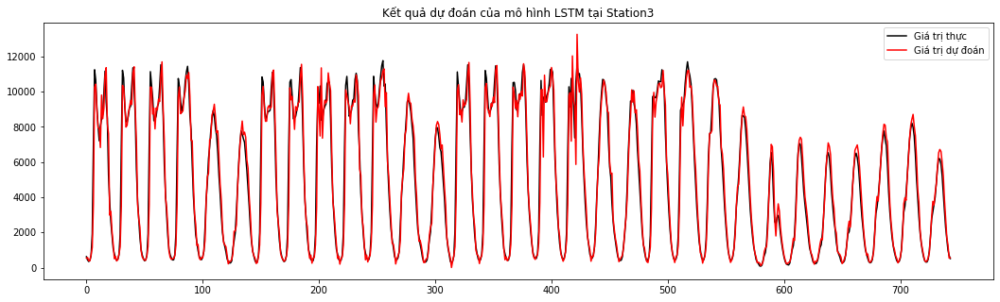

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_3_3, color = 'black')
plt.plot(yhat_3_3, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station3')

### LAG = 24

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 24
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8760, 100)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-24),var2(t-24),var3(t-24),var4(t-24),var1(t-23),var2(t-23),var3(t-23),var4(t-23),var1(t-22),var2(t-22),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.040131,0.045494,0.040853,0.027419,0.012899,0.001407,0.011039,0.015076,0.012103,0.000078,...,0.085912,0.081594,0.059161,0.067068,0.053770,0.050613,0.042997,0.049089,0.039727,0.029324
8041,0.012899,0.001407,0.011039,0.015076,0.012103,0.000078,0.009688,0.012508,0.017915,0.000000,...,0.053770,0.050613,0.042997,0.049089,0.039727,0.029324,0.028107,0.032830,0.028762,0.021703
8042,0.012103,0.000078,0.009688,0.012508,0.017915,0.000000,0.016597,0.012674,0.040131,0.000000,...,0.039727,0.029324,0.028107,0.032830,0.028762,0.021703,0.021021,0.025014,0.021102,0.016236
8043,0.017915,0.000000,0.016597,0.012674,0.040131,0.000000,0.037474,0.027502,0.126762,0.000235,...,0.028762,0.021703,0.021021,0.025014,0.021102,0.016236,0.027152,0.035644,0.028913,0.022283
8044,0.040131,0.000000,0.037474,0.027502,0.126762,0.000235,0.110018,0.102634,0.542798,0.387947,...,0.021102,0.016236,0.027152,0.035644,0.028913,0.022283,0.047376,0.057297,0.043031,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.308544,0.339092,0.274106,0.298128,0.223903,0.229422,0.196681,0.212972,0.153038,0.158915,...,0.282968,0.333416,0.251135,0.261940,0.214704,0.246604,0.175890,0.183929,0.150871,0.176690
8780,0.223903,0.229422,0.196681,0.212972,0.153038,0.158915,0.130670,0.146786,0.105582,0.111858,...,0.214704,0.246604,0.175890,0.183929,0.150871,0.176690,0.125965,0.129758,0.108441,0.120858
8781,0.153038,0.158915,0.130670,0.146786,0.105582,0.111858,0.091995,0.093191,0.069034,0.078246,...,0.150871,0.176690,0.125965,0.129758,0.108441,0.120858,0.073573,0.082311,0.062857,0.073724
8782,0.105582,0.111858,0.091995,0.093191,0.069034,0.078246,0.061730,0.063287,0.042440,0.048699,...,0.108441,0.120858,0.073573,0.082311,0.062857,0.073724,0.048730,0.058157,0.039201,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 96) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 24, 4) (8037,) (723, 24, 4) (723,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 3s - loss: 0.1152 - val_loss: 0.0781 - 3s/epoch - 24ms/step
Epoch 2/50
112/112 - 0s - loss: 0.0760 - val_loss: 0.0655 - 420ms/epoch - 4ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0652 - val_loss: 0.0551 - 468ms/epoch - 4ms/step
Epoch 4/50
112/112 - 0s - loss: 0.0514 - val_loss: 0.0420 - 415ms/epoch - 4ms/step
Epoch 5/50
112/112 - 0s - loss: 0.0450 - val_loss: 0.0380 - 477ms/epoch - 4ms/step
Epoch 6/50
112/112 - 1s - loss: 0.0408 - val_loss: 0.0391 - 590ms/epoch - 5ms/step
Epoch 7/50
112/112 - 1s - loss: 0.0387 - val_loss: 0.0393 - 676ms/epoch - 6ms/step
Epoch 8/50
112/112 - 1s - loss: 0.0376 - val_loss: 0.0396 - 643ms/epoch - 6ms/step
Epoch 9/50
112/112 - 1s - loss: 0.0369 - val_loss: 0.0403 - 781ms/epoch - 7ms/step
Epoch 10/50
112/112 - 1s - loss: 0.0362 - val_loss: 0.0395 - 758ms/epoch - 7ms/step
Epoch 11/50
112/112 - 1s - loss: 0.0356 - val_loss: 0.0393 - 738ms/epoch - 7ms/step
Epoch 12/50
112/112 - 1s - loss: 0.0352 - val_loss: 0.0384 - 751ms/epoch - 7ms/step
Epo

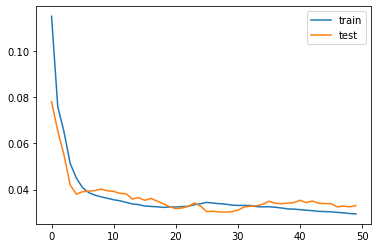

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

23/23 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_24_3 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_24_3 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_24_3, yhat_24_3))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 678.305


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station3')

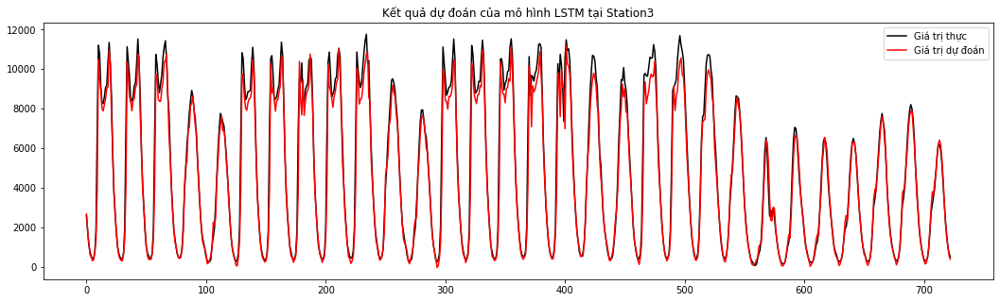

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_24_3, color = 'black')
plt.plot(yhat_24_3, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station3')

### LAG = 168

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 168
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8616, 676)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-168),var2(t-168),var3(t-168),var4(t-168),var1(t-167),var2(t-167),var3(t-167),var4(t-167),var1(t-166),var2(t-166),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.040847,0.049402,0.037324,0.026176,0.025480,0.029626,0.024332,0.018721,0.021339,0.029157,...,0.085912,0.081594,0.059161,0.067068,0.053770,0.050613,0.042997,0.049089,0.039727,0.029324
8041,0.025480,0.029626,0.024332,0.018721,0.021339,0.029157,0.024632,0.016236,0.025002,0.030954,...,0.053770,0.050613,0.042997,0.049089,0.039727,0.029324,0.028107,0.032830,0.028762,0.021703
8042,0.021339,0.029157,0.024632,0.016236,0.025002,0.030954,0.023956,0.019467,0.046501,0.061127,...,0.039727,0.029324,0.028107,0.032830,0.028762,0.021703,0.021021,0.025014,0.021102,0.016236
8043,0.025002,0.030954,0.023956,0.019467,0.046501,0.061127,0.047537,0.034211,0.140696,0.155007,...,0.028762,0.021703,0.021021,0.025014,0.021102,0.016236,0.027152,0.035644,0.028913,0.022283
8044,0.046501,0.061127,0.047537,0.034211,0.140696,0.155007,0.126464,0.107356,0.542002,0.510670,...,0.021102,0.016236,0.027152,0.035644,0.028913,0.022283,0.047376,0.057297,0.043031,0.034294
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.252727,0.253264,0.221087,0.245693,0.185922,0.189088,0.167918,0.183731,0.129071,0.135152,...,0.282968,0.333416,0.251135,0.261940,0.214704,0.246604,0.175890,0.183929,0.150871,0.176690
8780,0.185922,0.189088,0.167918,0.183731,0.129071,0.135152,0.110018,0.129307,0.086074,0.090909,...,0.214704,0.246604,0.175890,0.183929,0.150871,0.176690,0.125965,0.129758,0.108441,0.120858
8781,0.129071,0.135152,0.110018,0.129307,0.086074,0.090909,0.072995,0.086481,0.058683,0.057062,...,0.150871,0.176690,0.125965,0.129758,0.108441,0.120858,0.073573,0.082311,0.062857,0.073724
8782,0.086074,0.090909,0.072995,0.086481,0.058683,0.057062,0.048513,0.056329,0.029779,0.036270,...,0.108441,0.120858,0.073573,0.082311,0.062857,0.073724,0.048730,0.058157,0.039201,0.049867


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 672) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 168, 4) (8037,) (579, 168, 4) (579,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 3s - loss: 0.1532 - val_loss: 0.0797 - 3s/epoch - 24ms/step
Epoch 2/50
112/112 - 1s - loss: 0.0786 - val_loss: 0.0684 - 839ms/epoch - 7ms/step
Epoch 3/50
112/112 - 1s - loss: 0.0689 - val_loss: 0.0613 - 827ms/epoch - 7ms/step
Epoch 4/50
112/112 - 1s - loss: 0.0583 - val_loss: 0.0463 - 819ms/epoch - 7ms/step
Epoch 5/50
112/112 - 1s - loss: 0.0492 - val_loss: 0.0416 - 820ms/epoch - 7ms/step
Epoch 6/50
112/112 - 1s - loss: 0.0442 - val_loss: 0.0404 - 806ms/epoch - 7ms/step
Epoch 7/50
112/112 - 1s - loss: 0.0408 - val_loss: 0.0391 - 805ms/epoch - 7ms/step
Epoch 8/50
112/112 - 1s - loss: 0.0383 - val_loss: 0.0373 - 815ms/epoch - 7ms/step
Epoch 9/50
112/112 - 1s - loss: 0.0369 - val_loss: 0.0356 - 802ms/epoch - 7ms/step
Epoch 10/50
112/112 - 1s - loss: 0.0362 - val_loss: 0.0349 - 837ms/epoch - 7ms/step
Epoch 11/50
112/112 - 1s - loss: 0.0357 - val_loss: 0.0340 - 840ms/epoch - 7ms/step
Epoch 12/50
112/112 - 1s - loss: 0.0352 - val_loss: 0.0330 - 825ms/epoch - 7ms/step
Epo

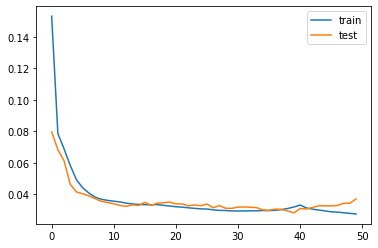

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

19/19 [==============================] - 0s 4ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_168_3 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_168_3 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_168_3, yhat_168_3))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 660.120


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station3')

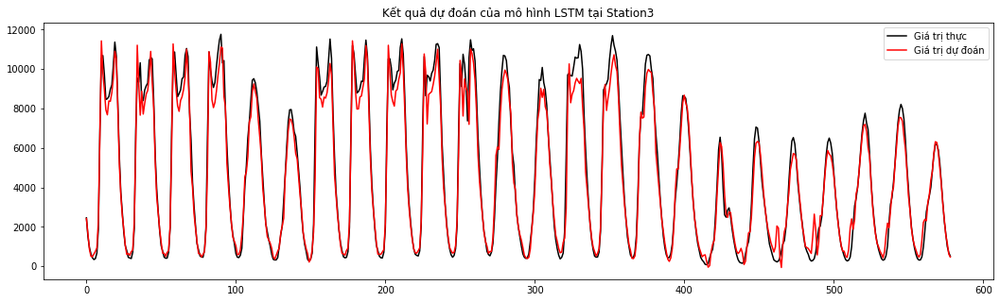

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_168_3, color = 'black')
plt.plot(yhat_168_3, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station3')

## Station 4

In [ ]:
data = pd.concat([station4_a_month_dtwbi[['Total']], station1_a_month_dtwbi[['Total']], 
                  station2_a_month_dtwbi[['Total']], station3_a_month_dtwbi[['Total']]], axis = 1)
data.columns = ['station4', 'station1', 'station2', 'station3']

In [ ]:
data.head()

,station4,station1,station2,station3
Datetime,,,,
2020-01-01 00:00:00,1180.0,1090.0,1059.0,1243.0
2020-01-01 01:00:00,1392.0,1496.0,1441.0,1590.0
2020-01-01 02:00:00,873.0,1031.0,977.0,1030.0
2020-01-01 03:00:00,558.0,844.0,780.0,701.0
2020-01-01 04:00:00,486.0,760.0,674.0,613.0


### LAG = 3

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 3
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8781, 16)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-3),var2(t-3),var3(t-3),var4(t-3),var1(t-2),var2(t-2),var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.139911,0.157195,0.131796,0.152321,0.081594,0.105526,0.085912,0.094594,0.050613,0.067068,0.053770,0.059161,0.029324,0.049089,0.039727,0.042997
8041,0.081594,0.105526,0.085912,0.094594,0.050613,0.067068,0.053770,0.059161,0.029324,0.049089,0.039727,0.042997,0.021703,0.032830,0.028762,0.028107
8042,0.050613,0.067068,0.053770,0.059161,0.029324,0.049089,0.039727,0.042997,0.021703,0.032830,0.028762,0.028107,0.016236,0.025014,0.021102,0.021021
8043,0.029324,0.049089,0.039727,0.042997,0.021703,0.032830,0.028762,0.028107,0.016236,0.025014,0.021102,0.021021,0.022283,0.035644,0.028913,0.027152
8044,0.021703,0.032830,0.028762,0.028107,0.016236,0.025014,0.021102,0.021021,0.022283,0.035644,0.028913,0.027152,0.034294,0.057297,0.043031,0.047376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.393887,0.415462,0.354085,0.410064,0.333416,0.338154,0.282968,0.329246,0.246604,0.261940,0.214704,0.251135,0.176690,0.183929,0.150871,0.175890
8780,0.333416,0.338154,0.282968,0.329246,0.246604,0.261940,0.214704,0.251135,0.176690,0.183929,0.150871,0.175890,0.120858,0.129758,0.108441,0.125965
8781,0.246604,0.261940,0.214704,0.251135,0.176690,0.183929,0.150871,0.175890,0.120858,0.129758,0.108441,0.125965,0.073724,0.082311,0.062857,0.073573
8782,0.176690,0.183929,0.150871,0.175890,0.120858,0.129758,0.108441,0.125965,0.073724,0.082311,0.062857,0.073573,0.049867,0.058157,0.039201,0.048730


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 12) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 3, 4) (8037,) (744, 3, 4) (744,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 2s - loss: 0.1493 - val_loss: 0.1152 - 2s/epoch - 19ms/step
Epoch 2/50
112/112 - 0s - loss: 0.1040 - val_loss: 0.0785 - 367ms/epoch - 3ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0725 - val_loss: 0.0609 - 361ms/epoch - 3ms/step
Epoch 4/50
112/112 - 0s - loss: 0.0662 - val_loss: 0.0569 - 358ms/epoch - 3ms/step
Epoch 5/50
112/112 - 0s - loss: 0.0617 - val_loss: 0.0519 - 355ms/epoch - 3ms/step
Epoch 6/50
112/112 - 0s - loss: 0.0563 - val_loss: 0.0483 - 351ms/epoch - 3ms/step
Epoch 7/50
112/112 - 0s - loss: 0.0540 - val_loss: 0.0517 - 375ms/epoch - 3ms/step
Epoch 8/50
112/112 - 0s - loss: 0.0524 - val_loss: 0.0467 - 364ms/epoch - 3ms/step
Epoch 9/50
112/112 - 0s - loss: 0.0503 - val_loss: 0.0439 - 368ms/epoch - 3ms/step
Epoch 10/50
112/112 - 0s - loss: 0.0486 - val_loss: 0.0420 - 360ms/epoch - 3ms/step
Epoch 11/50
112/112 - 0s - loss: 0.0473 - val_loss: 0.0411 - 384ms/epoch - 3ms/step
Epoch 12/50
112/112 - 0s - loss: 0.0457 - val_loss: 0.0396 - 360ms/epoch - 3ms/step
Epo

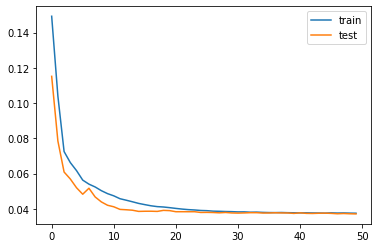

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

24/24 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_3_4 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_3_4 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_3_4, yhat_3_4))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 706.456


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station4')

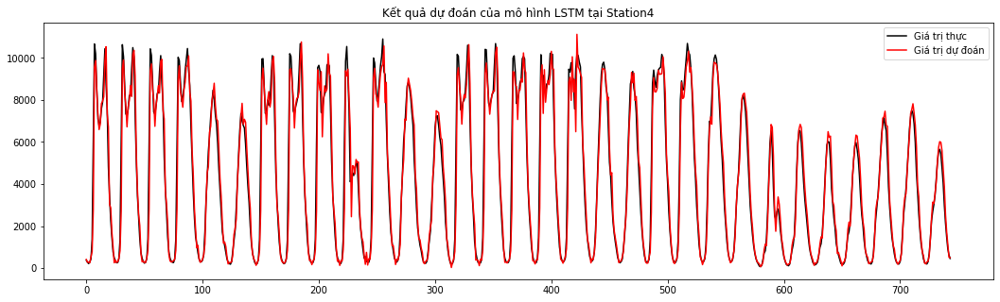

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_3_4, color = 'black')
plt.plot(yhat_3_4, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station4')

### LAG = 24

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 24
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8760, 100)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-24),var2(t-24),var3(t-24),var4(t-24),var1(t-23),var2(t-23),var3(t-23),var4(t-23),var1(t-22),var2(t-22),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.027419,0.045494,0.040853,0.040131,0.015076,0.001407,0.011039,0.012899,0.012508,0.000078,...,0.085912,0.094594,0.050613,0.067068,0.053770,0.059161,0.029324,0.049089,0.039727,0.042997
8041,0.015076,0.001407,0.011039,0.012899,0.012508,0.000078,0.009688,0.012103,0.012674,0.000000,...,0.053770,0.059161,0.029324,0.049089,0.039727,0.042997,0.021703,0.032830,0.028762,0.028107
8042,0.012508,0.000078,0.009688,0.012103,0.012674,0.000000,0.016597,0.017915,0.027502,0.000000,...,0.039727,0.042997,0.021703,0.032830,0.028762,0.028107,0.016236,0.025014,0.021102,0.021021
8043,0.012674,0.000000,0.016597,0.017915,0.027502,0.000000,0.037474,0.040131,0.102634,0.000235,...,0.028762,0.028107,0.016236,0.025014,0.021102,0.021021,0.022283,0.035644,0.028913,0.027152
8044,0.027502,0.000000,0.037474,0.040131,0.102634,0.000235,0.110018,0.126762,0.481942,0.387947,...,0.021102,0.021021,0.022283,0.035644,0.028913,0.027152,0.034294,0.057297,0.043031,0.047376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.298128,0.339092,0.274106,0.308544,0.212972,0.229422,0.196681,0.223903,0.146786,0.158915,...,0.282968,0.329246,0.246604,0.261940,0.214704,0.251135,0.176690,0.183929,0.150871,0.175890
8780,0.212972,0.229422,0.196681,0.223903,0.146786,0.158915,0.130670,0.153038,0.093191,0.111858,...,0.214704,0.251135,0.176690,0.183929,0.150871,0.175890,0.120858,0.129758,0.108441,0.125965
8781,0.146786,0.158915,0.130670,0.153038,0.093191,0.111858,0.091995,0.105582,0.063287,0.078246,...,0.150871,0.175890,0.120858,0.129758,0.108441,0.125965,0.073724,0.082311,0.062857,0.073573
8782,0.093191,0.111858,0.091995,0.105582,0.063287,0.078246,0.061730,0.069034,0.035620,0.048699,...,0.108441,0.125965,0.073724,0.082311,0.062857,0.073573,0.049867,0.058157,0.039201,0.048730


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 96) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 24, 4) (8037,) (723, 24, 4) (723,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 2s - loss: 0.1289 - val_loss: 0.0902 - 2s/epoch - 19ms/step
Epoch 2/50
112/112 - 0s - loss: 0.0870 - val_loss: 0.0673 - 451ms/epoch - 4ms/step
Epoch 3/50
112/112 - 0s - loss: 0.0750 - val_loss: 0.0638 - 428ms/epoch - 4ms/step
Epoch 4/50
112/112 - 0s - loss: 0.0649 - val_loss: 0.0598 - 421ms/epoch - 4ms/step
Epoch 5/50
112/112 - 0s - loss: 0.0546 - val_loss: 0.0468 - 447ms/epoch - 4ms/step
Epoch 6/50
112/112 - 0s - loss: 0.0492 - val_loss: 0.0422 - 448ms/epoch - 4ms/step
Epoch 7/50
112/112 - 0s - loss: 0.0472 - val_loss: 0.0437 - 433ms/epoch - 4ms/step
Epoch 8/50
112/112 - 0s - loss: 0.0443 - val_loss: 0.0411 - 416ms/epoch - 4ms/step
Epoch 9/50
112/112 - 0s - loss: 0.0409 - val_loss: 0.0378 - 417ms/epoch - 4ms/step
Epoch 10/50
112/112 - 0s - loss: 0.0393 - val_loss: 0.0380 - 440ms/epoch - 4ms/step
Epoch 11/50
112/112 - 0s - loss: 0.0380 - val_loss: 0.0372 - 454ms/epoch - 4ms/step
Epoch 12/50
112/112 - 0s - loss: 0.0370 - val_loss: 0.0354 - 464ms/epoch - 4ms/step
Epo

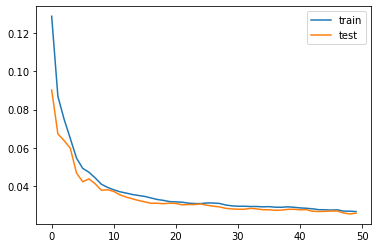

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

23/23 [==============================] - 0s 2ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_24_4 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_24_4 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_24_4, yhat_24_4))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 518.840


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station4')

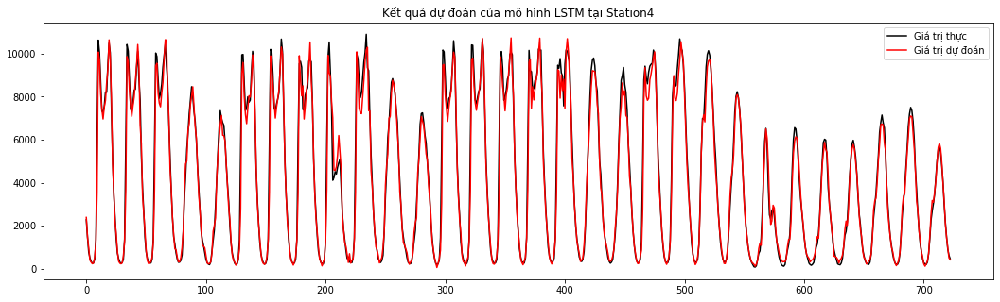

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_24_4, color = 'black')
plt.plot(yhat_24_4, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station4')

### LAG = 168

In [ ]:
values = data.values

In [ ]:
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
# specify the number of lag hours
n_hours = 168
n_features = data.shape[1]
# frame as supervised learning
reframed = series_to_supervised(scaled, n_hours, 1)
print(reframed.shape)

(8616, 676)


In [ ]:
reframed.iloc[-31*24:, :]

,var1(t-168),var2(t-168),var3(t-168),var4(t-168),var1(t-167),var2(t-167),var3(t-167),var4(t-167),var1(t-166),var2(t-166),...,var3(t-2),var4(t-2),var1(t-1),var2(t-1),var3(t-1),var4(t-1),var1(t),var2(t),var3(t),var4(t)
8040,0.026176,0.049402,0.037324,0.040847,0.018721,0.029626,0.024332,0.025480,0.016236,0.029157,...,0.085912,0.094594,0.050613,0.067068,0.053770,0.059161,0.029324,0.049089,0.039727,0.042997
8041,0.018721,0.029626,0.024332,0.025480,0.016236,0.029157,0.024632,0.021339,0.019467,0.030954,...,0.053770,0.059161,0.029324,0.049089,0.039727,0.042997,0.021703,0.032830,0.028762,0.028107
8042,0.016236,0.029157,0.024632,0.021339,0.019467,0.030954,0.023956,0.025002,0.034211,0.061127,...,0.039727,0.042997,0.021703,0.032830,0.028762,0.028107,0.016236,0.025014,0.021102,0.021021
8043,0.019467,0.030954,0.023956,0.025002,0.034211,0.061127,0.047537,0.046501,0.107356,0.155007,...,0.028762,0.028107,0.016236,0.025014,0.021102,0.021021,0.022283,0.035644,0.028913,0.027152
8044,0.034211,0.061127,0.047537,0.046501,0.107356,0.155007,0.126464,0.140696,0.493456,0.510670,...,0.021102,0.021021,0.022283,0.035644,0.028913,0.027152,0.034294,0.057297,0.043031,0.047376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8779,0.245693,0.253264,0.221087,0.252727,0.183731,0.189088,0.167918,0.185922,0.129307,0.135152,...,0.282968,0.329246,0.246604,0.261940,0.214704,0.251135,0.176690,0.183929,0.150871,0.175890
8780,0.183731,0.189088,0.167918,0.185922,0.129307,0.135152,0.110018,0.129071,0.086481,0.090909,...,0.214704,0.251135,0.176690,0.183929,0.150871,0.175890,0.120858,0.129758,0.108441,0.125965
8781,0.129307,0.135152,0.110018,0.129071,0.086481,0.090909,0.072995,0.086074,0.056329,0.057062,...,0.150871,0.175890,0.120858,0.129758,0.108441,0.125965,0.073724,0.082311,0.062857,0.073573
8782,0.086481,0.090909,0.072995,0.086074,0.056329,0.057062,0.048513,0.058683,0.035371,0.036270,...,0.108441,0.125965,0.073724,0.082311,0.062857,0.073573,0.049867,0.058157,0.039201,0.048730


In [ ]:
# split into train and test sets
values = reframed.values
n_train_hours = 8781 - 31*24
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]
# split into input and outputs
n_obs = n_hours * n_features
train_X, train_y = train[:, :n_obs], train[:, -n_features]
test_X, test_y = test[:, :n_obs], test[:, -n_features]
print(train_X.shape, len(train_X), train_y.shape)

(8037, 672) 8037 (8037,)


In [ ]:
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], n_hours, n_features))
test_X = test_X.reshape((test_X.shape[0], n_hours, n_features))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)

(8037, 168, 4) (8037,) (579, 168, 4) (579,)


In [ ]:
# design network
model = Sequential()
model.add(LSTM(50, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')

In [ ]:
# fit network
history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)

Epoch 1/50
112/112 - 3s - loss: 0.1579 - val_loss: 0.0789 - 3s/epoch - 29ms/step
Epoch 2/50
112/112 - 1s - loss: 0.0881 - val_loss: 0.0658 - 815ms/epoch - 7ms/step
Epoch 3/50
112/112 - 1s - loss: 0.0769 - val_loss: 0.0601 - 818ms/epoch - 7ms/step
Epoch 4/50
112/112 - 1s - loss: 0.0685 - val_loss: 0.0563 - 785ms/epoch - 7ms/step
Epoch 5/50
112/112 - 1s - loss: 0.0580 - val_loss: 0.0489 - 803ms/epoch - 7ms/step
Epoch 6/50
112/112 - 1s - loss: 0.0499 - val_loss: 0.0431 - 822ms/epoch - 7ms/step
Epoch 7/50
112/112 - 1s - loss: 0.0469 - val_loss: 0.0403 - 852ms/epoch - 8ms/step
Epoch 8/50
112/112 - 1s - loss: 0.0447 - val_loss: 0.0382 - 806ms/epoch - 7ms/step
Epoch 9/50
112/112 - 1s - loss: 0.0426 - val_loss: 0.0359 - 797ms/epoch - 7ms/step
Epoch 10/50
112/112 - 1s - loss: 0.0407 - val_loss: 0.0366 - 828ms/epoch - 7ms/step
Epoch 11/50
112/112 - 1s - loss: 0.0389 - val_loss: 0.0340 - 799ms/epoch - 7ms/step
Epoch 12/50
112/112 - 1s - loss: 0.0372 - val_loss: 0.0330 - 800ms/epoch - 7ms/step
Epo

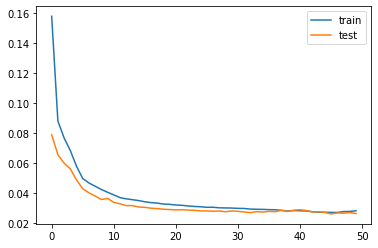

In [ ]:
# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [ ]:
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], n_hours*n_features))

19/19 [==============================] - 0s 4ms/step


In [ ]:
# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, -(n_features - 1):]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
yhat_168_4 = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, -(n_features - 1):]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
y_168_4 = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(y_168_4, yhat_168_4))
print('Test RMSE: %.3f' % rmse)

Test RMSE: 526.445


Text(0.5, 1.0, 'Kết quả dự đoán của mô hình LSTM tại Station4')

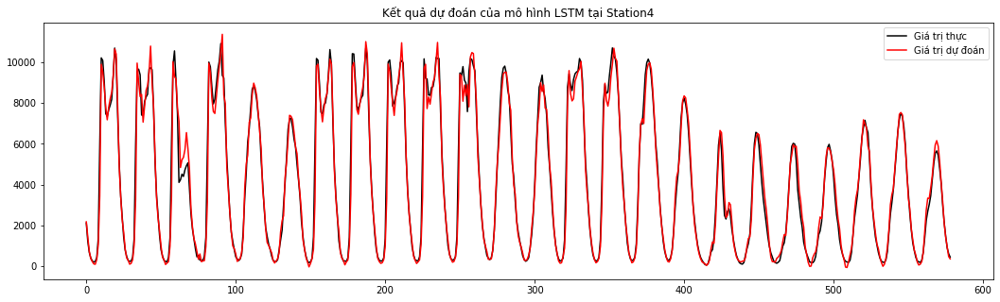

In [ ]:
plt.figure(figsize = (18, 5))
plt.plot(y_168_4, color = 'black')
plt.plot(yhat_168_4, color = 'red')
plt.legend(labels = ['Giá trị thực', 'Giá trị dự đoán'], loc = 'best')
plt.title('Kết quả dự đoán của mô hình LSTM tại Station4')

# **5. Dashboard thể hiện kết quả điền khuyết và dự đoán lưu lượng giao thông**

In [ ]:
!pip install jupyter_dash

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install dash-bootstrap-components

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import dash
import dash_core_components as dcc
import dash_html_components as html
import dash_bootstrap_components as dbc
import plotly.express as px
from jupyter_dash import JupyterDash
from dash.dependencies import Input, Output
import plotly.graph_objects as go

In [ ]:
JupyterDash.infer_jupyter_proxy_config()

In [ ]:
#Compenents 1 _ station1-a-wek
fig1 = go.FigureWidget()
na = findna(station1_a_week)
df = station1.iloc[na]
x = df.index
fig1.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig1.add_scatter(name = 'DTWBI', x = x, y = station1_a_week_dtwbi['Total'][na])
fig1.add_scatter(name = 'MICE', x = x, y = station1_a_week_mice['Total'][na])
fig1.add_scatter(name = 'SMWA', x = x, y = station1_a_week_SMWA['Total'][na])

#Compenents 2 _ station2-a-wek
fig2 = go.FigureWidget()
na = findna(station2_a_week)
df = station2.iloc[na]
x = df.index
fig2.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig2.add_scatter(name = 'DTWBI', x = x, y = station2_a_week_dtwbi['Total'][na])
fig2.add_scatter(name = 'MICE', x = x, y = station2_a_week_mice['Total'][na])
fig2.add_scatter(name = 'SMWA', x = x, y = station2_a_week_SMWA['Total'][na])

#Compenents 3 _ station3-a-wek
fig3 = go.FigureWidget()
na = findna(station3_a_week)
df = station3.iloc[na]
x = df.index
fig3.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig3.add_scatter(name = 'DTWBI', x = x, y = station3_a_week_dtwbi['Total'][na])
fig3.add_scatter(name = 'MICE', x = x, y = station3_a_week_mice['Total'][na])
fig3.add_scatter(name = 'SMWA', x = x, y = station3_a_week_SMWA['Total'][na])

#Compenents 4 _ station4-a-wek
fig4 = go.FigureWidget()
na = findna(station4_a_week)
df = station4.iloc[na]
x = df.index
fig4.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig4.add_scatter(name = 'DTWBI', x = x, y = station4_a_week_dtwbi['Total'][na])
fig4.add_scatter(name = 'MICE', x = x, y = station4_a_week_mice['Total'][na])
fig4.add_scatter(name = 'SMWA', x = x, y = station4_a_week_SMWA['Total'][na])

FigureWidget({
    'data': [{'name': 'Actual',
              'type': 'scatter',
              'uid': 'b4da3757…

In [ ]:
#Compenents 1 _ station1-a-month
fig5 = go.FigureWidget()
na = findna(station1_a_month)
df = station1.iloc[na]
x = df.index
fig5.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig5.add_scatter(name = 'DTWBI', x = x, y = station1_a_month_dtwbi['Total'][na])
fig5.add_scatter(name = 'MICE', x = x, y = station1_a_month_mice['Total'][na])
fig5.add_scatter(name = 'SMWA', x = x, y = station1_a_month_SMWA['Total'][na])

#Compenents 2 _ station2-a-month
fig6 = go.FigureWidget()
na = findna(station2_a_month)
df = station2.iloc[na]
x = df.index
fig6.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig6.add_scatter(name = 'DTWBI', x = x, y = station2_a_month_dtwbi['Total'][na])
fig6.add_scatter(name = 'MICE', x = x, y = station2_a_month_mice['Total'][na])
fig6.add_scatter(name = 'SMWA', x = x, y = station2_a_month_SMWA['Total'][na])

#Compenents 3 _ station3-a-month
fig7 = go.FigureWidget()
na = findna(station3_a_month)
df = station3.iloc[na]
x = df.index
fig7.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig7.add_scatter(name = 'DTWBI', x = x, y = station3_a_month_dtwbi['Total'][na])
fig7.add_scatter(name = 'MICE', x = x, y = station3_a_month_mice['Total'][na])
fig7.add_scatter(name = 'SMWA', x = x, y = station3_a_month_SMWA['Total'][na])

#Compenents 4 _ station4-a-month
fig8 = go.FigureWidget()
na = findna(station4_a_month)
df = station4.iloc[na]
x = df.index
fig8.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig8.add_scatter(name = 'DTWBI', x = x, y = station4_a_month_dtwbi['Total'][na])
fig8.add_scatter(name = 'MICE', x = x, y = station4_a_month_mice['Total'][na])
fig8.add_scatter(name = 'SMWA', x = x, y = station4_a_month_SMWA['Total'][na])

FigureWidget({
    'data': [{'name': 'Actual',
              'type': 'scatter',
              'uid': 'cf55da2c…

In [ ]:
#Compenents 1 _ station1-2-month
fig9 = go.FigureWidget()
na = findna(station1_2_months)
df = station1.iloc[na]
x = df.index
fig9.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig9.add_scatter(name = 'DTWBI', x = x, y = station1_2_months_dtwbi['Total'][na])
fig9.add_scatter(name = 'MICE', x = x, y = station1_2_month_mice['Total'][na])
fig9.add_scatter(name = 'SMWA', x = x, y = station1_2_month_SMWA['Total'][na])

#Compenents 2 _ station2-2-month
fig10 = go.FigureWidget()
na = findna(station2_2_months)
df = station2.iloc[na]
x = df.index
fig10.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig10.add_scatter(name = 'DTWBI', x = x, y = station2_2_months_dtwbi['Total'][na])
fig10.add_scatter(name = 'MICE', x = x, y = station2_2_month_mice['Total'][na])
fig10.add_scatter(name = 'SMWA', x = x, y = station2_2_month_SMWA['Total'][na])

#Compenents 3 _ station3-2-month
fig11 = go.FigureWidget()
na = findna(station3_2_months)
df = station3.iloc[na]
x = df.index
fig11.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig11.add_scatter(name = 'DTWBI', x = x, y = station3_2_months_dtwbi['Total'][na])
fig11.add_scatter(name = 'MICE', x = x, y = station3_2_month_mice['Total'][na])
fig11.add_scatter(name = 'SMWA', x = x, y = station3_2_month_SMWA['Total'][na])

#Compenents 4 _ station4-2-month
fig12 = go.FigureWidget()
na = findna(station4_2_months)
df = station4.iloc[na]
x = df.index
fig12.add_scatter(name = 'Actual', x = x, y = df['Total'])
fig12.add_scatter(name = 'DTWBI', x = x, y = station4_2_months_dtwbi['Total'][na])
fig12.add_scatter(name = 'MICE', x = x, y = station4_2_month_mice['Total'][na])
fig12.add_scatter(name = 'SMWA', x = x, y = station4_2_month_SMWA['Total'][na])

FigureWidget({
    'data': [{'name': 'Actual',
              'type': 'scatter',
              'uid': '1e34be3a…

In [ ]:
x = station1[8040:].index
#Component Predict - lag3
pre1 = go.FigureWidget()
pre1.add_scatter(name = 'Actual', x=x, y = y_3_1)
pre1.add_scatter(name = 'Predict', x=x, y = yhat_3_1)

pre2 = go.FigureWidget()
pre2.add_scatter(name = 'Actual', x=x, y = y_3_2)
pre2.add_scatter(name = 'Predict', x=x, y = yhat_3_2)

pre3 = go.FigureWidget()
pre3.add_scatter(name = 'Actual', x=x, y = y_3_3)
pre3.add_scatter(name = 'Predict', x=x, y = yhat_3_3)

pre4 = go.FigureWidget()
pre4.add_scatter(name = 'Actual', x=x, y = y_3_4)
pre4.add_scatter(name = 'Predict', x=x, y = yhat_3_4)

#Component Predict - lag24
pre5 = go.FigureWidget()
pre5.add_scatter(name = 'Actual', x=x, y = y_24_1)
pre5.add_scatter(name = 'Predict', x=x, y = yhat_24_1)

pre6 = go.FigureWidget()
pre6.add_scatter(name = 'Actual', x=x, y = y_24_2)
pre6.add_scatter(name = 'Predict', x=x, y = yhat_24_2)

pre7 = go.FigureWidget()
pre7.add_scatter(name = 'Actual', x=x, y = y_24_3)
pre7.add_scatter(name = 'Predict', x=x, y = yhat_24_3)

pre8 = go.FigureWidget()
pre8.add_scatter(name = 'Actual', x=x, y = y_24_4)
pre8.add_scatter(name = 'Predict', x=x, y = yhat_24_4)

#Component Predict - lag168
pre9 = go.FigureWidget()
pre9.add_scatter(name = 'Actual', x=x, y = y_168_1)
pre9.add_scatter(name = 'Predict', x=x, y = yhat_168_1)

pre10 = go.FigureWidget()
pre10.add_scatter(name = 'Actual', x=x, y = y_168_2)
pre10.add_scatter(name = 'Predict', x=x, y = yhat_168_2)

pre11 = go.FigureWidget()
pre11.add_scatter(name = 'Actual', x=x, y = y_168_3)
pre11.add_scatter(name = 'Predict', x=x, y = yhat_168_3)

pre12 = go.FigureWidget()
pre12.add_scatter(name = 'Actual', x=x, y = y_168_4)
pre12.add_scatter(name = 'Predict', x=x, y = yhat_168_4)

FigureWidget({
    'data': [{'name': 'Actual',
              'type': 'scatter',
              'uid': '3eada326…

In [ ]:
# Build App
app = JupyterDash(__name__, external_stylesheets=[dbc.themes.BOOTSTRAP, dbc.icons.BOOTSTRAP])
app.layout = html.Div([
    dbc.Row([
        html.H1("So sánh các phương pháp điền khuyết", style = {'color': 'darkcyan', 'text-align': 'center'})
    ]),
    dbc.Row([
        dbc.Col([
              html.Label(['Choose station: ']),
              dcc.Dropdown(
                id='column-dropdown1', clearable=False,
                value = 'station1', options=[
                  {'label': 'Station1', 'value': 'station1'},
                  {'label': 'Station2', 'value': 'station2'},
                  {'label': 'Station3', 'value': 'station3'},
                  {'label': 'Station4', 'value': 'station4'} 
            ])
    ], width = {'size':5}),
        dbc.Col([
              html.Label(['Choose time: ']),
              dcc.Dropdown(
                id='column-dropdown2', clearable=False,
                value = 'A week', options=[
                  {'label': 'A week', 'value': 'A week'},
                  {'label': 'A month', 'value': 'A month'},
                  {'label': '2 months', 'value': '2 months'} 
            ])
    ], width = {'size':5}),
    dbc.Row([dcc.Graph(id = 'fig')])
  ]),
    dbc.Row([
        html.H1("Kết quả dự đoán sử dụng model LSTM", style = {'color': 'darkcyan', 'text-align': 'center'})
    ]),
    dbc.Row([
        dbc.Col([
            html.Label(['Choose station: ']),
            dcc.Dropdown(
                id='column-dropdown3', clearable=False,
                value = 'station1', options = [
                    {'label': 'Station1', 'value': 'station1'},
                    {'label': 'Station2', 'value': 'station2'},
                    {'label': 'Station3', 'value': 'station3'},
                    {'label': 'Station4', 'value': 'station4'}
            ])
        ], width = {'size':5}),
        dbc.Col([
            html.Label(['Choose lag value: ']),
            dcc.Dropdown(
               id = 'column-dropdown4', clearable=False,
               value = '3', options = [
                   {'label': '3 giờ', 'value': 3},
                   {'label': '24 giờ', 'value': 24},
                   {'label': '168 giờ', 'value': 168}
            ])
        ], width = {'size':5}),
        dbc.Row([dcc.Graph(id='fig1')])
    ])
])
@app.callback(
    Output("fig", "figure"), 
    [Input("column-dropdown1", "value"),
     Input("column-dropdown2", "value")]
)

def generate_fig(station, time):
  if station == 'station1':
    if time == 'A week':
      return fig1
    elif time == 'A month':
      return fig5
    else:
      return fig9
  elif station == 'station2':
    if time == 'A week':
      return fig2
    elif time == 'A month':
      return fig5
    else:
      return fig10
  elif station == 'station3':
    if time == 'A week':
      return fig3
    elif time == 'A month':
      return fig7
    else:
      return fig11
  else: 
    if time == 'A week':
      return fig4
    elif time == 'A month':
      return fig8
    else:
      return fig12 

@app.callback(
    Output("fig1", "figure"), 
    [Input("column-dropdown3", "value"),
     Input("column-dropdown4", "value")]
)

def generate_pre(station, lag):
  if station == 'station1':
    if lag == 3:
      return pre1
    elif lag == 24:
      return pre5
    else:
      return pre9
  elif station == 'station2':
    if lag == 3:
      return pre2
    elif lag == 24:
      return pre6
    else:
      return pre10
  elif station == 'station3':
    if lag == 3:
      return pre3
    elif lag == 24:
      return pre7
    else:
      return pre11
  else: 
    if lag == 3:
      return pre4
    elif lag == 24:
      return pre8
    else:
      return pre12
 

# Run app and display result inline in the notebook
app.run_server(mode='inline')

<IPython.core.display.Javascript object>